In [1]:
import pickle
import pandas as pd
import numpy as np
import torch
import transformers
import bitsandbytes as bnb
import networkx as nx
import random

random_state = 1

random.seed(random_state)

In [2]:
def euclid(list1, list2):
    return sum((p-q)**2 for p, q in zip(list1, list2)) ** .5

In [3]:
with open('df_annotations_embeddings.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."
2533,R2021_World Duty Free v,5,prem,H10,General Court err law concluding therefrom par...,F,NaN,"[1.6494140625, -1.5732421875, -0.857421875, 1...."


In [4]:
df_train = df[df['Split'] != 2]
df_train

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."
2533,R2021_World Duty Free v,5,prem,H10,General Court err law concluding therefrom par...,F,NaN,"[1.6494140625, -1.5732421875, -0.857421875, 1...."


In [5]:
df_train_prem = df_train[df_train['Name'] == 'prem']
df_train_prem

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2529,R2021_World Duty Free v,5,prem,H6bis,hand General Court rightly pointed paragraph 2...,L,Itpr,"[1.4169921875, -1.34765625, -0.240234375, 1.42..."
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."


In [6]:
df_train_conc = df_train[df_train['Name'] == 'conc']
df_train_conc

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
13,A2008_Commission of the European Communities v...,1,conc,A14,Accordingly first limb first plea cannot succe...,NaN,NaN,"[1.029296875, -0.256591796875, 0.399658203125,..."
15,A2008_Commission of the European Communities v...,1,conc,B2,second limb must therefore rejected,NaN,NaN,"[0.387451171875, -0.2332763671875, 1.533203125..."
17,A2008_Commission of the European Communities v...,1,conc,C2,Consequently third limb first plea law must re...,NaN,NaN,"[1.0478515625, -0.40185546875, 0.242919921875,..."
26,A2008_Commission of the European Communities v...,1,conc,D9,Therefore second plea crossappeal alleging fai...,NaN,NaN,"[-0.0212249755859375, -0.7119140625, -0.470458..."
30,A2008_Commission of the European Communities v...,1,conc,E4,Therefore Commission’s second plea must reject...,NaN,NaN,"[0.525390625, -0.33203125, -0.2159423828125, 1..."
...,...,...,...,...,...,...,...,...
2505,R2021_World Duty Free v,5,conc,D19,light considerations must concluded notwithsta...,NaN,NaN,"[1.2392578125, -0.9609375, -1.2236328125, 2.16..."
2512,R2021_World Duty Free v,5,conc,E7,third part WDFG’s single ground appeal fourth ...,NaN,NaN,"[1.09765625, -0.79638671875, -1.0302734375, 1...."
2516,R2021_World Duty Free v,5,conc,F4,Consequently fourth part WDFG’s single ground ...,NaN,NaN,"[0.892578125, -0.378173828125, 0.55224609375, ..."
2522,R2021_World Duty Free v,5,conc,G6,follows fifth part WDFG’s single ground appeal...,NaN,NaN,"[1.2802734375, -0.309814453125, -0.27685546875..."


In [7]:
df_test = df[df['Split'] == 2]
df_test

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
171,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A1,According Commission argument put forward appe...,F,NaN,"[1.6826171875, -0.91259765625, -1.3779296875, ..."
172,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A2,regard must observed follows Article 58 Statut...,L,"[Prec, Rule]","[0.5068359375, -1.6494140625, -0.43408203125, ..."
173,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A3,However clear contrary Commission’s contention...,F,NaN,"[1.1826171875, -0.26806640625, -1.0615234375, ..."
174,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A4,Therefore even assuming argument expressed app...,F,NaN,"[1.2353515625, -0.330810546875, -0.15393066406..."
175,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,conc,A5,follows argument admissible,NaN,NaN,"[0.71728515625, 0.11212158203125, 1.1337890625..."
...,...,...,...,...,...,...,...,...
2133,R2017_European Commission v Frucona Košice a,2,prem,D23,second place far Commission claims errors law ...,F,NaN,"[1.0791015625, -0.86865234375, -1.0322265625, ..."
2134,R2017_European Commission v Frucona Košice a,2,prem,D24,Moreover paragraphs 279 282 283 judgment appea...,F,NaN,"[0.68603515625, -1.6240234375, 0.56103515625, ..."
2135,R2017_European Commission v Frucona Košice a,2,prem,D25,considerations far concern information normall...,"[F, L]",Prec,"[0.62255859375, -1.1865234375, -0.74951171875,..."
2136,R2017_European Commission v Frucona Košice a,2,prem,D26,Furthermore follows paragraphs 69 84 present j...,F,NaN,"[0.84228515625, -1.5498046875, -0.044708251953..."


In [8]:
device = torch.device('cuda')
model_id = "meta-llama/Meta-Llama-3.1-8B-Instruct"

In [9]:
pipeline = transformers.pipeline(
    "text-generation",
    model=model_id,
    model_kwargs={"torch_dtype": torch.bfloat16,
                  "quantization_config": {"load_in_4bit": True}},
    device_map="cuda:0"
)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Device set to use cuda:0


In [10]:
prem_training_graph = pickle.load(open('premgraph_task1_.005.pickle', 'rb'))
conc_training_graph = pickle.load(open('concgraph_task1_.005.pickle', 'rb'))


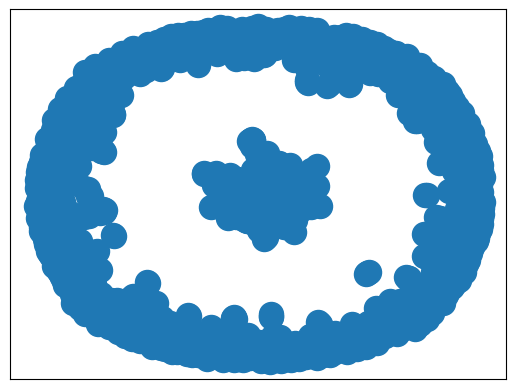

In [11]:
nx.draw_networkx(prem_training_graph, with_labels = False)

In [12]:
average_degs = sum([prem_training_graph.degree[i] for i in prem_training_graph])/len(prem_training_graph), sum([conc_training_graph.degree[i] for i in conc_training_graph])/len(conc_training_graph)
average_degs

(10.148768472906404, 0.6956521739130435)

In [13]:
def test(template, nexamples):

    count = 0
    premTP = 0
    premFN = 0
    premFP = 0
    concTP = 0
    concFN = 0
    concFP = 0
    countprem = 0
    countconc = 0

    for i in range(len(df_test)):

        prem_subgraph_radius = 20.97              #SET MANUALLY, on the training set, on average these yield a subgraph of size (N*25)**0.5
        conc_subgraph_radius = 24.41

        query = 'Text: '+ df_test.iloc[i]['Text']+'\n'+'Answer: '

        prem_test_graph = prem_training_graph.copy()     
        conc_test_graph = conc_training_graph.copy()


        for j in range(len(prem_training_graph)):
            if euclid(df_train_prem.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > prem_subgraph_radius:
                prem_test_graph.remove_node(j)


        while(len(prem_test_graph) < (nexamples+1)//2):     #If the subgraph doesn't have enough nodes, increment the radius
            prem_subgraph_radius *= 1.1
            prem_test_graph = prem_training_graph.copy()
            for j in range(len(prem_training_graph)):
                if euclid(df_train_prem.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > prem_subgraph_radius:
                    prem_test_graph.remove_node(j)
            #print(subgraph_radius)
        print('prem_test_graph:', len(prem_test_graph),'nodes')
        countprem += len(prem_test_graph)

        for j in range(len(conc_training_graph)):
            if euclid(df_train_conc.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > conc_subgraph_radius:
                conc_test_graph.remove_node(j)


        while(len(conc_test_graph) < (nexamples+1)//2):     #If the subgraph doesn't have enough nodes, increment the radius
            conc_subgraph_radius *= 1.1
            conc_test_graph = conc_training_graph.copy()
            for j in range(len(conc_training_graph)):
                if euclid(df_train_conc.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > conc_subgraph_radius:
                    conc_test_graph.remove_node(j)
            #print(subgraph_radius)
        print('conc_test_graph:', len(conc_test_graph),'nodes')
        countconc += len(conc_test_graph)





        
        prem_selected_nodes = []
        conc_selected_nodes = []
        prem_communities = nx.community.louvain_communities(prem_test_graph, seed = random_state)
        prem_sorted_communities = sorted(prem_communities, key = lambda x: len(x), reverse = True)
        conc_communities = nx.community.louvain_communities(conc_test_graph, seed = random_state)
        conc_sorted_communities = sorted(conc_communities, key = lambda x: len(x), reverse = True)
        #print(sorted_communities)
        #print(len(sorted_communities))



        if len(prem_sorted_communities) >= (nexamples+1)//2:    #If there are enough communities:
            for l in range((nexamples+1)//2):
                prem_subgraph = prem_test_graph.subgraph(prem_sorted_communities[l])
                prem_selected_nodes.append(sorted(nx.pagerank(prem_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(prem_selected_nodes) < (nexamples+1) //2:
                prem_selected_nodes = []
                for element in prem_sorted_communities:
                    prem_subgraph = prem_test_graph.subgraph(element)
                    prem_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(prem_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1

        if len(conc_sorted_communities) >= (nexamples+1)//2:    #If there are enough communities:
            for l in range((nexamples+1)//2):
                conc_subgraph = conc_test_graph.subgraph(conc_sorted_communities[l])
                conc_selected_nodes.append(sorted(nx.pagerank(conc_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(conc_selected_nodes) < (nexamples+1) //2:
                conc_selected_nodes = []
                for element in conc_sorted_communities:
                    conc_subgraph = conc_test_graph.subgraph(element)
                    conc_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(conc_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1
            #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        
        prem_selected_nodes = prem_selected_nodes[:(nexamples+1)//2]     #The final chosen demonstrations
        conc_selected_nodes = conc_selected_nodes[:(nexamples+1)//2]
        print('Selected Nodes:', prem_selected_nodes)

        examples_text = []
        
        for el in list(range((nexamples+1)//2)):
            examples_text.append('Text: '+ df_train_prem.iloc[prem_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ df_train_prem.iloc[prem_selected_nodes[el]]['Name']+'\n\n')
            examples_text.append('Text: '+ df_train_conc.iloc[conc_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ df_train_conc.iloc[conc_selected_nodes[el]]['Name']+'\n\n')

        random.shuffle(examples_text)

        examples_text = examples_text[:nexamples]

        text_examples = ''      #Building text examples

        for el in examples_text:
            text_examples += el
        
        print('query:\n'+ query,'\n')
        print('retrieved examples:\n\n'+ text_examples,'\n\n')

        messages = [{'role': 'system', 'content': template},{"role": "user", "content": text_examples},{"role": "user", "content": query}]

        outputs = pipeline(
            messages,
            max_new_tokens=10,
            do_sample = False
        )
        final_output = outputs[0]['generated_text'][-1]['content']
        print('LLM output:', final_output)
        print('ground truth:', df_test.iloc[i]['Name'])
        print(200*'-')

        if final_output == 'prem':
            if df_test.iloc[i]['Name'] == 'prem':
                premTP += 1
            else: 
                premFP += 1
                concFN += 1
        
        else:
            if df_test.iloc[i]['Name'] == 'prem':
                concFP += 1
                premFN += 1
            else:
                concTP += 1
        
    premPREC = premTP/(premTP+premFP)
    premREC = premTP/(premTP+premFN)
    concPREC = concTP/(concTP+concFP)
    concREC = concTP/(concTP+concFN)

    premF1 = 2/((1/premPREC)+(1/premREC))
    concF1 = 2/((1/concPREC)+(1/concREC))

    print('premise F1:', premF1)
    print('conclusion F1:', concF1)

    print('macro F1:', (premF1+concF1)/2 )

    print('On average, extracted subgraphs contain',countprem/len(df_test),'premises and', countconc/len(df_test),'conclusions')
            


In [14]:
template = '''Classify the following argumentative text as premise 'prem' or conclusion 'conc'. A premise (prem) is a proposition that provides a reason or support for the argument. A conclusion (conc) is the statement that follows logically from the premise(s) and represents the final point being argued for. Only reply with 'prem' or 'conc'\nExamples:'''

In [15]:
test(template, 5)

prem_test_graph: 3 nodes


C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:628: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:633: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [793, 1097, 1150]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [918, 1203, 688]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: appeal Courts jurisdiction thus confined review findings pleas argued Court First Instance see Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 order 28 June 2001 Case C35299 P Eridania Others v Council 2001 ECR I5037 paragraphs 52 53
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qual

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [793, 1953, 1543]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1471, 1658, 1952]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply interpreted decision light actual content
Answer: prem

Text: regard must recalled held context first second pleas law neither compensatory nature measures fact justified social objective precludes payments made ELGA classified advantage
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

 


LLM

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1629, 123, 1913]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: follows fifth plea well founded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1596, 1840, 1868]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: case single ground appeal rel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1625, 1768, 688]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: regard Court held numerous occasions objective pursued measures State

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [231, 1551, 1780]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: prem

Text: regards first argument must recalled accord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [334, 1207, 1383]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: contrast action annulment defined particular pleas law relied applicant
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1439, 658, 1322]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different se

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [909, 315, 1510]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

 


LLM output: conc
ground truth: prem
------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1025, 1284, 1188]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commission 2003 ECR I‑1139 paragraph 44
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows length preliminary examination procedure constitute indication Commission may doubts regarding compatibility aid question common mar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [649, 1217, 1557]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed plea alleging infringement principle good administration without stating specific reasons judgment appeal regard
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1547, 1572, 45]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [688, 866, 331]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [173, 191, 1175]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: prem

Text: Sin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1780, 1920, 1188]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 Decem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1859, 1089, 190]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: particular aid implemented without prior notification Commission result unlawful Article 883 EC recipient aid cannot time legitimate expectation grant lawful see Joined Cases C‑18302 P C‑18702 P Demesa Territorio Histórico de Álava v Commission 2004 ECR I‑10609 paragraphs 44 45 caselaw cited
Answer: prem

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 Septem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [342, 601, 990]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [725, 1000, 1011]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [690, 1388, 1181]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: prem

Text: General Court recalled paragraph 26 judgment appeal persons dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [837, 1404, 1093]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: also observed adoption decision least significant element doubt legality measure course implementation must lead Member State suspend application decision may also invoked national court called upon draw appropriate conclusions arising infringement last sentence Article 1083 TFEU
Answer: prem

Text: regards possible relevance exceptional circumstances may give rise notwithstanding considerations set preceding paragraph legitimate expectation aid lawful sufficient note General Court err law assessing circumstances course detailed examination paragraphs 263 269 judgment appeal arguments relied regard
Answer: prem

Text: Since cannot ruled organisations representing workers undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1146, 254, 944]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertaking placed means State resources favourable position competitors see effect Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Case C697 Italy v Commission paragraph 16
Answer: prem

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 M

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [300, 299, 424]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 16 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [407, 173, 47]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1453, 1818, 1827]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 24 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1517, 675, 109]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social natur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [793, 1886, 1572]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: hand General Court rightly pointed par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1543, 1006, 788]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: clear paragraph 76 judgment appeal Court First Instance aware specific nature tax regime applicable horserace betting France also took account
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: follows third part second plea law relating extent obligation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [315, 1256, 860]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

Text: clear paragraphs 34 36 present judgment contested decision entails implementing measures Member State concerned regard Telefónica
Answer: prem

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1890, 1997, 837]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied WDFG support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdings resident companies nonresident companies comparable light objective fiscal neutrality pursued measure issue
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [641, 638, 733]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impossibility recovery
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: addition argument support judgment appeal cannot case based judgment 18 July 2013 P C‑612 EUC2013525 since judgment Court rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [342, 537, 578]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [793, 1142, 586]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: first part first plea a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1361, 123, 1166]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 7 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [965, 1825, 1166]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
----------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [915, 1001, 793]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 4 nodes
conc_test_graph: 3 nodes
Selected Nodes: [554, 785, 1174]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 6 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [549, 1450, 1532]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [627, 1450, 317]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [793, 1221, 1572]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3F merely repeats without identifying passages judgment appeal supposedly w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1793, 1860, 1616]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1011, 1289, 673]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: also follows function repa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1001, 1150, 1556]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1130, 1331, 453]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C760

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1009, 1011, 517]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore establish existence aid within meaning Article 1071 TFEU see effect judgment 15 July 2004 Spain v Commission C‑50100 EUC2004438 paragraph 121
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court su

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [115, 452, 580]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concerned within meaning fourth paragraph Article 263 TFEU see effect judgment 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraphs 34 35 see also judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 53
Answer: prem

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1038, 1328, 1041]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: includes positive benefits also measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Joined Cases C‑7808 C‑8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer: prem

Text: established caselaw Article 871 EC distinguish causes objectives State aid defines relation effects see Case C‑40900 Spain v Commission 2003 ECR I‑1487 paragraph 46 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [309, 1130, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [476, 1450, 317]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1110, 1269, 1786]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguish

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1857, 1794, 257]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1439, 154, 1263]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1898, 1760, 336]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: determinatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1928, 1804, 357]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: Commission considered justification distinction operators relied Kingdom Spain based nature general structure system measure formed part could accepted
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1594, 1059, 1343]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court err law finding paragraphs 98 103 judgment appeal tax paytelevision operators DTS liable comparable asymmetrical tax issue case gave rise Laboratoires Boiron judgment
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [337, 2002, 1760]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Since arguments summari

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [304, 1138, 77]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Member State concerned took decision make investment means measure actually implemented public undertaking
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1799, 2021, 590]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1570, 1059, 1630]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: General Court verified genuine tax differential paragraphs 219 225 judgment without findings regard called question FT
Answer: prem

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

 


LLM output: prem
ground truth: prem
---------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [254, 331, 264]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essenti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1857, 260, 785]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 6 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [252, 537, 622]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must comp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [613, 1064, 1954]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1432, 1857, 123]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 5 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [317, 331, 1231]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [541, 1349, 1324]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court ens

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [331, 619, 1824]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general subject tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 91
Answer: prem

Text: Since cannot ruled organisations representing workers undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [316, 1168, 504]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: already noted paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [621, 623, 1161]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: consequence would national tax rules fall outset outside scope control State aid account sole fact adopted different regulatory technique although adjusting combining various tax rules produce effects law andor fact
Answer: prem

Text: Consequently Court First Instance committed error law holding fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [311, 495, 613]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since cannot ruled organisations representin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1456, 1592, 1992]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Admittedly General Court referred paragraphs 117 119 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Moreov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [2010, 1547, 1860]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1054, 334, 847]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1889, 2029, 1864]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Consequently Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [311, 313, 1064]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 8 September 2011 Paint Graphos Others C‑7808 C‑8008 EUC2011550 paragraph 49
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enact

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1799, 1547, 1064]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [236, 334, 1054]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [232, 179, 1053]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text: fact FT’s liability professional tax indeed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1092, 1852, 1991]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: far FT argues obligation notify established advantage noted neither purported complexity tax regime issue periodic nature aid measure release Member State obligation notify give rise legitimate expectation part company receiving aid
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1788, 1043, 1074]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: particular company benefited specific tax treatment national level characterised fact business tax calculated basis weighted average rate opposed various rates applicable different local authorities whereas rates undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [300, 921, 169]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: However reasoning relating attributability exemptions issue dealt paragraphs 73 74 98 99 104 judgment appeal constitutes one element grounds

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [311, 495, 613]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature alt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1913, 295, 446]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: follows first plea must rejected
Answer: conc

Text: provision sets four conditions
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [492, 1139, 339]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1943, 2002, 327]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1818, 1543, 1953]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1117, 151, 840]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently holding paragraph 140 judgment appeal Commission infringed principle protection legitimate expectations allowing KFC benefit transitional scheme provided contested decision Court First Instance erred law
Answer: prem

Text: Consequently second part first ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [337, 1060, 1572]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning adopted Commission contested decision
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: contrast stated paragraph 63 judgment contes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1361, 236, 778]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 6 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [2000, 79, 1578]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: appellant considered analysis contrary one hand Commission’s previous decisionmaking practice notice
Answer: prem

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [334, 1065, 1158]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Indeed virtue special regime FT required pay business tax amounts would normally liable general law tax regime
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [349, 436, 492]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: prem

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made ori

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [863, 1389, 1556]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [342, 1433, 619]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently fail

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [162, 1786, 1456]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appell

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1067, 331, 628]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [541, 1067, 351]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [411, 1781, 1793]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: follows paragraphs 74 76 Ryanair ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [310, 987, 311]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [391, 1259, 522]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

 


LLM output: prem
ground truth: prem
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1850, 1942, 1589]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Last regards appellant’s argument restriction early depreciation assets financed leasing contracts objectively justified clear Article 115 LIS governs leasing contracts
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1543, 838, 1091]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: regard present dispute accepted tax regime issue introduced Law 90‑568 notified Commission
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [50, 60, 393]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: third ground appeal based premise General Court erred law regards appraisal Commission’s assessment value land relating Cassandra mining operations
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission’s argument judgment ATM sufficient ground rejecting appellant’s arguments relating competitive position cannot accepted
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court accepted Albany restrictions competition inherent collective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1854, 1993, 586]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [2009, 1771, 1168]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: already noted paragraphs 83 85 purposes applying private investor test relevant evidence information available developments foreseeable time decision make investment taken
Answer: prem

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [162, 1523, 1920]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: However fact remains although Hellenic Republic claimed General Court Article 1073b TFEU ought applied directly facts case notwithstanding existence rules conduct set TCF amended TCF argue support claim present case specific exceptional circumstances primary agricultural sector concerned referred paragraphs 70 72 judgment
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [547, 1080, 1579]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1920, 519, 21]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [337, 1572, 1889]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [466, 1492, 1591]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1794, 1933, 667]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1114, 1875, 1078]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: circumstances General Court entitled find paragraph 213 judgment appeal fixed levy must regarded charge connected introduction special tax regime rather special tax mechanism FT established years prior 1994
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1492, 1591, 1740]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

 


LLM output: prem
ground truth: prem
----------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [466, 921, 586]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: follows foregoing without 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1150, 1481, 1078]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1056, 1953, 667]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 4 nodes
conc_test_graph: 5 nodes
Selected Nodes: [123, 716, 1595]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows fifth plea well founded
Answer: conc

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 23 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1628, 1574, 854]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Second regards appellants interest bringing proceedings part cont

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [795, 1114, 921]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1726, 1607, 311]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1006, 1543, 466]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: stated

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1080, 1943, 1337]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1246, 1560, 1579]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: General Court responded argument paragraphs 107 111 judgment appeal follows ‘It must observed according paragraph 31 contested decision conditions imposed notified measure restrict possibility early depreciation certain assets
Answer: prem

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1854, 1064, 1589]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: also explained reference recitals 28 123 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ paragraph 107 judgment appeal
Answer: prem

Text: Last regards appellant’s argument restr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1080, 279, 365]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard particular unlawful aid granted form tax advantage also Court’s settled caselaw recovery aid means transactions actually carried recipients aid question must subject tax treatment recipients would received absence unlawful aid see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 119
Answer: prem

Text: Conseque

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [937, 1346, 528]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: However present case amount aid determined apparent paragraphs 69 71 present judgment net costs fulfilling public s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [504, 1042, 423]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs benefited three tax measures referred Article 1 decision issue conclusion incorrectly applies Article 1071 TFEU
Answer: prem

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: Accordingly second part firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [541, 708, 884]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [304, 1224, 317]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [494, 601, 690]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [208, 669, 1130]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: test a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [337, 1161, 1936]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: contrast stated paragraph 63 judgment contested decisions Commission order establi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [252, 342, 157]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [386, 817, 1568]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Accordingly General Court cannot reproached infringed obligation state reasons way
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently General Court examined possibility de facto selectivity
Answer: prem

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 8 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [331, 618, 627]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualify

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [476, 1977, 1184]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

 


LLM output: conc
ground truth: conc
---------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [958, 963, 1090]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Moreover Court held aid notified Commission apparent failure act part rela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [685, 394, 958]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 18 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [157, 1859, 131]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Court First Instance correctly held paragraphs 59 66 judgment appeal fact sufficient procure ‘advantage’ KFC purposes case‑law mentioned paragraph 63 judgment
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: certain pleas may indeed must raised co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [21, 502, 809]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 8 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [388, 1818, 965]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: preliminary point must observed Commission abandoned claims ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [115, 478, 584]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner Joined Cases 6785 6885 7085 Kwekeriij van der Kooy Others v Commission 1988 ECR 219 paragraph 15 Case C‑692 Federmineraria Others v Commission 1993 ECR I‑6357 paragraph 14 Joined Cases C‑1598 C‑10599 Italy Sardegna Lines v Commission 2000 ECR I‑8855 paragraph 33
Answer: prem

Text: According judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [260, 1721, 1851]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: appellant also submits event assertion tax provisions goodwill pursue objective arbitrary unfounded
Answer: prem

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: appellants shown evidence sufficient justify legitimate expectation alleged
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 6 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1056, 1648, 826]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: respect judgment Court First Instance submission vitiated defective reasoning event inadequate statement grounds
Answer: prem

Text: Accordingly clear distortion alleged manifestly apparent documents Court arguments Orange fact asking Court carry fresh assessment facts evidence falls outside Court’s jurisdiction
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

 


LLM output: prem
ground tru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1818, 1957, 1281]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: event must stated MOL contends cases giving rise judgments Court Justice addressed issue whether beneficiaries State aid schemes selected basis objective criteria
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows General Court cannot criticised held among 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [225, 785, 850]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes
conc_test_graph: 4 nodes
Selected Nodes: [1303, 716, 1742]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows appeal may rejected inadmissible ground exceeds certain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 12 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [838, 1825, 1361]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

 


LLM output: prem
ground truth: prem
-------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1796, 1709, 1866]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: appellant complains General Court substituted reasoning decision issue ruling possibility measure issue might constitute reference system right
Answer: prem

Text: Furthermore contrary appellants claim cannot regarded extension first plea action General Court alleged 2004 letter Commission adopted position proposed scheme promotion electricity production RES decision
Answer: prem

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejected grounds set paragraphs 39 41
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [474, 1376, 1977]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [958, 963, 1090]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

 


LLM output: prem
ground truth: prem
----------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1811, 1942, 1168]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: already noted

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [578, 588, 353]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Likewise General Court err law paragraphs 75 76 judgment appeal rejecting Commission’s argument advantage effectively granted State resources could establish HBH individually concerned basis judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1284, 162, 1144]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards question whether applicability private investor test could ruled pres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [227, 1813, 1309]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing Court considers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [236, 557, 1303]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [958, 963, 1090]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

 


LLM output: prem
ground truth: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1858, 1537, 956]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: necessary however examine whether notwithstanding err

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [918, 957, 1203]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: appeal Court’s jurisdiction thus confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C795 P Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringeme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [958, 963, 1090]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Moreover Court held aid notified Commission apparent failure act part relation measure irrelevant see Demesa Territorio Histόrico de Álava v Commission paragraph 52
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

 


LLM output: prem
ground truth: prem
-

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [724, 1425, 1179]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: prem

Text: case Member State Commission must virtue principle sincere cooperation work together good faith view overcoming difficulties fully observing provisions FEU Treaty particular aid see effect judgments 2 July 2002 Commission v Spain C‑49999 EUC2002408 paragraph 24 22 December 2010 Commission v Italy C‑30409 EUC2010812 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1804, 1808, 1139]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reaso

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [852, 1571, 1630]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court First Instance analysed separate question paragraphs 44 50 judgment appeal
Answer: prem

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1572, 1889, 962]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [845, 964, 1756]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Indeed appellant could thus base appeal pleas law arguments already relied Court First Instance appeal would deprived part purpose
Answer: prem

Text: reasons stated paragraph 59 judgment ground appeal must declared inadmissible new plea must ground appeal alleging failure state grounds judgment appeal point latter cannot dissociated former
Answer: prem

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: Therefore second plea crossappeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 3 nodes
Selected Nodes: [123, 1303, 716]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1338, 1475, 1916]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Hellenic Republic shown Commission erred classifying payments State aid
Answer: prem

Text: WDFG Kingdom Spain refer particular paragraphs 92 140 judgment appeal
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows fifth part WDFG’s single ground appeal must rejected ineffective
Answer: conc

Text: Consequently fourth part WDFG’s single ground appeal must also rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 14 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1689, 1283, 50]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: prem

Text: Commission’s argument judgment ATM sufficient ground rejecting appellant’s arguments relating competitive position cannot accepted
Answer: prem

Text: Accordingly first part second plea law Italian Republic allege

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [863, 998, 1142]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1819, 1224, 1456]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ry

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1453, 1526, 1564]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Secondly Hellenic Republic indicated sufficient precision complaints put forward first instance General Court respond
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
----------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [717, 396, 536]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1314, 988, 1570]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [64, 1187, 1314]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: thus follows Albany later judgments confirmed Albany competent authorities courts consider individual case whether nature purpose agreement question social policy objectives pursued warrant exclusion scope Article 811 EC see effect inter alia Case C‑22298 Van der Woude 2000 ECR I‑7111 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1984, 1201, 1619]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Accordingly Orange’s line argument enable Court ascertain whether rejected company’s objection Commission chosen incorrect reference framework General Court committed errors law error based failure take account French State’s objectives
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal aut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [639, 733, 925]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: follows foregoing first part HBH’s second ground appeal well founded without necessary examine second part argument put forward support
Answer: prem

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impossibility recovery
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1541, 878, 924]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly plea admissible
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly appeal must held admissible
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [17, 536, 1697]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [18, 1314, 1793]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [316, 538, 1581]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: prem

Text: light consi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [337, 1797, 1547]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [944, 1251, 1144]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [313, 352, 1025]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [543, 542, 1251]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifyi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [885, 1639, 1804]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: regard condition relating rules applicable agricultural sector concerned made subject decision 3 July 1991 obligation prior notification planned aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: regard fact economic sector s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [205, 316, 458]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [159, 161, 1694]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [840, 1270, 235]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable influence decisionmaking process private creditor must noted regard arguments evidence produced Frucona Košice administrative procedure matters pointed paragraphs 78 81 Commission required set contested decision least summary form considerations l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1004, 66, 1788]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Court First Instance inferred paragraph 94 contested judgment aid dispute strengthened financial position hence scope commercial haulage companies Region visàvis competitors might accordingly affect trade Member States
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision secon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1572, 1886, 837]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: case General Court entitled tak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [793, 816, 1001]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission en

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [337, 1797, 340]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished undertakings excluded advantage
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [597, 793, 863]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [915, 988, 587]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgment since consist applying criterion individual concern laid judgment 15 July 1963 Plaumann v Commission 2562 EUC196317 circumstances present case specific expr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [364, 1423, 793]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [337, 1936, 663]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: essence although Commission decision dismissed possibility autonomou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [423, 492, 906]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [533, 641, 1095]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: stated paragraphs 59 60 recipient aid cannot principle rely considerations based principle protection legitimate expectations aid question notified Commission
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: follows main appeal must upheld judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1121, 1886, 1860]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [735, 1490, 572]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: present case first common ground General Court observed paragraph 57 judgment appeal contested decision addressed solely Federal Republic Germany
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Furthermore paragraph General Court referred findings made context examination first second pleas law action annulment
Answer: prem

 


LLM output: prem
ground truth: prem
--------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [371, 522, 906]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: contested decision Commission indicated sector processing marketing agricultural products State aid must meet criteria selection investments set Decision 94173
Answer: prem

Text: state affairs inconsistent recognition positive value mine regard definition adopted Commission mine ‘nearp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1547, 1936, 1681]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose exp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 9 nodes
Selected Nodes: [123, 1303, 716]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [127, 1859, 1998]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6677 paragraph 23 Case C‑27701 P Parliament v Samper 2003 ECR I‑3019 paragraphs 30 31 order 5 March 2009 Case C‑18308 P Commission v Provincia di Imperia paragraph 19 case‑law cited
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [373, 717, 1368]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1124, 735, 1976]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: noted paragraph 93 General Court upheld first part decision issue despite fact Commission omitted carry decision detailed examination whether second conditions met
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court therefore entitled find contested decision vitiated unlawfulness simply refers indicative range regards amount aid recovered
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

 


LL

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [388, 1554, 1648]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly clear distortion alleged manifestly apparent documents Court arguments Orange fact asking Court carry fresh assessment facts evidence falls outside Court’s jurisdiction
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: Accordingly mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1263, 1985, 791]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: contrary applied three criteria interpretation derived three propositions set paragraph 5 judgment order reach conclusion reduction amounted State aid reform form tax adjustment justified nature economy system question
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1541, 1550, 1573]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1278, 1553, 1604]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: Moreover Orange argued General Court Commission’s choice reference framework purpose determining whether enjoyed economic advantage scheme applicable France Télécom 1990 Law opposed scheme applicable competing undertakings incorrect law vitiated manifest errors assessment
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since cannot ruled organisations representing worke

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [616, 534, 331]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [205, 1993, 2001]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets const

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [252, 342, 968]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1161, 492, 2002]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: particular merely verifying whether applicability private investor test could ruled simply means empl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [508, 1042, 1657]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: Commission therefore indicated compensation overcompensation charges included calculation contribution paid pursuant 1990 Law State aid defined calculated reduction contributi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [316, 1993, 1947]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation dist

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1280, 1324, 1605]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 taking view caselaw applicable cases involving ‘dual derogation’ arrangements say arrangements whereby order prevent budget beneficiary measure burdened charge normal situation would existed provision made derogation intended neutralise previous derogation general system place case
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers ord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1608, 35, 1279]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: Lastly General Court stated paragraph 78 judgment appeal mining fees set term 2005 agreement stem simply application provisions Mining Act
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general sys

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1516, 673, 353]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission St

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [840, 2029, 547]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [987, 1324, 1067]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: Since arguments summaris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1864, 541, 552]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [110, 547, 1926]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vessels’ also seemed contradict recitals decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1890, 1889, 1048]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: circumstances General Court correct hold paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [232, 1466, 94]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1865, 2002, 45]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even though affected alleged obstacles business combinations appellant refers cannot claimed obstacles beneficiaries measure issue different legal factual situation undertakings covered normal tax system
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [414, 1571, 1719]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court must therefore ascertain whether Commission claims General Court’s reasoning vitiated error law
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court paragraph 91

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [232, 1318, 120]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duratio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1831, 1176, 125]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1547, 1725, 1543]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: consequence Commission’s appeals mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [232, 1150, 227]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination defini

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [563, 482, 1163]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
Answer: prem

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1629, 1303, 1432]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 7 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [232, 1804, 1547]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1349, 1747, 1853]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: Admittedly General Court referred paragraphs 107 109 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1547, 1936, 567]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [2027, 547, 1152]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [587, 1509, 540]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgment since consist applying criterion individual concern laid judgment 15 July 1963 Plaumann v Commission 2562 EUC196317 circumstances present case specific expression caselaw taking form distinction actual potential recipients individual aid granted aid scheme declared incompatible internal market appear relevant
Answer: prem

Text: regard condition concerning distortion competition recalled General Court paragraph 188 judgment appeal clear caselaw Court Ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1595, 1794, 1857]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly third plea rejected
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 9 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [193, 1150, 232]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: may added respect division powers prompted recital 5 Decision 2001224 force period contested decision orders recove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 8 nodes
conc_test_graph: 6 nodes
Selected Nodes: [1361, 859, 237]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [717, 1487, 1842]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essential

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [656, 473, 1187]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: proof may furnished reference body consistent evidence question whether doubt exists requires investigation circumstances decision raise objections adopted content comparing assessments upon Commission relied decision information available rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [793, 838, 603]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case must stated first part HBH disputing content scope national law found General Court rather classification ‘reference framework’ like Commission contested decision General Court gave rule governing forfeiture losses
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [914, 1976, 272]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1550, 1541, 1565]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: conc
---------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1555, 1793, 1932]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards second argument must observed argument properly presented paragraphs 84 8

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1613, 1797, 2025]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withd

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [549, 1532, 1744]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 8 nodes
Selected Nodes: [1361, 1303, 716]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 8 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [236, 528, 605]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Since purpose HBH’s line argument call question legal characterisation facts General Court first part second ground appeal admissible
Answer: prem

Text: concluded paragraph 155 judgment advantage

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [812, 937, 1056]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [866, 987, 1011]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [601, 1009, 673]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1273, 1287, 159]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [161, 407, 441]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meaning Article 873 EC
Answer: prem

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [159, 48, 340]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1456, 176, 407]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1280, 670, 358]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1813, 1952, 1825]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1646, 1875, 808]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [793, 1150, 1191]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1556, 1572, 1886]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions applicatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [300, 1570, 21]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

 


LLM output: conc
ground truth: prem
------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1543, 1953, 889]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1361, 237, 1359]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1563, 641, 1591]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent reading paragraphs 93 95 judgment appeal together first reasons sufficient justify law rejection appellant’s argument insufficient exam

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1308, 1780, 1663]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Indeed appellant could thus base appeal pleas law arguments already relied General Court appeal would deprived part purpose see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 27 caselaw cited
Answer: prem

Text: However Statute Rules make provision interested parties submit observations response Advocate General’s Opinion judgment 4 September 2014 Vnuk C‑16213 EUC20142146 paragraph 30 caselaw cited
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRF

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1305, 1646, 1845]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: reasons given therefore enabled accordance Court’s established 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [918, 957, 1203]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: appeal Courts jurisdiction thus confined review findings pleas argued Court First Instance see Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 order 28 June 2001 Case C35299 P Eridania Others v Council 2001 ECR I5037 paragraphs 52 53
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted rea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 5 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [407, 191, 1175]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1684, 1688, 1166]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: must pointed connection order assess measure Article 1062 TFEU Commission required contrary claimed appellant examine whether c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1083, 1177, 1262]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [225, 440, 1177]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: follows first plea must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1175, 1181, 1182]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1179, 1180, 40]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Commission adopts decision declares measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [40, 1175, 1179]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1770, 1923, 100]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: prem

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: prem

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure issue constituted rules tax treatment ‘financial goodwill
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within mean

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [884, 1114, 914]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: noted connection paragraphs 323 324 judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [100, 398, 708]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: prem

Text: Moreover complaint concerning infringement provision formulated differently one concerning infringement Article 41 Regulation 7942004 failure state adequate reasons
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [478, 584, 1202]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: However General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgments 6 April 2006 General Motors v Commission C‑55103 P EUC2006229 paragraph 51 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 96 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1224, 317, 1111]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentiall

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [590, 1556, 1555]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1357, 1816, 88]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1198, 574, 1036]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Fur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [373, 705, 536]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1242, 536, 1224]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enabl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [387, 1569, 476]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: Since arguments summarised paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [380, 387, 88]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make pos

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1382, 1860, 587]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1955, 1920, 474]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [199, 1698, 373]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: must observed connection paragraph 103 judgment appeal General Court rejected plea alleging failure state reasons contested decision stating ‘the fact contested decision mention role second fourth Altmark conditions assessment compatibility measures concerned internal market attributable error reasoning part Commission failure state reasons vitiating contested dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1240, 1382, 1036]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [536, 1036, 1242]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regard Commission’s claim first ground appeal inadmissible noted ground forms part submissions relating existence State aid put forward first instance context first second pleas relied General Court
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission conside

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1794, 1857, 135]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Therefore Court First Instance correct find KFC interest bringing proceedings
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [48, 693, 784]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recovery ECSC Treaty nonnotified aid
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [128, 837, 1826]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present case dispute contested decision extended transitional scheme include requests first GFA authorisation pending date notification decision requests would considered Netherlands authorities
Answer: prem

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1432, 1597, 1006]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1547, 397, 443]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition refe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 3 nodes
Selected Nodes: [1174, 1492, 1727]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 25 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [452, 309, 1130]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: regards condition advantage must granted directly indirectly State resources must recalled measures involving transfer State resources may fall within concept ‘aid’ within meaning Article 1071 TFEU see inter alia judgments 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 36 30 May 2013 Doux Élevage Coopérative agricole UKLARREE C‑67711 EUC2013348 paragraph 34 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 19
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [579, 1955, 1315]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraph 59
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment viti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1139, 1547, 492]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards condition relating existence 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [2024, 1953, 533]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: regard true decision adopts 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [680, 723, 862]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: Court held judgments mere fact provisions adopted part common agricultural policy place applicant unfavourable competitive position allow concluded provisions affect applicant’s legal situation line caselaw cannot transposed actions brought competitors beneficiaries State aid
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1816, 1955, 1460]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Court Justice judgments Archer Daniels Midland Archer Daniels Midland Ingredients v Commission C‑39703 P EUC2006328 paragraph 85 ThyssenKrupp Nirosta v Commission C‑35209 P EUC2011191 paragraph 180
Answer: prem

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency He

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [240, 476, 1763]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1547, 1780, 590]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1814, 533, 1640]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objecti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [93, 468, 1510]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1541, 1550, 1731]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [304, 487, 739]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [123, 225, 237]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first plea must rejected
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 6 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [306, 448, 489]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [307, 490, 609]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 4 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [450, 491, 610]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53 caselaw cited
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1038, 1726, 619]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: includes positive benefits also measures various forms mitigate charges n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [206, 1768, 1908]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources see effect judgment 5 June 2012 Case C12410 P Commission v EDF paragraph 78 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1763, 1920, 275]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible deter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [606, 563, 168]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
Answer: prem

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute State aid within meaning Article 871 EC General Court caused judgment appeal vitiated error law
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [208, 601, 669]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [541, 612, 688]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: prem

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1684, 1846, 1985]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1509, 1636, 833]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Accordingly first Advocate General observed point 75 Opinion judgment appeal clearly sets reasons General Court endorsed Commission’s assessment regarding distortion competition test
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [337, 1762, 1843]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1331, 534, 673]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: addition paragraphs 80 81 judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 Court recalled fact recipient undertakings belong various economic sectors sufficient call question selective nature measure concerned held potentially selective nature measure issue way called question fact essential conditio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [232, 1852, 1991]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [2025, 2028, 1860]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifyin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 4 nodes
Selected Nodes: [1541, 1199, 1573]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 3 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [660, 1453, 889]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1555, 1577, 1921]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case apparent paragraphs 102 105 judgment appeal appellant disputed finding paragraphs 31 32 contested decision selectivity notified measure inherent general tax scheme justified logic scheme
Answer: prem

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1557, 374, 1032]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: Consequently Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [225, 1715, 1724]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: However must pointed argument based misreading judgment
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 13 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [837, 793, 1110]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court therefore correct finding paragraph 324 judgment appeal view annual nature business tax aid issue could regarded awarded year 1994 year binding legal acts adopted made po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 4 nodes
conc_test_graph: 3 nodes
Selected Nodes: [1541, 483, 1174]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 9 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1698, 1845, 1559]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards first part third ground appeal appellant disputes statement made General Court paragraph 95 judgment appeal ‘the status EIGs challenged Opening Decision’ principally ground statement relevance far relates previous early depreciation scheme subject matter contested decision alternatively statement correct
Answer: prem

Text: Furthermo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 25 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1547, 1997, 128]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: present case dispute contested decision extended

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [309, 478, 1388]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [626, 656, 1759]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure may benefit measure make selective judgments 29 March 2012 3M Italia C‑41710 EUC2012184 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [315, 1315, 1725]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [342, 494, 578]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC201173

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [342, 537, 601]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1859, 1998, 213]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1852, 846, 1869]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: regards merits third part single ground appeal appellant complains specifically General Court took account fact measure issue pursued objective fiscal neutrality third stage analysis selectivity measure issue first se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1112, 1858, 1143]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied appellant support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdings resident companies nonresident companies comparable light objective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1410, 2029, 732]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax dat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [793, 1191, 1153]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1246, 1291, 1932]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [212, 541, 1314]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators est

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1265, 1358, 1737]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Secondly since review mechanism must regarded introduced Czech Republic failure comply 2008 Guidelines bearing General Court’s assessment legality decision issue adopted Commission
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [533, 795, 240]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court noted paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [404, 1793, 1570]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [915, 1121, 1195]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French aut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [1193, 1969, 1456]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [587, 1382, 1889]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates el

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1456, 1819, 1509]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: General Court pointed paragraph 42 judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1556, 1594, 1837]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

 


LLM output: prem
ground truth: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 3 nodes
Selected Nodes: [125, 1084, 912]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

 


LLM output: conc
ground truth: prem
-------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1890, 1121, 1458]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1592, 239, 407]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appell

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1685, 1763, 1780]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically accepta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 4 nodes
Selected Nodes: [1382, 1845, 1811]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 3 nodes
conc_test_graph: 3 nodes
Selected Nodes: [1541, 1573, 1565]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
premise F1: 0.8645161290322579
conclusion F1: 0.2631578947368421
macro F1: 0.56383701188455
On average, extracted subgraphs contain 10.32425068119891 premises 

In [16]:
#premise .8645, conclusion .2632, macro .5638

In [17]:
test(template, 10)

prem_test_graph: 28 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1953, 1097, 195, 1572, 326]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [918, 1203, 1551, 688, 692]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: appeal Courts jurisdiction thus confined review findings pleas argued Court First Instance see Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 order 28 June 2001 Case C35299 P Eridania Others v Council 2001 ECR I5037 paragraphs 52 53
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: requirement satisfied plea complains General Court reached certain conclusion without sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [793, 1953, 1543, 1394, 662]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1471, 236, 1658, 388, 636]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: regard must recalled held context first second pleas law neither compensatory nature measures fact justified social objective precludes payments made ELGA classified advantage
Answer: prem

Text: Moreover stated par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1629, 123, 1913, 295, 394]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows first plea must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
----------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1596, 1840, 1796, 586, 1369]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant complains General Court substituted reasoning decision issue ruling possibility measure issue might constitute reference system right
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent provisions read together reply may seek annulment judgment appeal basis distinct independent grounds raised appeal since grounds may raised part crossappeal
Answer: prem

Text: appellant therefore entitled call question findings made General C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1625, 1768, 688, 1697, 157]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since Court First Instance interpre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [231, 1460, 575, 1551, 1780]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: prem

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [334, 516, 1207, 1054, 1299]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: common ground present case clear paragraph 46 judgment appeal question whether measure issue selective nature discussed parties solely respect 2005 agreement 2008 amendment
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third part second plea law relating extent ob

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1602, 350, 470, 1322, 658]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: stated paragraphs 49 52 present judgment existence public control advertising revenue issue due fact revenue administered public undertakings owned Danish State
Answer: prem

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [909, 315, 1510, 324, 402]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: circumstan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1025, 1638, 1284, 112, 563]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently Court First Instance committed error law holding first adop

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [914, 212, 374, 107, 1664]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard follows second paragraph Article 252 TFEU duty Advocate General acting complete impartiality independence make open court reasoned submissions cases require involvement
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1547, 1572, 45, 1088, 196]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Consequently view mandatory nature review State aid Commission undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid Article 88 EC diligent business operator normally able determine whether procedure followed
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [688, 866, 331, 161, 1179]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated nati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1456, 407, 40, 173, 188]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1780, 1920, 643, 970, 1188]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Nonethe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1859, 1998, 1089, 454, 1183]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: EU law cannot permit rules State aid circumvented merely creation autonomous institutions ch

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [342, 601, 990, 669, 1011]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1517, 688, 1130, 601, 710]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [690, 1388, 1859, 1998, 1181]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [837, 1889, 1404, 649, 1226]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: absence implementing measures natural legal persons although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national courts
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1146, 616, 254, 543, 1280]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 140 caselaw cited
Answer: prem

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate diffe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [300, 1453, 299, 324, 424]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: circumstances third ground appeal mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [407, 173, 47, 48, 549]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1453, 1818, 1827, 1432, 1206]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Secondly also apparent caselaw ex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1517, 675, 109, 1753, 1242]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [793, 1886, 1572, 128, 1866]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 cod

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1543, 965, 1006, 528, 1207]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [315, 1256, 860, 244, 287]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Moreover three paragraphs develop essentially one line reasoning based fact period covered decision issue EUR 3 rate apply could therefore used reference rate
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently second part first gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1890, 1997, 837, 128, 378]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State appellant’s complaint event rejected circumstances case
Answer: prem

Text: Secondly even criticising General Court used elements expert report relating future events appellant ask Court Justice make fresh assessment facts case appellant way indicate extent circumstance would disqualify Commission’s assessment advantage granted
Answer: prem

Text: Consequently second part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [641, 586, 638, 733, 1376]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [342, 537, 578, 1859, 1130]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: prem

Text: Indeed according se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [793, 1142, 586, 1357, 1872]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1361, 44, 123, 1303, 1166]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [965, 1309, 1825, 1565, 1166]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [837, 998, 1001, 1291, 1875]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [847, 1727, 1612, 1432, 1794]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: circumstances third ground appeal must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [549, 1242, 1450, 1532, 1719]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: General Court cannot therefore criticised misconstrued arguments raised appellant concerned specifically apparent inter alia application initiating proceedings analysis combined effects tax measures provisions fiscal nonfiscal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: Accor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [627, 655, 1450, 1418, 317]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: upholding plea put forward City Lübeck alleging infringement Article 1071 TFEU Commission found decision issue 2006 schedule selective General Court stated first paragraph 50 judgment appeal finding based decision issue exclusively ground advantages question granted airlines using Lübeck Airport
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [793, 1221, 1572, 1750, 1150]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3F merely repeats without identifying passages judgment appeal supposedly wrong law arguments put forward General Court
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1793, 1932, 1860, 1999, 1845]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1011, 1289, 673, 688, 1425]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light sit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1001, 1150, 1556, 1572, 405]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible deter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [453, 656, 578, 494, 208]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: prem

Text: decision visàv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1009, 1011, 517, 542, 1328]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Furthermore aid granted Member Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [115, 452, 580, 614, 1130]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens disto

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1038, 1328, 1433, 517, 1041]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: includes positive benefits also measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Joined Cases C‑7808 C‑8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [309, 1130, 1575, 1768, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [476, 1357, 1450, 627, 317]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: noted third ground appeal rests entirely premiss General Court misinterpreted scope second plea annulment raised first instance alleging infringement Article 1062 TFEU
Answer: prem

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: Consequently case must referred b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1067, 1269, 1890, 2021, 1926]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assess

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1857, 1794, 257, 731, 1160]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: noted paragraph 283 judgment Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1439, 2024, 1207, 324, 636]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part seco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1898, 1760, 336, 555, 1052]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: prem

Text: addition order assess whether decision issue sufficiently reasoned regard selectivity advantages arising tax measures issue distortion competition effect trade Member States necessary examine content decision entirety
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1928, 1789, 1804, 1943, 357]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: light considerations must concluded notwi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1594, 1059, 1343, 1484, 2009]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court err law finding paragraphs 98 103 judgment appeal tax paytelevision operators DTS liable comparable asymmetrical tax issue case gave rise Laboratoires Boiron judgment


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [337, 1140, 2002, 365, 1863]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: contrast stated paragraph 63 judgment co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [304, 1138, 77, 317, 455]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Memb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1799, 1938, 2021, 1269, 1548]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1570, 1059, 240, 1689, 684]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: General Court verified genuine tax differential paragraphs 219 225 judgment without findings regard called question FT
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [254, 331, 264, 1783, 1801]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: prem

Text: Accordingly fact tax measure contrary provisions EU law Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1857, 1996, 260, 785, 809]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

 


LLM output: prem
ground 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [252, 537, 622, 1425, 1768]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [613, 1064, 1954, 1944, 1824]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1432, 1857, 123, 257, 394]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [317, 331, 1231, 1411, 1532]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [541, 1349, 1324, 1064, 292]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons constitutes State aid order avoid payment contribution
Answer: prem

Text: Indeed contrary view expressed General Court paragraph 105 Aer Lingus judgment paragraph 136 Ryanair judgment advantage identified Commission decision issue consist fact airlines subject lower

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [331, 613, 1801, 1954, 1824]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Court Justice already held respect national measure conferring tax advantage general application like measure issue condition relating selectivity fulfilled Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system comparable factual legal situation judgment WDFG paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [316, 1168, 504, 514, 620]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs ben

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1161, 365, 197, 1843, 336]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [311, 2002, 327, 621, 625]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence would national tax rules fall outset outside scope control State aid account sole fact adopted different regulatory tec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1456, 1592, 1992, 1450, 1529]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Admittedly General Court referred paragraphs 117 119 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [2010, 1547, 1860, 1797, 1572]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1054, 334, 1039, 1086, 847]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: also noted concept advantage intrinsic classification measure State aid objective one irrespectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1889, 1572, 2029, 1799, 1938]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [311, 313, 1064, 786, 1227]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1799, 1547, 1064, 219, 1153]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Consequently Court First Instance commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [236, 334, 1054, 522, 371]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first grou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [232, 516, 179, 1047, 334]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [341, 350, 232, 516, 551]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: follow

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1788, 1789, 1043, 1074, 1680]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: Fourth level compensation needed must determined basis analysis costs typical undertaking well run adequately equipped able meet necessary public service requirements would incurred discharging obligations
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [300, 733, 921, 1342, 169]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [495, 2002, 531, 1132, 2004]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1913, 295, 446, 451, 664]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: case second part single ground appeal also well founded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: case first conditions issue
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: present case
Answer: prem

Text: provision sets four conditions
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 34 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1991, 492, 1928, 337, 282]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: circumstances light considerations set paragraphs 89 93 must concluded restitution advantage procured aid measure identified decision issue required Irish tax authorities recover beneficiaries lower rate ATT difference amount ATT absence unlawful aid paid respect flights question namely amount ATT higher rate amount ATT actually paid — words amount calculated basis lower rate ATT
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regards condition relating existence selective advantage 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1943, 2002, 327, 339, 511]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: Nevertheless fact remains tax measures issue applied EIGs direct beneficiaries advantages arising measures
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Pursuant measure resident und

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1818, 1957, 1543, 1006, 533]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1117, 151, 840, 1596, 110]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently holding paragraph 140 judgment appeal Commission infringed principle protection legitimate expectations allowing KFC benefit transitional scheme provided contested decision Court First Instance erred law
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZR

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [962, 1048, 337, 1572, 837]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1361, 236, 778, 237, 1387]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: companies moreover argue assessment carried General Court paragraph legally flawed
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [2000, 79, 1578, 1847, 1851]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: appellant also submits event assertion tax provisions goodwill pursue objective arbitrary unfounded
Answer: prem

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: appellant considered analysis contrary one hand Commission’s previous decisionmaking practice notice
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: Therefore second plea crossappeal alleging failure s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [236, 1047, 448, 1684, 148]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Likewise KFC refers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [349, 436, 492, 1928, 960]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: reality referred economicpolicy objectives impugned tax measure course argument whether measure justified nature scheme tax system say stage argument concerning categorisation measure State aid incompatible common market purposes Article 92 Treaty
Answer: prem

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [863, 1389, 1556, 1572, 1806]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: present instance holding decision issue individual concern FL General Court found

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [342, 1433, 619, 331, 615]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect oper

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [162, 1786, 1456, 1192, 1240]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: regard General Court noted paragraph 57 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Consequently General Court correct holding paragraph 44 order appeal measures giving effect decision incompatibility – including particular measure consisting rejection application grant tax advantage issue rejection Telefónica also able contest national courts – implem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1067, 1316, 331, 541, 279]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regard particular unlawful aid granted

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1067, 310, 1324, 159, 356]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [411, 1781, 1793, 1811, 1932]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [310, 987, 311, 570, 1258]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [391, 1259, 522, 274, 236]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: objective attained aid question together appropriate default interest repaid recipient words undertakings actually enjoyed 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1850, 1854, 1942, 2009, 1870]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: also explained reference recitals 28 123 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ paragraph 107 judgment appeal
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1543, 1453, 838, 1740, 1281]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: event must stated MOL contends cases giving rise judgments Court Justice addressed issue whether beneficiaries State aid schemes selected basis objective criteria
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [50, 60, 393, 1170, 1836]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Commission contends second part single ground appeal inadmissible
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission submits essence General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1555, 533, 1989, 75, 733]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impossibility recovery
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [2009, 1942, 1771, 1911, 1168]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [162, 1523, 1920, 331, 376]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [547, 1117, 1921, 2021, 633]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vessels’ also seemed contradict recitals decision
Answer: prem

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1920, 1955, 519, 1685, 315]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner dif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1389, 863, 1547, 1572, 793]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [838, 1537, 1577, 1555, 1978]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [609, 1361, 1206, 716, 1794]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [533, 1921, 1572, 1001, 1389]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1309, 1492, 1978, 1867, 2006]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set asi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [816, 466, 1543, 78, 469]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: paragraph 36 order appeal Court First Instance held social aspects DIS register indirectly linked subjectmatter contested decision appellant’s action annulment
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1318, 1001, 1481, 1537, 529]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1056, 1323, 1953, 1814, 667]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule busines

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 8 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1361, 123, 1629, 716, 1621]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

 


LLM output: conc
ground truth: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1628, 1574, 854, 1593, 168]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court cited paragraph 40 order establish compensation structural disadvantage may preclude measure categorised State aid
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [795, 1114, 946, 1275, 921]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1726, 1607, 311, 313, 524]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right without seeking reduce charge company would normally bear cannot regarded advantage within meaning Article 1071 TFEU
Answer: prem

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1006, 193, 1543, 1358, 816]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1080, 1943, 1337, 150, 482]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: irrelevant regard fiscal measures issue introduced order offset loss commercial revenues formerly enjoyed RTVE particular derived advertising see analogy judgment 13 January 2005 Streekgewest C‑17402 EUC200510 paragraph 27
Answer: prem

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1555, 1265, 1984, 1845, 2029]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analy

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1854, 1855, 1064, 1788, 1589]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: also explained reference recitals 28 123 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ paragraph 107 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1080, 1763, 365, 508, 921]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: case single grou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [937, 1346, 1466, 227, 528]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: However present case amount aid determined apparent paragraphs 69 71 present judgment net costs fulfilling public service mandate
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [504, 921, 1042, 1081, 1342]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Lastly even case tax regime applicable FT consisted two inextricably linked periods first entailing overtaxation second undertaxation accepted Law 90568 introduced effect 1994 special tax regime intended indefinite duration
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [541, 563, 708, 927, 884]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
Answer: prem

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: prem

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [304, 1224, 317, 331, 655]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting natio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [494, 601, 690, 1130, 1388]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Ae

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1130, 1768, 453, 456, 656]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Therefore even sums corresponding measure question permanently held Treasury fact constantly remain public control therefore available competent national authorities sufficient categorised ‘State resources’ see judgments 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 37 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 70 30 May 2013 Doux Éleva

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [337, 1161, 1936, 531, 1068]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: recognising examining measure likely constitute State aid Commission entitled take account specific charges imposed advantage General Court nevertheless found paragraph 207 judgment appeal measure cannot saved categorisation aid aid beneficiary subject specific charge different unconnected aid question
Answer: prem

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: Since arguments summar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [252, 342, 1314, 1395, 157]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [386, 817, 1568, 1569, 1701]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: prem

Text: Consequently General Court examined possibility de facto selectivity
Answer: prem

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: Accordingly General Court cannot reproached infringed obligation state reasons way
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [331, 618, 627, 1064, 1427]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [476, 1977, 1184, 1400, 1802]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: follows claim General Court substituted grounds paragraphs 117 130 judgment appeal unfounded
Answer: prem

Text: present instance contested decision decision founded Article 43 Regulation 659199 r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [486, 718, 719, 958, 963]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [685, 720, 394, 958, 1916]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: WDFG Kingdom Spain refer particular paragraphs 92 140 judgment appeal
Answer: prem

Text: follows fifth part WDFG’s single ground appeal must rejected ineffective
Answer: conc

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [157, 1395, 1859, 1998, 1203]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [21, 502, 809, 850, 1482]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: found paragraph 127 judgment payments made 2008 independent contributions
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [388, 1818, 965, 1056, 1503]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part singl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [115, 452, 584, 1203, 661]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [2009, 260, 481, 483, 827]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: complaint therefore admissible
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: objections cannot upheld since based incorrect analysis judgment appeal
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1056, 1813, 1648, 1309, 826]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: Accordingly clear distortion alleged manifestly apparent documents Court arguments Orange fact asking Court carry fresh assessment facts evidence falls outside Court’s jurisdiction
Answer: prem

Text: respect judgment Court First Instance submission vitiated defective reasoning event inadequate statement grounds
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1818, 1957, 12, 1056, 1281]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: event must stated MOL contends cases giving rise judgments Court Justice addressed issue whether beneficiaries State aid schemes selected basis objective criteria
Answer: prem

Text: follows Court First Instance commit error law finding Commission entitled hold Article 4c CS Article 67 CS applied aid covered contested decision
Answer: prem

Text: fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1303, 1629, 1913, 1857, 225]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

 


LLM output: prem
ground truth: prem
---------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1629, 1361, 1174, 667]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: circumstances even established alleged distortion facts would event affect soundness judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [838, 965, 1825, 1309, 919]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: follows main a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1796, 1709, 1866, 871, 943]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: appellants put forward arguments first instance capable establishing instructions breach rules applicable sugar sector insufficient extent decision 3 July 1991 vitiated illegality
Answer: prem

Text: fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [474, 1376, 1977, 657, 849]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [387, 704, 958, 963, 1090]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court therefore entitled find decision issue either first second third parts comprise implementing measures respect Scuola Elementare Maria Montessori Mr Ferracci
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave ris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1811, 1942, 1168, 74, 680]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: Court held judgments mere fact provisions adopted part common agricultural policy place applicant unfavourable competitive position allow concluded provisions affect applicant’s legal situation line caselaw cannot transp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [578, 588, 353, 1516, 344]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: Likewise General Court err law paragraphs 75 76 judgment appeal rejecting Commission’s argument advantage effectively granted State resources could establish HBH individually concerned basis judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368
Answer: prem

Text: context contrary held General Court paragraph 57 judgment appeal Autogrill España v Commission paragraph 61 judgment appeal Banco Santander Santusa v Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1605, 254, 407, 161, 175]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meaning Article 873 EC
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [227, 1813, 1309, 1591, 1846]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [522, 236, 1303, 440, 237]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [704, 701, 203, 386, 493]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: Accordingly General Court cannot reproached infringed obligation state reasons way
Answer: prem

Text: Instead carrying review Frucona Košice argues General Court justified failure examine factors contested decision basis reasons
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: prem

Text: follows forego

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1858, 998, 1537, 1001, 919]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [656, 661, 957, 1203, 1516]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: third place regards first part decision issue true according settled caselaw Court recovery order individual concern beneficiaries aid scheme question order adopted exposed risk benefits received recovered therefore members restricted class see effect judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraphs 33 35 29 April 2004 Italy v Commission C‑29800 P EUC2004240 paragraph 39 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 56
Answer: prem

Text: General C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [474, 486, 1968, 88, 96]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: case gave rise judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 General Court confused rule exception
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relev

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [724, 1425, 1179, 40, 1906]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: prem

Text: case Member State Commission must virtue principle sincere cooperation work together good faith view overcoming difficulties fully observing provisions FEU Treaty particular aid see effect judgments 2 July 2002 Commission v Spain C‑49999 EUC2002408 paragraph 24 22 December 2010 Commission v Italy C‑30409 EUC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1804, 908, 1808, 791, 1139]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [961, 1570, 131, 177, 787]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Court First Instance correctly held paragraphs 59 66 judgment appeal fact sufficient procure ‘advantage’ KFC purposes case‑law mentioned paragraph 63 judgment
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court First Instance examined corresponding arguments paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1572, 998, 1889, 837, 2028]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1803, 1896, 2017, 845, 964]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: accordance settled caselaw appeal plea directed ground judgment appeal operative part sufficiently founded law grounds ineffective must therefore rejected
Answer: prem

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: circumstances appellants entitled challenge appeal grounds judgment appeal relating first stage notwithstanding fact put forward first instance arguments specifically aimed challenging decision issue point
Answer: prem

Text: Therefore second plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 11 nodes
Selected Nodes: [123, 1303, 1361, 225, 716]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows fifth plea well founded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
-------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [126, 1713, 738, 24, 203]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: circumstances General Court could confine observing Scuola Elementare Maria Montessori succeeded showing alternative methods existed
Answer: prem

Text: Accordingly Court First Instance right find KFC standing bring proceedings
Answer: prem

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: context Commission also stated Article 6 Third Steel Aid Code laid obligation notify aid paid Salzgitter ZRFG
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1689, 1283, 50, 139, 168]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures protection expectations trader might legitimately derived Community rules Belgium Forum 187 paragraph 149 case‑law cited
Answer: prem

Text: Advocate General stated point 91 Opinion issue question pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [863, 1001, 837, 915, 1889]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: Thus Court First Instance paragraph 98 judgment appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1819, 1757, 1224, 645, 1456]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Secondly regards appellant’s criticism reference Opinion Advocate General Warner Italy v Commission 17373 EUC197452 ‘Advocate General Warner’s Opinion’ p 728 General Court rightly pointed paragraph 125 judgment appeal Commission correctly stated recital 124 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure appli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1503, 1543, 660, 1200, 912]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [717, 396, 536, 775, 1215]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1314, 988, 1570, 26, 717]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [64, 1187, 1314, 1780, 1920]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Nonetheless except ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1984, 1637, 1201, 1738, 1619]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: reasoning adopted therefore enabled required Court’s established case law interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal fails state adequate reasons must rejected
Answer: prem

Text: consequence Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [639, 733, 925, 1037, 1564]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: fifth plea like previous pleas indicates clearly contested parts judgment sets legal arguments based
Answer: prem

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: follow

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1541, 1573, 878, 924, 1701]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly plea admissible
Answer: prem

Text: Accordingly appeal must held admissible
Answer: conc

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
-----------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [536, 589, 659, 686, 1487]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: already stated paragraph 47 present judgment order establish applicant individually concerned within meaning fourth paragraph Article 263 TFEU Commission decision declaring aid scheme incompatible internal market relevant criterion whether applicant affected decision reason certain attributes peculiar factual situation differentiates persons General Court also correctly recalled paragraph 76 judgment appeal
Answer: prem

Text: regards second part first ground appeal must recalled according settled caselaw Court duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice European Un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [18, 1314, 1793, 587, 1557]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [316, 1430, 1581, 504, 538]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [337, 1797, 1547, 1572, 364]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: prem

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: consequence Commission’s 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [944, 1251, 1280, 1674, 1144]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [313, 611, 352, 563, 310]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures is

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1130, 254, 1251, 323, 866]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1804, 906, 35, 104, 482]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: directly involved adoption Danish legislature fiscal measures issue Commission decided raise objections opposition measures enough classified negotiator within meaning Van der Kooy CIRFS
Answer: prem

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [205, 316, 458, 1640, 1725]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [159, 161, 407, 1694, 358]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [840, 1270, 235, 2002, 819]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable influence decisionmaking process private creditor must noted regard arguments evidence produced Frucona Košice administrative procedure matters pointed paragraphs 78 81 Commission required set contested decision least summary form considerations led conclusion
Answer: prem

Text: Court First Instance inferred therefrom paragraph 109 inasmuch national legislation extended range uses sums may put activities racecourse undertakings i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1004, 66, 1788, 1327, 1470]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: Moreover contrary Hellenic Republic claims classification State aid apply contributions paid farmers payments made 2008
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Firstly aid strict sense may substantially affect trade Member States thus deemed admissible could disruptive effect exacerbated method financing would make whole incompatible internal market
Answer: prem

Text: According observations submitted Court First Instance set paragraphs 17 20 order appeal economic operator negotiates terms conditions labour provided undertakings
Answer: prem

Text: Consequently Court First Instance c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1572, 1886, 837, 998, 1389]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: light considerations must concluded notwithstanding 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [793, 816, 1001, 1191, 1506]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [337, 1797, 340, 1148, 1288]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: General Court made clear regard fact one operator concluded agreement type sufficient establish selective nature agreement since may result inter alia lack interest part operator
Answer: prem

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished undertakings excluded advantage
Answer: prem

Text: Consequently considering whether private investor test applicable General Court err law focusing analysis fiscal nature means employed French State imp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [597, 793, 863, 1246, 1389]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [915, 110, 988, 1596, 1559]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discret

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [364, 1423, 793, 998, 1246]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [337, 623, 1936, 364, 1797]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 127 140 judgment appeal
Answer: prem

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [423, 492, 906, 1042, 319]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regards present case 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [533, 921, 641, 586, 1095]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1121, 1886, 1860, 1572, 1548]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: must also stated respect particular argument General Court failed take consideration differentiation leasing companies certain investors reasoning followed General Court paragraphs 91 101 judgment appeal necessarily implies rejection arguments put forward appellant
Answer: prem

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1574, 1555, 1984, 1490, 376]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Although General Court replied arguments relating date expert report drawn paragraphs 93 95 judgment appeal definition concept mine operational paragraphs 96 98 judgment evaluation method paragraphs 100 104 judgment Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [371, 522, 906, 104, 551]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: state affairs inconsistent recognition positive value mine regard definition adopted Commission mine ‘nearproduction’ stage also evaluation method used described paragraph 100 judgment appeal disputed Ellinikos Chrysos
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1547, 1137, 1936, 1797, 70]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: prem

Text: follows main appeal must upheld ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 9 nodes
Selected Nodes: [123, 1303, 1361, 225, 716]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

 


LLM output: conc
ground truth: conc
-------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1203, 1388, 152, 1014, 127]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1509, 157, 358, 1777, 775]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1124, 735, 1976, 1217, 1728]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court therefore entitled find contested decision vitiated unlawfulness simply refers indicative range regards amount aid recovered
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [937, 838, 1453, 1056, 388]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: need merely st

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1263, 1885, 1985, 38, 1991]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: contrast examining general scheme aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1550, 1573, 1595, 1731, 1541]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1280, 1324, 161, 1287, 1450]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons constitutes State aid order avoid payment contribution
Answer: prem

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreeme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [616, 534, 331, 152, 1675]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: However Court stated State measure must regarded compensation services provided recipient undertakings order discharge public service obligations undertakings enjoy real financial advantage measure thus effect putting favourable competitive position undertakings competing measure caught Article 1071 TFEU see judgment 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [205, 1993, 2001, 505, 512]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently third part single ground appeal Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [252, 342, 1011, 1625, 968]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: According settled case‑law persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressed see inter alia 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1161, 492, 2002, 1788, 215]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: particular merely verifying whether applicability private i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1172, 492, 1864, 1763, 793]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: present case General Court fully entitled find paragraph 112 judgment appeal undertakings acquire shareholdings nonresident companies light objective pursued tax treatment goodwill comparable factual legal situation undertakings acquire shareholdings resident companies
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [316, 1993, 1947, 2001, 1820]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1280, 1324, 1605, 1278, 1418]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: light foregoing cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1608, 1337, 35, 1279, 1343]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1516, 673, 353, 342, 1163]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [840, 2029, 547, 1272, 1240]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Secondly General Court found paragraph 80 judgment appeal although Commission mentioned extension agreements solid minerals sector take account take consideration factors means would position assess whether 2005 agreement selective regards MOL light situation created agreements extending mining rights also concluded basis Article 26A5 Mining Act
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [987, 1324, 1067, 1272, 991]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1864, 541, 552, 1135, 1391]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: present case General Court fully entitled find paragraph 112 judgment appeal undertakings acquire shareholdings nonresident companies light objective pursued tax treatment goodwill comparable factual legal situation undertakings acquire shareholdings resident companies
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether applicat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [110, 547, 1926, 1272, 552]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: prem

Text: second place paragraphs 205 207 judgment appeal General Court considered duty state reasons satisfied either finding recital 172 decision issue means operations benefiting STL system investors operated EIGs markets bareboat chartering purchase sale ships open trade within European Union Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1890, 1926, 1889, 2025, 2028]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘pla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [232, 529, 1466, 120, 937]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1865, 2002, 45, 352, 621]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings compa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [317, 414, 787, 1411, 1532]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [232, 545, 1318, 593, 1150]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1831, 1970, 1176, 1474, 125]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1547, 1572, 1725, 1763, 1903]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Conseque

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [232, 1150, 227, 937, 1957]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows order

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [563, 482, 1163, 1379, 1608]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: follows General Court held paragraph 212 judgment appeal pleas put forward Telefónica companies statement intervention General Court wholly unconnected subject matter dispute defined DTS altered framework dispute degree contrary Article 40 Statute Court Justice European Union
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1629, 1303, 1432, 1857, 225]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing appeal must dismissed
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

 


LLM output: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [232, 1804, 1547, 1451, 1943]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedule selective ground applied airlines using Lübeck Airport General Court amply stated judgment appeal reasons held finding possible basis fact alone
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1349, 1747, 1853, 1992, 549]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state reasons concluding paragraphs 171 173 decision issue tax measures issue could distort competition affect trade Member States
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Admittedly General Court referred paragraphs 117

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1547, 1797, 1936, 1641, 1271]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guideline

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [2027, 2020, 547, 1152, 1854]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case therefore application private investor test would made possible determine whether similar circumstances private shareholder would subscribed undertaking situation comparable EDF amount equal tax due
Answer: prem

Text: present case action first instance WDFG complained Commission essence failed distinguish acquisitions shareholdings nonresident companies resulting acquisition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [587, 1999, 1509, 374, 675]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1595, 1794, 1857, 856, 878]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: However background present dispute
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Accordingly third plea rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly plea admissible
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [193, 1150, 232, 545, 1804]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: may added respect division powers

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 8 nodes
conc_test_graph: 6 nodes
Selected Nodes: [1361, 859, 237, 716, 1741]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: Thus first part seventh ground appeal factual basis
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: taking pos

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1395, 373, 1697, 156, 265]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: prem

Text: Commission challenges view line argument set p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [656, 473, 1187, 1899, 1551]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: latter case related private undertakings appointed State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [793, 838, 1846, 1985, 603]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [914, 1797, 1976, 1547, 1837]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assess

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 6 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1565, 238, 1541, 1550, 1731]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder grou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1860, 1932, 1117, 1811, 1950]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1613, 1921, 1797, 1936, 1121]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1458, 1456, 159, 107, 536]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Even action annulment Commission decision raise objections

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 5 nodes
conc_test_graph: 8 nodes
Selected Nodes: [1361, 1303, 1621, 716, 1629]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first part first ground app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [236, 371, 528, 1054, 1207]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed en

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1957, 1818, 1952, 227, 1831]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [612, 342, 1603, 883, 1064]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Aid constitutes strict foreseeable application conditions laid decision approving general aid scheme thus considered 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [601, 1009, 673, 1289, 1496]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1273, 1287, 159, 176, 48]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [159, 1287, 1285, 48, 582]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [159, 48, 340, 363, 498]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1456, 176, 407, 1450, 1604]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Moreover Orange argued General Court Commission’s choice refe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1280, 611, 670, 273, 407]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary deter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1825, 919, 1952, 1813, 1606]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: assessment vitiated errors law alleged Orange second argument first part first ground appeal
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1646, 915, 1875, 1195, 1504]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: reasons already set paragraphs 33 36 present judgment necessary outset reject first part second plea ineffective far seeks 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [793, 1150, 1191, 1750, 1814]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1886, 2025, 1953, 1572, 1097]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [300, 816, 1570, 1463, 21]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Ins

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1543, 1953, 889, 124, 1642]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Bearing mind findings challenged Orange Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1361, 237, 1359, 1704, 1733]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: However part indicate elements referred presented terms imprecise enable Court assess merits
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: noted decisionmaking nature 2004 letter even established bearing lawfulness decision issue
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second plea mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1054, 533, 965, 300, 289]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: also apparent structure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1395, 1376, 1753, 1509, 917]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraphs 79 80 caselaw cited
Answer: prem

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [38, 1001, 1216, 1125, 466]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: must held reaso

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1305, 837, 1984, 1191, 976]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumsta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1859, 1998, 1069, 1551, 918]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1541, 1199, 1565, 238, 1550]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second ground appeal must rejected entirety unfounded
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [407, 161, 705, 191, 1175]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures recover aid beneficiary
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: paragraph 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1684, 1688, 1166, 120, 274]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly final part first ground appeal must re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1432, 440, 1174, 237, 1083]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: follows foregoing first ground appeal must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [440, 1913, 123, 146, 149]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: appropriate examine three complaints turn
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently third limb first plea law must reject

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [40, 1179, 1111, 1182, 1450]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: prem

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1179, 1180, 1181, 40, 1175]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999 Commission v Kronoply Kronotex paragraph 45 Austria v ScheucherFleisch Others paragraph 42
Answer: prem

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: prem

Text: Accordingly Commission’s cross‑app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1179, 40, 173, 175, 185]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: must borne mind Directive 9281 adopted basis Article 99 EEC Treaty became Article 99 EC Treaty became Article 93 EC conferred Council power adopt provisions harmonisation legislation concerning turnover taxes excise duties forms indirect taxation extent harmonisation necessary ensure establishment functioning internal market
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1770, 1923, 100, 984, 1138]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure issue constituted rules tax treatment ‘financial goodwill
Answer: prem

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [884, 1114, 914, 168, 397]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: present dispute pointed paragraph 20 judgment decision 3 July 1991 approving aid scheme set DecreeLaw 9590 made authorisation tax reliefs subject two conditions compliance Commission contested decision verified confirming fulfilled
Answer: prem

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [100, 398, 708, 875, 1374]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly since conditions laid Commission decision 3 July 1991 inadequate decision prejudice protection legitimate interests appellants Court First Instance err law
Answer: prem

Text: However accordance second sentence Article 141 Regulation 6591999 Commission shall require recovery aid would contrary general principle EU law
Answer: prem

Text: Consequently secon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [478, 584, 1202, 1998, 127]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1224, 317, 1111, 1175, 1182]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [590, 574, 1556, 1814, 1142]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1357, 387, 1816, 1955, 88]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1198, 1890, 574, 1217, 598]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 present judgment applicant prove existence serious difficulties raise doubts
Answer: prem

Text: first part second ground appeal HBH supported Federal Republic 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [373, 705, 536, 107, 173]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1242, 536, 1224, 49, 317]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [387, 1569, 476, 1763, 240]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: regards second part second ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [380, 240, 387, 590, 88]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: consequence Commission’s appeals m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1382, 1889, 1860, 2028, 1999]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1955, 1460, 1920, 1780, 1894]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [2028, 1382, 675, 1192, 1811]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1240, 1382, 1036, 1193, 1747]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances preliminary examination procedure reinforce indication serious difficulties concluding paragraph 94 judgment ‘it follows foregoing 3F shown Commission confronted serious difficulties
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [675, 1242, 784, 1192, 107]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: appellant maintains Court First Instance wrongly failed verify whether criteria adopted Commission justified stated contested decision nature scheme particular system issue whose existence Court First Instance indeed acknowledged
Answer: prem

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1794, 1857, 135, 228, 468]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: Therefore Court First Instance correct find KFC interest bringing proceedings
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1242, 1240, 536, 396, 784]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant judgment 10 Decembe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [837, 1869, 803, 128, 1866]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: present case dispute contested decision extended transitional scheme include requests first GFA authorisation pending date notification decision requests would considered Netherlands authorities
Answer: prem

Text: apparent paragraphs 51 62 judgment appeal Court First Instance merely determined whether three criteria referred contested decision conce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1432, 324, 1597, 1399, 1006]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: circumstances must held crossappeal admissible 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1953, 1265, 1808, 1547, 565]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: number occasions particular recitals 16 17 28 29 45 decision issue Commission referred notion 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1612, 554, 926, 1174, 1492]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [452, 309, 1130, 40, 654]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified discriminatory see inter alia judgments 28 July 2011 Mediaset v Commission C‑40310 P published EUC2011533 paragraph 36 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [579, 1955, 1315, 21, 255]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law al

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1139, 1547, 492, 1760, 555]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: addition order assess whether decision issue sufficiently reasoned regard selectivity advantages arising tax measures issue distortion competition effect trade Member States necessary examine content decision entirety
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [2024, 1953, 533, 1640, 113]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [914, 1269, 1890, 1284, 161]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [579, 1032, 1763, 1955, 345]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualify

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [240, 476, 1763, 218, 346]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Conse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1547, 1780, 590, 1782, 88]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1814, 1543, 1547, 514, 1339]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: regards argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1543, 1453, 1206, 660, 912]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: follows second ground ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 6 nodes
conc_test_graph: 5 nodes
Selected Nodes: [1541, 1199, 1573, 1550, 1501]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

 


LLM ou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [304, 487, 606, 739, 1182]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: prem

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: prem

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [123, 225, 237, 241, 815]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: mere fact given moment State restricts use par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [306, 448, 489, 608, 1413]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

 


LLM output: prem
ground truth:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [307, 490, 170, 1013, 1177]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: sixth plea must therefore rejected
Answer: conc

Text: merely potential internal difficulties
Answer: prem

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: therefore necessary examine whether judgment remains well founded basis grounds stated
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [450, 610, 491, 695, 707]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: prem

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1038, 1726, 205, 458, 619]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general subject tax burden undertakings benefit derogating provisions selective advantage 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [206, 1768, 1908, 517, 1627]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Indeed clear date situation recognised Court’s caselaw finding economic advantage granted lead measure issue categorised State aid within meaning Article 1071 TFEU State measure represents compensation services provided undertakings entrusted performing service general public interest order discharge public service obligations accordance criteria established judgment 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415
Answer: prem

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient excl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1763, 1903, 1920, 1780, 474]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [606, 563, 168, 655, 1165]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU rec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [342, 473, 537, 578, 601]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [541, 612, 688, 745, 1380]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: regard General Court correctly held paragraph 217 judgment appeal solution adopted judgment 8 July 2010 Commission v Italy C‑33408 EUC2010414 context infringement proceedings Article 260 TFEU could transposed action annulment Article 263 TFEU
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1985, 1056, 1684, 1528, 382]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: event regards actual amount costs apparent paragraph 21 present judgment Ellinikos Chrysos may appeal stage request Court make fresh assessment facts general actual value mines issue particular
Answer: prem

Text: first place regards argument direct

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1509, 1636, 833, 1231, 1267]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Accordingly first Advocate General observed point 75 Opinion judgment appeal clearly sets reasons General Court endorsed Commission’s assessment regarding distortion competition test
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Advocate General observed poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [337, 1547, 1762, 1902, 1843]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1331, 534, 673, 209, 700]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC201

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [232, 1852, 516, 2024, 881]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [2025, 2028, 1860, 1548, 1999]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared argumen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1541, 1199, 1731, 1573, 1550]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently third part first grou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1543, 1985, 1565, 660, 1771]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1555, 1577, 1921, 533, 816]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1557, 374, 1032, 1397, 1485]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v Council Commission C‑12006 P C‑12106 P EUC2008476 paragraph 96 caselaw cited
Answer: prem

Text: event pointed paragraph 163 contested judgment Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [440, 148, 426, 778, 856]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: However background present dispute
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently fourth part single ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [837, 793, 1110, 795, 840]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [1573, 1727, 1621, 79, 483]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1698, 1637, 1845, 1848, 1987]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Consequently even General Court’s findings relation scope caselaw Court Justice incorrect must observed WDFG challenge General Court’s conclusion set paragraph 156 judgment appeal examination comparability second stage analysis selectivity carried light objective reference system measure examination forms part light measure’s objective
Answer: prem

Text: reasoning adopted therefore enabled required Court’s established case law interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal fails state adequate reasons must rejected


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1727, 1066, 1541, 1731, 1550]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: third ground appeal must therefore rejected
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: first part first ground appeal must accordingly rejected
Answer: conc

Text: second ground appeal must therefore rejected
Answer: conc

 


LLM output: conc
ground truth: conc
------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1547, 1572, 1997, 1858, 793]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: necessary however examine whether notwithstanding error law made General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [309, 478, 1683, 1859, 1388]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: However General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgments 6 April 2006 General Motors v Commission C‑55103 P EUC2006229 paragraph 51 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 96 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 97
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [342, 578, 579, 653, 718]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1725, 315, 1640, 1315, 1685]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [342, 494, 578, 601, 656]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [342, 537, 601, 602, 656]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 De

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1859, 1388, 1899, 494, 656]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑2191

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1547, 1572, 1886, 1889, 2025]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case single ground appeal relied Commission support appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1112, 38, 1858, 837, 1646]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1410, 2029, 732, 223, 176]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qua

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [793, 1191, 1153, 1953, 816]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Accordingly fourth part first plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [793, 837, 1291, 1932, 1616]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [212, 541, 1314, 1844, 1983]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: prem

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: connection must observed context rev

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1265, 1547, 1358, 234, 793]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [533, 795, 240, 235, 1246]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [404, 1793, 1932, 1114, 1570]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1932, 1121, 1845, 1810, 376]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1193, 226, 1969, 1830, 1456]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: first submission alleging General Court arbitrarily defined reference system issue must rejected since apparent paragraphs 58 61 General Court set requisite legal standard reasoning led refer circumstances present case rules applicable Spanish law tax treatment goodwill purposes determining corporate tax thus confirm assessment regard deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1889, 2028, 1793, 2025, 587]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 7 nodes
Selected Nodes: [1456, 1395, 1819, 1757, 1958]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Secondly regards appellants’ criticism reference Opinion Advocate General Warner Italy v Commission 17373 ‘Advocate General Warner’s Opinion’ EUC197452 p 728 General Court rightly pointed paragraph 135 judgment appeal Commission correctly stated recital 100 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: Secondly regards appellant’s criticism reference Opinion Advocate General Warner Italy v Commission 17373 EUC197452 ‘Advocate General Warner’s Opinion’ p 728 General Court rightly pointed paragraph 125 judgment appeal Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 6 nodes
Selected Nodes: [1556, 1594, 1837, 219, 662]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: Consequently onus General Court establish whether Commission taken account assessment private creditor test available information relating inter alia duration bankruptcy procedure
Answer: prem

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 5 nodes
Selected Nodes: [125, 1438, 1084, 1453, 912]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: second place contrary Commission’s contentions measure benefits one economic sector undert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1890, 2021, 1121, 2025, 598]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence General Court paragraphs 103 107 judgment appeal incorrectly determined reference framework within selectivity measure issue examined
Answer: prem

Text: consequence Commission’s appeals must upheld p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1592, 239, 407, 549, 1939]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Although appellants submit Commission indeed refer recitals 93 96 117 decision alleged absence legal obstacles crossborder mergers confined references taking position observations submitted Spanish authorities view inter alia calling question reference system provisionally identified decision 10 October 2007 initiate formal investigation procedure also possible elements comparison justification second third stages examination selectivity
Answer: prem

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could use

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1685, 1763, 1780, 1903, 1920]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1382, 1845, 1848, 1984, 1811]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: second place regards paragraphs 116 131 judgment appeal paragraphs Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1541, 1573, 1595, 1727, 1565]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounde

In [18]:
#premise .8991, conclusion .3600, macro .6295

In [19]:
test(template, 15)

prem_test_graph: 28 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1953, 1097, 195, 1572, 326, 1318, 232, 1481]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1203, 1859, 1314, 1380, 1395, 1894, 1551, 1754]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: said appellant entitled lodge appeal relying Court Justice grounds arguments arise judgment appeal seek criticise law correctness judgments 29 November 2007 Stadtwerke Schwäbisch Hall Othe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [793, 1318, 1953, 234, 1556, 1543, 573, 1740]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument base

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1471, 236, 1658, 388, 636, 1952, 1813, 847]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Therefore thus excluding relevant reference framework present case general rule loss carryforward manifestly General Court defined narrowly
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply interpreted decision light actual content
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1629, 123, 1913, 295, 394, 785, 850, 890]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: plea therefore admissible
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows second plea mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1596, 1537, 1840, 1979, 1868, 1796, 1935, 586]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: appellants therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1625, 1768, 1908, 537, 1388, 692, 688, 1697]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [231, 1460, 1779, 1919, 575, 1551, 1780, 1920]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Court Justice G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [334, 516, 1885, 2024, 179, 1207, 1054, 1299]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1602, 1808, 350, 341, 1962, 470, 65, 1125]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [909, 300, 315, 1315, 1510, 1543, 324, 402]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1025, 1638, 1513, 310, 987, 1284, 112, 563]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commission 2003 ECR I‑1139 paragraph 44
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [914, 1999, 212, 970, 618, 374, 1217, 373]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1547, 1572, 1797, 1936, 45, 1088, 196, 197]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: Consequently view mandatory nature review State aid Commission undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure lai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [688, 866, 331, 161, 1179, 183, 945, 1138]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: paragraphs 107 109 judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1456, 407, 40, 173, 188, 986, 1181, 1418]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [212, 540, 1920, 1780, 579, 1306, 1032, 843]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraph 59
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1859, 1998, 699, 1402, 1381, 1089, 454, 1183]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: particular aid implemented without prior notification Commission result unlawful Article 883 EC recipient aid cannot time legitimate expectation grant lawful see Joined Cases C‑18302 P C‑18702 P Demesa Territorio Histórico de Álava v Commission 2004 ECR I‑10609 paragraphs 44 45 caselaw cited
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed addre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1011, 616, 1280, 1251, 1768, 1908, 342, 669]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright class

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1517, 688, 1130, 601, 710, 1000, 944, 1011]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy prevailing Member States cannot deprive measures question character aid Joined Cases 669 1169 Commission v France 1969 ECR 523 paragraphs 20 21 Case C697 Italy v Commission 1999 ECR I2981 paragraph 21
Answer: prem

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State rec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [690, 1388, 1859, 1998, 683, 688, 692, 1183]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Tel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [837, 1889, 2028, 862, 1404, 649, 1226, 1093]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards possible relevance exceptional circumstances may give rise notwithstanding considerations set preceding paragraph legitimate expectation aid lawful sufficie

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1146, 616, 254, 543, 1280, 944, 673, 866]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: intention underlying Article 871 EC private investor test thus prevent rec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [300, 1453, 299, 324, 424, 873, 1091, 1101]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: regard present dispute accepted tax regime issue introduced Law 90‑568 notified Commission
Answer: prem

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: examination carried time Article 931 Treaty part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [407, 173, 47, 48, 549, 582, 589, 714]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1453, 1818, 1827, 1432, 1206, 125, 299, 698]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1517, 675, 109, 1753, 1242, 86, 107, 659]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [793, 1537, 1886, 837, 2025, 1572, 1547, 1291]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1543, 965, 1818, 1957, 1591, 12, 1006, 528]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [315, 1256, 860, 244, 287, 300, 502, 848]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Equally irrelevant regards question recover

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1890, 2029, 1997, 1112, 793, 837, 840, 139]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ry

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1555, 1725, 1376, 1745, 26, 514, 1200, 1570]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: exclusion keeping caselaw set paragraphs 34 36 follows classification measure ‘State aid’ cannot depend legal status undertakings concerned techniques used
Answer: prem

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [342, 537, 673, 1011, 578, 1859, 1130, 1388]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: according Court’s settled caselaw fact number undertakings able claim entitle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [793, 998, 1142, 1828, 397, 586, 1357, 1872]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: noted third ground appeal rests entirely premiss General Court misinterpreted scope second plea annulment raised first instance alleging infringement Article 1062 TFEU
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside exten

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [334, 241, 1303, 1361, 123, 1006, 236, 1166]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows second plea must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1216, 1503, 1543, 1985, 912, 1564, 1621, 1964]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: light foregoing considerations second complaint first part WDFG’s single ground appeal second part Kingdom Spain’s single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [837, 998, 1001, 1291, 1875, 1125, 779, 1305]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held adv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [847, 1727, 1612, 1432, 1794, 1857, 42, 257]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: circumstances ground appeal must rejected ineffective
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1242, 675, 1224, 1819, 1304, 1377, 1450, 1969]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Acco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1605, 1450, 1231, 1380, 866, 833, 1366, 176]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court observed regard authorisation decisions pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [793, 1221, 1451, 272, 590, 1572, 1750, 1150]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1793, 1932, 1860, 1999, 1845, 1616, 597, 863]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1011, 1289, 1433, 1625, 673, 688, 1425, 725]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1556, 1572, 1537, 1806, 1112, 1818, 1957, 1543]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [453, 656, 578, 494, 208, 1130, 1675, 517]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: However existence discretion may enable 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1009, 1011, 1130, 1146, 517, 542, 1328, 1675]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [115, 452, 1683, 1089, 580, 614, 1130, 496]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: hand tax advantage resulting general measure applicable without distinction economic operators constitute aid within meaning provision see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 72 73 caselaw cited see also judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 56
Answer: prem

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [617, 1433, 1038, 1328, 1759, 1011, 601, 537]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [309, 1130, 1575, 1768, 1908, 246, 1183, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 61 caselaw cited Austria v S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [252, 476, 1749, 304, 1603, 1942, 1377, 158]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: prem

Text: present case Telefónica companies allege single plea crossappeal General Court dismissed inadmissible paragraphs 207 218 judgment appeal pleas raised statement intervention General Court alleged Commission infringed Article 108 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1067, 1269, 1890, 2021, 1926, 1110, 1046, 337]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: regards argument relied present appeal General Court’s examination tax regime issue taken account number variables extraneous factors noted even though given particular characteristics regime Commission position determine advance tax year precise level taxation y

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1794, 1857, 221, 257, 468, 731, 1159, 1160]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently first ground appeal must rejected
Answer: conc

Text: added judgment appeal General Court prejudge applicability test present case
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: concluded Commission ‘ignored question
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1439, 2024, 1207, 324, 636, 792, 1262, 1520]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Therefore thus excluding relevant reference framework present case general rule loss carryforward manifestly General Court defined narrowly
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue ex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1898, 1758, 1760, 1900, 336, 555, 1052, 1340]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition referen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1985, 1547, 515, 1928, 985, 125, 35, 104]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: conclusion affected Commission’s decision order recovery incompatible aid EIG investors alone legality determined Court Justice present appeal
Answer: prem

Text: Commission clarified decision position could explained finding situations financial goodwill amortised cover whole category taxpayers place

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [240, 1546, 151, 1570, 300, 2009, 1866, 144]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly General Court cannot criticised failed state reasons held examination undertaken Commission sufficient
Answer: prem

Text: Consequently

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [337, 1140, 2002, 365, 1863, 1760, 1900, 623]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: contrast purposes showing time conferring advantage Member State took decision shareholder enough rely economic evaluations made advantage conferred retrospective finding investment made Member State concerned actually profitable subsequent justifications course action actually chosen see effect France v Commission paragraphs 71 72
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund const

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [304, 1138, 77, 317, 455, 517, 619, 651]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1799, 1938, 2021, 1269, 1548, 590, 411, 1781]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1570, 1059, 1630, 1718, 240, 1689, 684, 1544]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: General Court concluded paragraph 92 judgment Commission indeed ‘examined question whether notified measure contained element selectivity
Answer: prem

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Advocate General o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [254, 513, 331, 1435, 1324, 264, 1783, 1801]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1232, 1612, 1857, 257, 260, 286, 295, 324]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows second plea must rejected unfoun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1920, 1314, 622, 1328, 601, 866, 944, 1425]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [613, 1064, 1954, 1944, 1824, 239, 313, 621]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Court Justice already held respect national measure conferring tax advantage general application like measure issue condition relating selectivity fulfilled Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system comparable factual legal situation judgment WDFG paragraph 67
Answer: prem

Text: Nevertheless Commission found recitals 93 99 contested decision tax execution procedure advantageous private

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1432, 1857, 123, 257, 394, 424, 557, 785]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1224, 1280, 1749, 1757, 296, 1787, 1969, 1944]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: General Court thus emphasised clear recital 118 decision issue Commission considered relevant reference framework system general Spanish corporate tax system precisely rules tax treatment financial goodwill Spanish tax system Commission thus confirmed reference system adopted decision 28 October 2009
Answer: prem

Text: Since arguments summarised paragraphs 105 108 ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [541, 1349, 1324, 1064, 292, 549, 627, 1272]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [331, 613, 1801, 1954, 1824, 335, 340, 546]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Contrary held General Court judgments appeal neither required Commission order establish

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [316, 1430, 1168, 641, 504, 514, 620, 1403]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: already noted paragraphs 83 85 purposes applying private investor test relevant evidence information available developments foreseeable time decision make investment taken
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: exclusion keeping

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1161, 365, 197, 1843, 336, 339, 960, 1327]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted
Answer: prem

Text: Indeed always necessary tax measure order establi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [311, 613, 2002, 365, 1863, 327, 621, 625]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: Consequently Court First Instance 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1456, 549, 1592, 1749, 1992, 1853, 1450, 1529]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Admittedly General Court referred paragraphs 107 109 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [2010, 1547, 1755, 1781, 1860, 1797, 1572, 1098]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1054, 522, 1086, 1885, 2024, 179, 1164, 236]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light fore

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1889, 1572, 2029, 1799, 1938, 1864, 2025, 2003]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference tax

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [311, 613, 313, 1906, 1766, 1064, 1148, 786]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation tr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1799, 1547, 1064, 219, 1153, 1594, 1770, 378]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judici

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [44, 391, 522, 334, 179, 1154, 236, 1295]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows second part se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [232, 516, 1885, 2024, 523, 1092, 179, 1047]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: also noted irrespective rates business tax adopted local authorities FT benefited circumstances reduced rate respect management costs
Answer: prem

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exempt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [341, 350, 492, 1263, 232, 516, 551, 1092]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1788, 1989, 508, 1808, 1760, 2002, 1898, 1820]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: contrary introduced ‘exception general rule’ b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1543, 315, 1871, 641, 1994, 1569, 912, 74]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common ag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [495, 613, 2002, 365, 1863, 531, 1429, 1132]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available State resources
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1913, 295, 446, 451, 664, 856, 1156, 1238]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: present case
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: provision sets four conditions
Answer: prem

Text: define specific consequences declaration taxpayer
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: However background present dispute
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: cause distortion competition
Answer: prem

Text: case first conditions issue
Answer: prem

Text: follows second ground appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1991, 492, 1928, 337, 282, 2002, 339, 621]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Commission clarified decision position could explained finding situations financial goodwill amortised cover whole category taxpayers placed similar factual legal situation
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1943, 1928, 2002, 1863, 327, 339, 511, 1050]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Indeed necessary make distinction one hand adoption aid scheme namely present case special tax regime grant annual aid FT basis regime precise total amount depended certain external factors
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within sco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1818, 1957, 1543, 1006, 533, 1953, 1814, 1001]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first ple

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1117, 151, 840, 1596, 110, 393, 783, 810]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [962, 1048, 1110, 1114, 337, 1572, 837, 1060]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: General Court therefore correct finding paragraph 324 judgment appeal view annual nature business tax aid issue could regarded awarded year 1994 year binding legal acts adopted made possible first time establish existence tax differential
Answer: prem

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1361, 44, 236, 1086, 778, 1303, 237, 1387]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: far fact

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1541, 2009, 2000, 65, 79, 170, 244, 381]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: therefore necessary examine whether judgment remains well founded basis grounds stated
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case may seen paragraph 34 order appeal appellant organisation representing workers definition established promote collective interests members
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [236, 1047, 448, 1684, 148, 426, 511, 1024]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: However facts case giving rise judgment exceptional bear resemblance present case
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Since second third parts single ground appeal thus bas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [349, 1991, 436, 516, 334, 492, 1263, 1139]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [863, 1389, 1556, 1572, 1806, 1945, 1291, 1506]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: already held paragraph 41 judgment statement reasons judgment appeal enabled parties Hellenic Republic particular understand grounds General Court found economic advantage liable distort competition
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [342, 1433, 1768, 1908, 1000, 1130, 619, 331]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Therefore Commission’s second plea must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [162, 1786, 1456, 1192, 1240, 407, 632, 1193]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: General Court stated regard

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1067, 1316, 331, 541, 279, 628, 1046, 1643]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: regard particular unlawful aid granted form tax advantage also Court’s settled caselaw recovery aid means transactions actually carried recipients aid question must subject tax treatment recipients would received absence unlawful aid see effect judgment 15 December 2005 Unicredito Ital

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1067, 310, 1324, 159, 356, 1930, 55, 160]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1117, 1811, 816, 1921, 1574, 574, 404, 1114]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [310, 987, 311, 570, 1258, 264, 1064, 1165]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Furthermore contrary assertions made Commission EFTA Surveillance Authority private investor test exception applies Member State requests situations characterised constituent elements State aid incompatible common market laid Article 871 EC
Answer: prem

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [391, 1259, 1831, 1970, 522, 274, 236, 179]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1850, 1854, 1855, 1989, 1993, 1994, 1942, 2009]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: Similarly statement tax treatment goodwill ‘in line accounting logic’ paragraph 116 judgment appeal follows certain considerations set Commission decision issue particular recitals 97 100 thereof
Answer: prem

Text: Similarly statement tax treatment goodwill ‘in line accounting logic’ paragraph 106 judgment appeal follows certain considerations set Commission d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1543, 1453, 1591, 1510, 300, 838, 1740, 1281]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: light considerati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [840, 153, 1546, 1410, 1949, 1785, 1928, 50]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Thus arguments advanced appellants order challenge definition objective reference system assessed later stage context examination second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal alleging error determination objective light examination comparability carried
Answer: prem

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1555, 533, 1989, 75, 733, 1828, 1872, 2009]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1547, 1265, 1427, 1042, 1771, 74, 75, 393]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: follows paragraphs 74 76

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [162, 1523, 1920, 331, 376, 1819, 26, 819]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [547, 1246, 1117, 1284, 541, 1921, 1613, 884]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual conce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1920, 1955, 459, 1780, 1816, 474, 519, 1685]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: follows main appeal must up

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1389, 863, 1547, 1572, 793, 337, 1121, 550]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [838, 1537, 1577, 1555, 1978, 1979, 916, 1828]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: appellants therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: Accordingly second part first p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [609, 1361, 1206, 716, 1794, 1913, 1857, 228]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [533, 1921, 816, 1291, 1572, 1001, 1389, 1078]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1309, 1492, 1978, 1867, 2006, 1565, 1825, 889]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: Accordingly thi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [816, 795, 466, 1216, 1125, 1543, 1555, 586]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1318, 1001, 1806, 1078, 1945, 1481, 1537, 529]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: present case Court Justice notes reasoning set General Court paragraphs 85 131 judgment appeal intended respond argument obstacles crossborder combinations Commission ought identified measure issue reference s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1953, 1814, 1957, 1818, 660, 1543, 1591, 1298]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1361, 123, 1303, 1629, 716, 1621, 1595, 1573]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows third ground appeal even founded way capable leading an

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1628, 1574, 854, 1593, 168, 774, 871, 1307]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: appellants put forward arguments first instance capable establishing instructions breach rules applicable sugar sector insufficient extent decision 3 July 1991 vitiated illegality
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1577, 1555, 795, 1921, 884, 816, 946, 888]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: present case Court First Instance stated paragraph 235 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1726, 1607, 311, 313, 524, 619, 633, 748]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1006, 193, 1543, 1358, 816, 466, 573, 1125]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows finding paragraph 145 contested judgment aid questi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1080, 1943, 1337, 150, 482, 556, 565, 758]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: situation different beneficiaries GFA authorisation transitional measures adopted would suffered losses owing investments made commitments undertaken past time legality tax scheme question doubt
Answer: prem

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1555, 1265, 1984, 1845, 2029, 1527, 1574, 1921]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1854, 1855, 1989, 1993, 1994, 1064, 1788, 1589]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: submit objective ensuring ‘a degree consistency tax treatment goodwill accounting treatment’ referred paragraph 121 judgment appeal way reflected either decision issue observations submitted Kingdom Spain administrative procedure
Answer: prem

Text: Similarly statement tax treatment goodwill ‘in line accounting logic’ paragraph 106 judgment appeal follows certain considerations set Commission decision issue particular recitals 121 124 thereof
Answer: prem

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1080, 1763, 365, 508, 921, 552, 1898, 1820]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: prem

Text: contrary introduced ‘exception general rule’ business combinations may lead amortisation goodwill exception Kingdom Spain’s view intended remedy adverse effects acquisition share

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [937, 423, 528, 1466, 141, 516, 334, 236]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: important emphasise however KFC different situation taxpayers Commission accepted points 113 118 grounds contested decision entitled legitimate expectation since KFC beneficiary GFA scheme merely submitted request first GFA authorisation
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [504, 921, 315, 1042, 1081, 1342, 423, 565]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs benefited three tax measures referred Article 1 decision issue conclusion incorrectly applies Article 1071 TFEU
Answer: prem

Text: lig

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [541, 563, 1763, 1903, 987, 708, 927, 884]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [304, 1224, 317, 331, 655, 780, 1182, 1411]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [309, 494, 578, 601, 1859, 683, 1998, 688]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Tele

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1130, 1768, 453, 456, 656, 345, 653, 1622]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: second place recalled according settled caselaw Court act general application applies objectively determined situations produces legal effects respect categories persons envisaged general abstract manner judgments 11 July 1968 Zuckerfabrik Watenstedt v Council 668 EUC196843 p 415 15 January 2002 Libéros v Commission C‑17100 P EUC200217 paragraph 28 caselaw cited

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [337, 356, 1161, 623, 178, 1936, 1449, 1547]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [252, 342, 1314, 1395, 1496, 1551, 157, 39]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 Apr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1546, 1570, 1794, 1716, 1569, 300, 1731, 1802]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [331, 618, 627, 1064, 1427, 1519, 1523, 1954]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: prem

Text: However fact remains although Hellenic Republic claimed General Court Article 1073b TFEU ought applied directly facts case not

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [476, 1376, 1879, 2018, 1357, 1977, 1838, 1184]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 39 41
Answer: prem

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: noted third ground appeal rests entirely premiss General Court misinterpreted scope second ple

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [486, 718, 719, 958, 963, 1090, 1131, 1223]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: addition settled caselaw Court distor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1123, 720, 394, 1206, 1794, 93, 166, 257]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: Contrary maintained French Republic Eurallumina AAL cannot held General Court engaged amplification pleas raised parties
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [157, 1395, 1551, 918, 1488, 1859, 1998, 1203]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [21, 1656, 1653, 424, 502, 809, 850, 1160]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: apparent Table 1 recital 18 decision issue compensation overcompensation charges included charges paid applicant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [388, 1818, 1846, 1985, 965, 1056, 1503, 1957]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: follows General Court cannot criticised held among

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [115, 452, 580, 1178, 584, 1203, 661, 478]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: requirement satisfied plea complains General Court reached certain conclusion without specifying legal basis ought reached different one Case C‑25798 P Lucaccioni v Commission 1999 ECR I‑5251 paragraph 62 order 26 January 2005 Case C‑15304 P Euroagri v Commission paragraph 38
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [2009, 260, 481, 483, 827, 1037, 1721, 1776]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: complaint therefore admissible
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: appellant refers particular paragraphs 82 130 judgment appeal
Answer: prem

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: first ground appeal therefore unfounded
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: fifth plea must therefore rejected
Answer: conc

Text: Consequently second plea must dismissed
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: objections cannot upheld since based incorrect analysis judgment appeal
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1952, 1813, 1985, 838, 1846, 919, 1309, 965]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light consid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [234, 1543, 1952, 1813, 1503, 1056, 1684, 1985]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Thi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1303, 1629, 1913, 1857, 225, 228, 257, 295]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1573, 1629, 1361, 1174, 667, 217, 228, 437]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing first ground appeal must rejected unfo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [838, 965, 1825, 1309, 919, 1361, 1503, 1606]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: follows third part second plea law 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1796, 1596, 1709, 1574, 1866, 2005, 871, 943]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported rational justification
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled conteste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [474, 1376, 1977, 657, 849, 1184, 1367, 1630]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: Consequently third plea must dismissed partly inadmissible partly unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefóni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1920, 816, 476, 1894, 486, 701, 1977, 1922]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: However caselaw cannot applied situation competitors beneficiaries national measure found constitute State aid within meaning Article 1071 TFEU Mr Ferracci Scuola Elementare Maria Montessori
Answer: prem

Text: regard noted paragraphs 105 108 judgment ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1811, 1942, 1168, 74, 680, 897, 1138, 1233]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: paragraph 89 judgment appeal Court First Instance made prelimina

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [578, 588, 601, 713, 353, 1516, 344, 1625]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 49
Answer: prem

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1605, 254, 407, 161, 175, 1284, 858, 883]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meani

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [227, 1813, 1952, 812, 1309, 1591, 1846, 1985]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfound

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [522, 236, 1303, 440, 237, 426, 557, 847]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows second ground appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [704, 701, 203, 386, 493, 684, 721, 958]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Second Scuola Elementare Maria Montessori shown way General Court’s assessment Italian tax databases make possible retroactively trace kind activities carried entities enjoying exemption ICI real property calculate amount unlawfully obtained exemptions appears manifestly erroneous
Answer: prem

Text: However caselaw cannot applied situation competitors beneficiaries national measure found constitute State aid within meaning Article 1071 TFEU Mr Ferracci Scuola Elementare Maria Montessori
Answer: prem

Text: Consequently case must referred back Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1858, 998, 779, 1112, 793, 1537, 1001, 919]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [656, 661, 957, 1203, 1516, 347, 478, 584]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: confirmed fact reference made subsequent judgments Court restate principle see inter alia judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 73 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 39
Answer: prem

Text: third place regards first part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [474, 486, 1968, 88, 96, 493, 682, 701]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: prem

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [724, 1425, 1179, 40, 1906, 30, 58, 59]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: case Member

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1804, 908, 1943, 1808, 791, 1139, 1263, 960]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: contrary applied three criteria interpretation derived three propositions set paragraph 5 judgment order reach conclusion reduction amounted State aid reform form tax adjus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [961, 1570, 131, 177, 787, 1297, 1571, 1649]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Court First Instance could therefore avoid consideration whether justification categorising measure issue aid
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must uphe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1572, 998, 1889, 837, 2028, 962, 1060, 1869]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction just

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1803, 1896, 2017, 845, 964, 1369, 1370, 1558]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: accordance settled caselaw appeal plea directed ground judgment appeal operative part sufficiently founded law grounds ineffective must therefore rejected
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: Indeed appellant could thus base appeal pleas law arguments already relied Court First Instance appeal would deprived part purpose
Answer: prem

Text: circumstances 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1303, 1361, 1629, 716, 1621, 440, 225, 1913]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing fifth ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [126, 1713, 738, 24, 203, 221, 255, 257]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: context Commission also stated Article 6 Third Steel Aid Code laid obligation notify aid paid Salzgitter ZRFG
Answer: prem

Text: concluded Commission ‘ignored question
Answer: prem

Text: circumstances General Court could confine observing Scuola Elementare Maria Montessori succeeded showing alternative methods existed
Answer: prem

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1689, 1283, 50, 139, 168, 810, 994, 1170]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [863, 1001, 793, 998, 1389, 1142, 837, 915]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: case single ground appeal relied Commission support appeal must uphel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1456, 1224, 657, 1819, 317, 1235, 1411, 1450]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Secondly regards appellant’s criticism reference Opinion Advocate General Warner Italy v Commission 17373 EUC197452 ‘Advocate General Warner’s Opinion’ p 728 General Court rightly pointed paragraph 125 judgment appeal Commission correctly stated recital 124 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: General Court recalled paragraph 43 judgment appeal accordance settled caselaw cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1503, 1543, 660, 1200, 912, 300, 1573, 42]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: stated re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [717, 373, 396, 157, 536, 775, 1215, 1231]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Likewise paragraph 15 reply General Court 3F merely states respect principle issue whether ‘having regard complexity issues time spent issues fact Commission reveals cases involved “important question principle” Commission opened formal investigation Member States interested parties could submit comments
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1314, 988, 1570, 26, 717, 782, 895, 940]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: Court First Instance theref

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1314, 18, 1920, 1780, 1722, 1032, 1397, 1557]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1198, 837, 272, 1201, 1796, 1961, 26, 378]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: F merely contends General Court carried overall assessment matters set slightest respect – inasmuch found definitive assessment facts paragraphs 73 89 judgment appeal circumstances present case none matters taken individually enabled existence doubts regarding compatibility aid question established – General Court alleged erred law carrying overall assessment kind

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [300, 1200, 660, 1976, 26, 1256, 1731, 1771]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: preliminary point must recalled – held earlier paragraph 39 present judgment – Court First Instance commit error law f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1541, 1731, 1199, 1573, 1550, 878, 924, 1701]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Accordingly third plea rejected
Answer: conc

Text: Consequently first plea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1697, 717, 1242, 396, 1382, 705, 1224, 659]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [18, 1314, 537, 1187, 1793, 587, 1557, 374]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [316, 1430, 1581, 504, 538, 556, 1256, 1403]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: stated decision necessarily alters legal scope mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [337, 1797, 1936, 92, 1547, 1572, 364, 793]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued rel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [944, 1251, 1280, 1674, 1768, 1908, 1144, 543]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows arguments criticising General Court holding presence objective criteria necessarily rules possibility selectivity consequently disregarded caselaw effect particular aid scheme cannot cleared selective solely ground beneficiaries selected basis objective

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [313, 611, 352, 563, 310, 1025, 541, 1023]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1130, 254, 1251, 323, 866, 5, 46, 455]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substitu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1804, 906, 35, 104, 482, 678, 960, 1002]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside exten

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [579, 1761, 1920, 1780, 1032, 1640, 1685, 1726]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [161, 159, 374, 358, 1284, 1382, 1698, 723]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [840, 1110, 1270, 92, 1140, 235, 915, 837]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: Secondly cannot validly argued General Court erred law finding paragraph 74 judgment appeal fact rates set year validity 2005 agreement result negotiation suffice confer agreement sele

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1004, 992, 66, 875, 1277, 1788, 1943, 1327]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: Court First Instance inferred paragraph 94 contested judgment aid dispute strengthened financial position hence scope commercial haulage companies Region visàvis competitors might accordingly affect trade Member States
Answer: prem

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1572, 1886, 1889, 2025, 837, 998, 1389, 1018]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1150, 1506, 1543, 1814, 816, 1191, 1291, 1556]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: already held paragraph 41 judgment statement reasons judgment appeal enabled parties Hellenic Republic particular understand grounds General Court found economic advantage liable distort competition
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: particular General Court set paragraph 91 judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [337, 196, 1797, 550, 1936, 340, 2021, 1287]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1886, 863, 1793, 1860, 1555, 1572, 1191, 1098]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [915, 110, 988, 1596, 1559, 587, 1509, 1201]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third St

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [793, 1191, 1797, 1936, 1548, 1246, 1153, 547]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard latter question General Court held 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [337, 623, 72, 365, 1936, 364, 1797, 663]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [423, 492, 906, 1042, 319, 416, 636, 923]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1555, 470, 1947, 350, 1640, 74, 75, 216]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: present case common ground purposes recovering sums owed normally prudent diligent private creditor situation close possible local Tax Office would make choice inter alia proposed arrangem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1121, 1886, 1889, 2025, 1860, 1572, 1548, 2028]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1574, 1527, 1555, 1191, 816, 1984, 1548, 1845]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [371, 1684, 522, 1039, 906, 885, 104, 551]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: directly involved adoption Danish legislature fiscal measures issue Commission decided raise objections opposition measures enough classified negotiator within meaning Van der Kooy CIRFS
Answer: prem

Text: contested decision Commission indicated sector processing marketing agricultural products State aid must meet criteria selection investments set Decision 94173
Answer: prem

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1547, 1137, 1936, 1797, 70, 1681, 1673, 336]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: contrast conditions met measure constitutes State aid accordingly unless covered derogation provided Treaties incompatible internal market
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows Member Stat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1303, 1629, 440, 1913, 217, 228, 237, 785]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows seventh ground appeal must rejected
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [683, 1388, 127, 1014, 1203, 1549, 1859, 1211]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 paragraph 48 judgment 15 September 2016 Ferracci v Commission T‑21913 EUT2016485 decision issue first part second third parts produces legal effects purely automatically basis EU rules alone without application intermediate rules
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1509, 157, 358, 1777, 775, 1036, 1192, 1230]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows foregoing General Court erred law annulling contested decisions part ground Commission failed define particular category undertakings favoured tax measure issue omitting determine whether Commission applying method examination described paragraphs 29 33 judgment appeal Autogrill España v Commission paragraphs 33 37 judgment appeal Banco Santander Santusa v Commission must used order examine condit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1124, 1716, 735, 223, 1976, 1837, 1217, 1728]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: noted paragraph 93 General Court upheld first part decision issue despite fact Commission omitted carry decision detailed examination whether second conditio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [937, 624, 838, 1740, 752, 1453, 1543, 1591]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: Consequently considered whether Court First Instance right accept reasoning contested decision effect treatment favouring Belgian PMU
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1263, 1885, 2024, 350, 492, 1985, 38, 1991]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1541, 1731, 1595, 1573, 1550, 1565, 238, 1066]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly final part f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1280, 1324, 161, 1287, 1450, 1290, 37, 48]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: annulling part contested decision relating Federal R

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [616, 534, 331, 152, 1675, 5, 730, 991]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: settled case‑law breach general Community law principle equal treatment arises application different rules comparable situations application rule different situations see inter alia Case C‑39096 Lease Plan 1998 ECR I‑2553 paragraph 34 Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 84
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [205, 1685, 1993, 1854, 2001, 1862, 505, 512]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: prem

Text: advantages according recital 157 decision issue favoured activity acquiring vessels leasing contracts particular view bareboat chartering subsequent resale carried EIGs
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: also explained reference r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [252, 342, 1011, 1625, 1759, 1768, 1899, 1908]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outrigh

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1161, 492, 2002, 1788, 215, 216, 1152, 1685]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: present case common ground purposes recovering sums owed normally prudent diligent private creditor situation close possible local Tax Office would make choice inter alia proposed arrangement bankruptcy Frucona Košice
Answer: prem

Text: present case therefore application private investor test would made possible determine whether similar circumstances private shareholder would subscribed undertaking situation comparable EDF amount equal tax due
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: However rec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1172, 492, 1864, 1763, 793, 1943, 508, 553]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present case General Court fully entitled find paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [316, 1993, 1947, 2001, 1820, 1865, 71, 75]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1280, 673, 1324, 1377, 498, 1605, 1144, 254]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1337, 1543, 1816, 547, 24, 35, 255, 855]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1516, 494, 673, 1395, 1496, 353, 348, 344]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [840, 2029, 547, 1272, 1240, 794, 895, 1135]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: Moreover Court First Instance pointed paragraph 89 judgment appeal Article 24 regulation specifically amended Act Accession Kingdom Spain Portuguese Republic allow Member State mainland benefit production quota 60 000 tonnes sugar
Answer: prem

Text: Secondly General Court found paragraph 80 judgment appeal although Commission mentioned extension agreements solid minerals sector take account take

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [987, 1324, 1067, 1272, 991, 1148, 1151, 1633]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Secondly General Court found paragraph 80 judgment appeal although Commission mentioned extension agreements solid minerals sector take account 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1864, 547, 541, 525, 1607, 552, 1135, 1391]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: follows roles State shareholder undertaking one hand State acting public authority must distinguished correctly argued Commission EFTA Surveillance Authority Iberdrola General Court held paragraphs 223 228 judgment appeal
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [110, 547, 1926, 1272, 552, 1392, 1345, 1366]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: addition also correctly noted General Court paragraph 102 judgment appeal case giving rise Laboratoires Boiron judgment amount aid determined amount tax since benefit beneficiaries derived liability competitors tax necessarily depended amount tax
Answer: prem

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1890, 1926, 1889, 2025, 2028, 1048, 1122, 1611]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [232, 529, 545, 1804, 593, 1466, 120, 937]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: stated therefore Commission considered advantages obtained investors selective latter carried activities incumbent make clear EIGs’ activities corresponded members least could attributed
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1865, 2002, 45, 352, 621, 1145, 1327, 1788]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: consequence would national tax rules fall outset outside scope control State aid account sole fact adopted different regulatory technique although adjusting combining various tax rules produce effects law andor fact
Answer: prem

Text: However recital 89 decision Commission stated measure issue assessed li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [317, 414, 787, 1411, 1532, 1535, 1540, 1544]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Second General Court replied argument paragraph 82 judgment holding Commission assessed whether application notified measure required prior authorisation implementation measures
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court First Instance could therefore avoid consideration whether justification categorising measure issue aid
Answer: prem

Text: General Court recalled paragraph 43 judgment appeal accordance settled caselaw classification ‘State aid’ requires following conditions fulfilled
Answer: prem

Text: General Court considered examination ‘succinct’ non

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [232, 545, 1804, 551, 1318, 593, 1150, 529]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows foreg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1831, 1970, 120, 1466, 1259, 1176, 1474, 125]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria requi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1547, 1572, 1725, 1763, 1903, 1543, 1688, 1358]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [232, 1150, 1394, 1481, 227, 937, 1957, 1648]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: case single ground appeal relied Commission suppor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [563, 1864, 482, 525, 1511, 1163, 1379, 1608]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since cannot ruled organisations representing wo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1629, 1303, 1432, 1857, 225, 257, 394, 424]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1150, 1572, 1991, 1852, 232, 1547, 793, 1451]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: follows finding made Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1435, 1749, 1349, 291, 296, 467, 1138, 1411]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Moreover General Court wrong hold paragraphs 208 212 judgment appeal resources originating third parties managed public undertakings constitute State resources voluntarily placed disposal State owners abandoned owners State assumed management resources
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1547, 1797, 550, 1140, 1705, 1449, 1936, 1641]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard General Court held paragraph 59 judgment appeal regard information available scheme promotion electricity production RES notified 2014 gave rise decision issue substantially different provisional scheme set 2003 draft law subject 2004 letter
Answer: prem

Text: light foregoing considerations second third fourth p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [547, 1001, 1547, 1888, 552, 1993, 2002, 1820]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [587, 1999, 1509, 374, 675, 540, 1380, 541]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: prem

Text: Consequently second part first ground appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1595, 1573, 1794, 1933, 1857, 1996, 856, 878]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Accordingly plea admissible
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: However background present dispute
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: Consequently first plea must dismissed ineffecti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [193, 1150, 1394, 1688, 232, 545, 1804, 529]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1361, 123, 859, 391, 237, 716, 1741, 1825]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: follows fifth part sin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1395, 373, 1697, 156, 265, 648, 1242, 1375]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: regards next origin provision appears legislative history Article III‑3654 draft Treaty establishing Constitution Europe content repeated words fourth paragraph Article 263 TFEU addition third limb provision intended broaden conditions admissibility actions annulment respect natural legal persons acts general application restrictive approach maintained legislative acts see particular Secretariat European Convention Final rep

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [656, 473, 578, 588, 1187, 1899, 1551, 1488]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: latter case related private undertakings appointed State administer State resource bound obligation purchase means financial resources see judgments 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 74 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 35 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1150, 793, 1814, 1001, 1818, 1957, 1740, 838]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue exami

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [914, 1797, 1799, 1936, 1938, 1976, 1547, 1837]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1541, 1573, 1565, 934, 889, 1216, 1195, 1369]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: apparent provisions read together reply may seek annulment judgment appeal basis distinct independent grounds raised appeal since grounds may raised part crossappeal
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1860, 1932, 1117, 1811, 1950, 888, 1793, 1374]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1613, 1921, 1797, 1936, 1121, 2025, 337, 914]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1458, 1456, 159, 107, 536, 775, 1036, 1193]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: appellant maintains first reaching conclusion Court First Instance gave insufficient grounds contrary Article 190 EC Treaty Article 253 EC certain steps reasoning failed adopt position regard certain crucial factors relied Commission contested decision pleadings Court First Instance appellant statement intervention based part reasoning false premisses
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


prem_test_graph: 10 nodes
conc_test_graph: 8 nodes
Selected Nodes: [1629, 716, 1361, 123, 1303, 1573, 1595, 1727]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable lead

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [236, 371, 522, 1086, 528, 1054, 1207, 605]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: state affairs inconsistent recognition positive value mine regard definition adopted Commission mine ‘nearproduction’ stage also evaluation method used described paragraph 100 judgment appeal disputed Ellinikos Chrysos
Answer: prem

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1957, 1818, 1952, 227, 1831, 1056, 529, 1481]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: regard must observed analysis plea made defence Commission General Court based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: Since second third parts single ground appeal thus based misre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [612, 310, 342, 254, 331, 1603, 541, 206]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [342, 944, 1517, 1425, 673, 1575, 601, 699]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: must borne mind according settled caselaw concept ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system part judgments Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 145 caselaw c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1273, 1287, 159, 176, 48, 251, 408, 498]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: case stating paragraphs 73 74 judgment appeal advantages classified State aid within meaning Article 871 EC must particular attributable State General Court paragraphs 98 99 judgment appeal rejected Commission’s arguments authorisation decisions could event effect relieving Ireland French Republic Italian Republic obligation comply State aid rules procedures Council entitled exercising powers area fiscal harmonisation encroach Commission’s powers area State aid
Answer: prem

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision orderi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [159, 1287, 1285, 48, 582, 833, 986, 1456]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: context General Court first held paragraph 64 judgment appeal Member State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [159, 48, 340, 363, 498, 582, 986, 1144]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: present case upholding plea raised Kingdom Spain Lico Leasing PYMAR Commission infringed Article 1071 TFEU far conditions relating selectivity risk distortion competition effect trade fulfilled since conditions must established opinion regard advantages obtained investors General Court paragraph 116 judgment appeal found although EIGs benefited three tax measures referred Article 1 decision issue members EIGs benefited economic advantages arising three measures result tax transparency EIGs moreover referred order 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1280, 1324, 1240, 1605, 1287, 1927, 363, 1450]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: General Court also erred law holding paragraphs 77 82 judgment appeal Autogrill España v Commission paragraphs 81 86 judgment appeal Banco Santander Santusa v Commission caselaw relating aid exports relied contested decisions understood meaning category recipient undertakings respect selectivity export aid schemes must examined constituted ‘export undertakings’ defined category admittedly extremely broad nevertheless defined comprising undertakings could distinguished reason specific shared characteristics linked exporting activity
Answer: prem

Text: Finally General Court held paragraph 66 judgment appeal combination ele

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1280, 611, 670, 273, 407, 358, 343, 1287]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement concluded proposed selectively State one operators rather basis objective criteria laid text general applicati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1952, 1813, 919, 1207, 1309, 1846, 1537, 1740]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1646, 915, 1875, 1195, 1504, 808, 1305, 1858]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied appellant support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions sharehol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1750, 1150, 793, 1572, 1547, 1953, 1814, 838]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG grant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1886, 2025, 2029, 1926, 1953, 1572, 1097, 1291]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [300, 816, 1543, 733, 1570, 1463, 21, 1632]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impossibility recovery
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1543, 1315, 1953, 1556, 1814, 889, 1591, 124]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first pl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1361, 391, 440, 1597, 146, 228, 237, 1174]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: regard pointed KFC never referred specifically investments already made commitment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1054, 533, 965, 300, 289, 1174, 1432, 1612]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1395, 1314, 1376, 1920, 1780, 1753, 1893, 1220]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraphs 79 80 caselaw cited
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [38, 1001, 1305, 1537, 1216, 1125, 466, 1195]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: Moreover follows provisions appeal inadmissible far merely repeats pleas law arguments previously submitted General Court including based facts expressly rejected
Answer: prem

Text: must held reasoning followed judgment appeal regards breaching principle legal certainty incorrect need rule whether Court First Instance entitled hold Commission knowledge aid issue since end 1988 latter disputes
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle lega

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1305, 1001, 837, 998, 915, 1984, 1845, 1646]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1859, 1998, 1069, 1551, 918, 1496, 588, 1516]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1541, 1199, 1728, 1574, 1527, 1565, 1550, 238]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: Consequently fourth part third ground appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [407, 17, 40, 173, 188, 430, 432, 582]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: measure taken breach authorisation condition governing repayment aid authorised exceptionally Council thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1684, 1056, 1688, 193, 938, 1166, 1690, 1006]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: must pointed connection order assess measure Article 1062 TFEU Commission required contrary claimed appellant examine whether conditions laid caselaw Altmark particular second fourth conditions met
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: light considerations must con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1432, 440, 1174, 237, 1083, 1177, 1260, 1262]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: prem

Text: must therefore

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [440, 1913, 123, 146, 149, 237, 778, 1083]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: follows second limb fourth plea well founded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows second plea must rejected u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1402, 407, 1000, 1179, 655, 40, 173, 1224]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatib

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1456, 673, 1179, 173, 40, 5, 175, 185]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Commission preliminar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1179, 1180, 40, 1175, 173, 191, 175, 407]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1770, 1910, 1923, 1427, 100, 984, 1138, 1521]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [884, 1114, 1284, 1613, 1781, 914, 168, 397]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: preliminary point

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1920, 66, 1555, 927, 99, 100, 122, 197]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [478, 584, 1388, 1683, 1859, 115, 1202, 1998]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1224, 645, 686, 317, 1111, 1175, 1182, 1388]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: prem

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [590, 574, 1556, 1814, 1142, 1555, 1577, 586]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: case apparent paragraphs 102 105 judgment appeal appellant disputed finding paragraphs 31 32 contested decision selectivity notified measure inherent general tax scheme justified logic scheme
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1032, 816, 1955, 1570, 1802, 24, 88, 255]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1198, 1890, 2029, 1379, 1410, 574, 1217, 598]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [373, 705, 536, 107, 173, 265, 1242, 1368]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1242, 536, 1224, 49, 317, 1111, 1182, 1257]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: prem

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [387, 1569, 476, 1763, 240, 37, 88, 99]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [816, 1358, 380, 590, 1527, 1552, 240, 547]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1382, 1889, 1860, 2028, 1999, 587, 1548, 374]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1955, 1460, 1920, 1780, 1894, 474, 742, 1713]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore appraisal facts General Court constitute save clear 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [2028, 1382, 675, 1192, 1811, 107, 1036, 1744]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: eighth ground appeal appellants essence criticise General Court finding paragraphs 157 163 judgment appeal Commission exceeded limits powers asserting decision issue first Czech Republic infringed principle protection legitimate expectations national law secondly compensation granted case may arbitration decision constitutes State aid infringes Article 108 TFEU cannot therefore enforced
Answer: prem

Text: regard Commission’s claim first ground appeal inadmissible noted ground forms part su

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1240, 1242, 1458, 1382, 1198, 1036, 1193, 1747]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [675, 1242, 784, 1192, 107, 407, 536, 1036]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: appellant maintains Court First Instance wrongly failed verify whether criteria adopted Commission justified stated contested decision nature scheme particular system issue whose existence Court First Instance indeed acknowledged
Answer: prem

Text: regard Commission’s claim first ground appeal inadmissible noted ground forms part submissions relating existence State aid put forward first instance context first second pleas relied General Court
Answer: prem

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1794, 1857, 135, 228, 468, 785, 1160, 1206]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: also noted action General Court 3F derive argument 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1242, 1240, 536, 396, 784, 659, 1735, 1969]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: appellants su

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [837, 962, 1869, 1596, 1858, 803, 1728, 1291]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: regards merits third part single ground appeal appellant complains specifically General Court took account fact measure issue pursued objective fiscal neutrality third stage analysis selectivity measure issue first second stages analysis
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1597, 1260, 1424, 1207, 847, 1166, 1006, 1690]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1953, 1394, 1265, 1246, 1191, 1808, 1947, 1555]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1612, 1629, 1621, 554, 926, 1174, 1492, 1727]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: therefore mere repetition terms action first instance must therefore declared admissible
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [452, 1683, 309, 314, 497, 1130, 1675, 542]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing tra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [579, 459, 1955, 1415, 1713, 1315, 1725, 1400]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1139, 341, 1547, 1762, 1902, 492, 336, 1602]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: regard may necessary produce evidence showing decision based economic evaluations comparable circumstances rational private investor situation close possible Member State would carried making investment order determine future profitability
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Consequently third part single ground appeal Commission’s appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [2024, 1953, 533, 1640, 113, 658, 781, 1095]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 54 caselaw cited
Answer: prem

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [914, 1269, 1890, 1284, 161, 109, 1226, 1497]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: circumstances Court m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [579, 1032, 1763, 1955, 345, 1256, 1552, 35]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: contrast decision affects group persons identified identifiable measure adopted reason crite

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [240, 476, 1763, 218, 346, 871, 1345, 1569]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: reg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1547, 1780, 590, 1782, 88, 223, 291, 1345]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1814, 1953, 1543, 1423, 1394, 1547, 341, 492]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: Accordingly sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1543, 1453, 1206, 660, 912, 35, 87, 93]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: follows Court seeking case determine whether market position members Aktionsgemeinschaft Recht und Eigentum association set promote collective inter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 10 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [304, 606, 1041, 445, 317, 651, 686, 739]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently must considered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU extends nonlegislative acts general application
Answer: prem

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [123, 225, 237, 241, 815, 1670, 1715, 1741]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: Thus first part seventh ground appeal factual basis
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State aid
Answer: prem

Text: mere fact given moment State restricts use part resources particular objectives c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [608, 448, 1361, 123, 1303, 1127, 1177, 1399]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows third part second plea law relating extent obligation r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [609, 1232, 2000, 79, 170, 620, 798, 1013]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [478, 452, 584, 456, 491, 679, 707, 450]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: However General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgments 6 April 2006 General Motors v Commission C‑55103 P EUC2006229 paragraph 51 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 96 20 December 2017 Comunidad Autónoma del 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1899, 1759, 987, 331, 615, 1726, 205, 211]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 caselaw cited
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1328, 517, 987, 206, 1603, 1768, 612, 1627]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevents undertaking’s budget burdened charge normal situation would existed confer advantage undertaking purpose Article 1071 TFEU
Answer: prem

Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1763, 1903, 205, 519, 1685, 1920, 1780, 474]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions nati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1284, 987, 1064, 254, 627, 304, 1898, 1]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [342, 473, 537, 578, 601, 656, 669, 1433]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: regards sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [541, 612, 987, 1011, 1025, 615, 688, 745]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commission 2003 ECR I‑1139 paragraph 44
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1985, 838, 1056, 812, 1952, 1684, 702, 1528]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: regard suffice state Advocate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1509, 1636, 833, 1231, 1267, 1349, 1355, 1574]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [337, 1547, 364, 550, 1762, 1902, 1843, 1982]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1331, 1575, 534, 616, 314, 673, 1011, 1146]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [232, 1852, 1991, 349, 516, 2024, 881, 436]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertisin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [2025, 2028, 914, 1889, 1860, 1548, 1999, 1886]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: light considerations must conclude

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1541, 1573, 1727, 1199, 1731, 1565, 238, 1550]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently first part fourth plea law submitted first instance must d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1543, 1985, 1565, 660, 1771, 662, 733, 912]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: light considerations Court must assess merits appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1555, 1577, 1921, 533, 816, 1755, 1895, 921]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1557, 374, 1246, 1511, 1032, 1397, 1485, 861]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [440, 148, 426, 778, 856, 1024, 1715, 1724]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: However facts case giving rise judgment exceptional bear resemblance present case
Answer: prem

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: However must pointed argument based misreading judgment
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: However background present dispute
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [837, 793, 1121, 1269, 1110, 795, 840, 1153]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1573, 1727, 1621, 79, 483, 554, 785, 809]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1698, 1637, 1382, 199, 1845, 1848, 1987, 1217]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1727, 1066, 722, 1742, 1795, 1541, 1731, 1550]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: second ground appeal must therefore rejected
Answer: conc

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: third ground appeal must therefore rejected
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: fifth ground appeal must consequently dismissed unfounded
Answer: conc

Text: first ground appeal must therefore rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: first part fourth ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [1547, 1572, 1451, 1291, 1886, 1997, 1858, 793]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedule selective ground applied airlines using Lübeck Airport General Court amply stated judgment appeal reasons held finding possible basis fact alone
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [309, 478, 1683, 1859, 1998, 452, 1388, 445]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: prov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [342, 578, 656, 1011, 579, 653, 718, 626]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: second place recalled according settled caselaw Court act general application applies objectively determined situations produces legal effects respect categories persons envisaged general abstract manner judgments 11 July 1968 Zuckerfabrik Watenstedt v Council 668 EUC196843 p 415 15 January 2002 Libéros v Commission C‑17100 P EUC200217 paragraph 28 casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1315, 1725, 1920, 1955, 1763, 1640, 276, 1685]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [342, 494, 578, 601, 656, 688, 473, 673]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [342, 537, 601, 602, 656, 1433, 1768, 1908]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑219

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1859, 1388, 1998, 1203, 683, 1899, 494, 656]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: requirement satisfied plea complains General Court reached certain conclusion without specifying legal basis ought reached different one Case C‑25798 P Lucaccioni v Commission 1999 ECR I‑5251 paragraph 62 order 26 January 2005 Case C‑15304 P Euroagri v Commission paragraph 38
Answer: prem

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1547, 1572, 1886, 1889, 2025, 793, 1997, 1858]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied WDFG support action court event rejected inasmuch criti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1112, 38, 1821, 1960, 1858, 837, 1646, 599]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Communit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 8 nodes
Selected Nodes: [1410, 2029, 732, 223, 176, 955, 1148, 1215]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Council’s intention make effects authorisation conditional compliance subsequent procedures decisions Commission area Stat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [793, 1191, 1860, 1999, 1153, 1953, 816, 1142]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 12 nodes
Selected Nodes: [793, 837, 1001, 1246, 1291, 1932, 1616, 1875]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: third argument first part first ground appeal summarised paragraphs 18 20 Orange dispute Commission correct observe assessment set paragraph 37 judgment appeal simply takes issue General Court failing take account identifying correct reference framework French State’s objectives adopted 1996 Law
Answer: prem

Text: follows main appeal must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [539, 540, 541, 944, 1920, 1314, 745, 1780]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 14 nodes
Selected Nodes: [1265, 1547, 1572, 1246, 1457, 1358, 234, 793]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [533, 795, 816, 1114, 1555, 240, 235, 1246]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distingui

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [816, 1114, 1920, 1745, 291, 943, 1570, 1579]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: considerations General Court set paragraphs 92 105 Aer Lingus judgment paragraphs 124 136 Ryanair judgment disclose confusion advantage obtained result effect lower rate ATT b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1932, 1793, 1121, 1269, 1114, 1845, 1984, 1548]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: light considerations must concluded no

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 13 nodes
Selected Nodes: [1240, 1382, 675, 1435, 1811, 1193, 1891, 1969]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [1889, 2028, 1793, 2025, 587, 1984, 1382, 1845]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1456, 1395, 1435, 1819, 1757, 1958, 1509, 1649]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1556, 1814, 1594, 1097, 1546, 1837, 1976, 572]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: Accordingly General Court cannot criticised failed state reasons held examination undertaken Commission sufficient
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1543, 1957, 1432, 912, 1361, 299, 662, 698]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1890, 2021, 2029, 1786, 1848, 1121, 2025, 598]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part second ground appeal HBH supported Federal Republic G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 9 nodes
Selected Nodes: [1749, 175, 1240, 1273, 1193, 48, 176, 223]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Next observed paragraph 82 judgment onus General Court establish whether Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 10 nodes
Selected Nodes: [541, 540, 1920, 1780, 579, 1032, 1313, 1314]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: appraisal facts General Court therefore constitute save clear sense evidence produced distorted question law subject review Court Justice see inter alia judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 78
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1574, 1811, 1999, 587, 374, 1845, 1848, 1382]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 11 nodes
Selected Nodes: [1541, 1573, 1565, 934, 238, 660, 1554, 1701]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently General Court err law considering 

In [20]:
#premise .9372, conclusion .4938, macro .7155

In [21]:
test(template, 30)

prem_test_graph: 28 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1953, 1097, 1291, 1814, 863, 1506, 195, 1572, 326, 1451, 1423, 1150, 1318, 232, 1481]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: regards first situations General Court stated paragraph 67 judgment apparent Article 8 Law 82009 capital may used express authorisation Ministry Economy Finance used within four years must used reduce compensation drawn general budget Spanish State
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classificat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1203, 1859, 1314, 1380, 1395, 1894, 1551, 1754, 588, 157, 1502, 1893, 1753, 1512, 1516]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine secon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [793, 1318, 1572, 1001, 1423, 1150, 1358, 1953, 234, 1556, 1814, 875, 603, 1543, 573]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: noted contrary Commission’s sub

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1952, 1813, 236, 334, 1054, 1466, 1597, 937, 1260, 1207, 1216, 388, 1006, 1166, 379]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1629, 123, 1913, 295, 394, 785, 850, 890, 1129, 1157, 1173, 1177, 1359, 1495, 1501]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: fourthly infringed rules regarding allocation burden proof
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows arguments advanced Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1537, 1869, 1195, 1577, 1875, 816, 1728, 2005, 1574, 1596, 1868, 1840, 1796, 2007, 1978]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: second part fourth ground appeal appellants submit General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1859, 1388, 1998, 1203, 688, 1625, 252, 1425, 1768, 1908, 342, 537, 1488, 602, 745]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents case file judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 20 caselaw cited
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [231, 1460, 1779, 1919, 718, 1314, 459, 1032, 575, 1551, 1780, 1920, 476, 1395, 653]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [522, 371, 334, 1471, 1885, 227, 44, 1952, 1813, 1207, 1006, 1299, 1054, 1055, 1383]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: contrast action annulment defined particular pleas law relied applicant
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: fact paragraph forms part analysis plea relating limitation time Commission’s power recover unlawful aid
Answer: prem

Text: Consequently third limb first plea law must reject

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1602, 1808, 1947, 1439, 1442, 791, 492, 350, 341, 1962, 1823, 38, 663, 470, 65]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: follows caselaw fact part individual concern restricted class beneficiaries aid scheme concerned preclude part regarded general application applies objectively determined situations produces legal effects categories persons envisaged general abstract manner
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: third place follows reasoning

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [315, 1725, 1274, 1424, 1006, 1543, 1453, 1510, 860, 909, 300, 1581, 21, 324, 402]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: judgments refers particular mentioned paragraph 35 present judgment set general rule kind
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must uphel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [541, 987, 540, 944, 1513, 212, 310, 612, 1638, 1763, 1547, 2025, 1572, 374, 1886]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [914, 1999, 1246, 1547, 649, 1265, 587, 212, 970, 618, 1557, 1844, 1983, 611, 643]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: far concerns condition relating sele

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1797, 1936, 337, 1572, 195, 45, 1088, 196, 197, 1457, 14, 1423, 1681, 1258, 403]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: prem

Text: conditions referred previous paragraph met State measure issue would deemed confer selective advantage recipient undertaking moreover criteria set Article 1071 TFEU met measure would constitute aid principle incompatible internal market
Answer: prem

Text: Accordingly seco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [688, 1425, 866, 944, 612, 331, 342, 1605, 527, 161, 407, 175, 670, 1179, 673]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1456, 1697, 17, 549, 725, 407, 161, 175, 705, 40, 1175, 173, 191, 188, 986]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [212, 540, 1920, 1780, 579, 1306, 1032, 843, 1380, 39, 970, 1162, 4, 380, 387]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: contrast decision affects group persons identified ident

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1859, 1998, 1388, 683, 690, 1203, 494, 1575, 1130, 601, 314, 616, 309, 710, 1011]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1011, 616, 1130, 601, 314, 1280, 1251, 1768, 1289, 944, 252, 1908, 342, 669, 990]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned able demonstrate differentiation justified since flows nature general structure system measures form part see effect inter alia judgments 29 April 2004 Netherlands v Commission C‑15901 EUC2004246 paragraphs 42 43 8 September 2011 Paint Graphos Others C‑7808 C‑8008 EUC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1517, 688, 622, 673, 1425, 537, 1130, 601, 710, 314, 494, 1859, 1998, 1000, 944]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriate breach general pri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [683, 690, 1859, 1998, 1388, 673, 622, 1425, 1000, 494, 601, 1456, 1517, 688, 1625]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [837, 793, 1246, 649, 1860, 914, 337, 2025, 1886, 1976, 1837, 168, 336, 658, 663]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1146, 616, 1130, 1011, 1433, 254, 543, 1280, 1251, 1768, 1289, 944, 673, 866, 39]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: circumstances Court must uphold appeal set a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [300, 909, 1453, 860, 1510, 299, 324, 424, 873, 1091, 1101, 1160, 1184, 1330, 1365]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: regard present dispute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [407, 161, 173, 191, 47, 48, 549, 582, 589, 714, 986, 1087, 1167, 1368, 1939]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: already stated paragraph 47 present judgment order establish applicant individually concerned within meaning fourth paragraph Article 263 TFEU Commission decision declaring aid scheme incompatible internal market relevant criterion whether applicant affected decision reason certain attributes peculiar factual situation differentiates persons General Court also correctly recalled paragraph 76 judgment appeal
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1453, 388, 1818, 667, 1957, 1827, 1323, 1966, 1432, 324, 1206, 1510, 125, 1438, 299]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: subm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1517, 1456, 675, 373, 717, 109, 1697, 967, 1753, 1893, 157, 1242, 589, 86, 107]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited wider case heard General Court judgment 29 July 2019 Bayerische Motoren Werke Freistaat Sachsen v Commission C‑65417 P EUC2019634 paragraph 69 caselaw cited
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [793, 1537, 1951, 1869, 1997, 1812, 1953, 1886, 837, 2025, 2028, 1121, 1890, 2029, 915]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1543, 965, 1818, 1957, 1591, 12, 1006, 528, 1207, 1021, 193, 1107, 1216, 788, 873]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: clear paragraph 76 judgment appeal Court First Instance aware specific nature tax regime applicable horserace betting France also took account
Answer: prem

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: follows General Court cannot criticised held among

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [315, 493, 1256, 21, 860, 1453, 244, 287, 300, 502, 848, 1005, 1063, 1541, 1581]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: Moreover three paragraphs develop essentially one line reasoning based fact period covered decision issue EUR 3 rate apply could therefore used reference rate
Answer: prem

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect consider

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1890, 2029, 1799, 1938, 914, 1709, 1410, 1189, 1997, 1112, 793, 1646, 915, 599, 1150]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference tax system
Answer: prem

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1555, 816, 1725, 1315, 638, 1376, 1308, 476, 2018, 1745, 21, 26, 514, 1200, 1570]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: follows foregoing second plea relied upon Telefó

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [342, 537, 673, 1011, 1433, 1768, 1908, 688, 578, 1859, 1130, 1388, 1998, 494, 601]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1555, 1246, 793, 863, 998, 476, 151, 861, 1574, 1953, 1814, 875, 1828, 1840, 1979]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [334, 241, 44, 1399, 1597, 391, 1303, 1361, 123, 778, 1006, 236, 1166, 1424, 237]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: judgments refers particular mention

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1216, 1309, 1503, 1957, 1818, 1543, 1453, 1591, 1358, 1985, 388, 838, 1846, 1740, 912]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [837, 998, 1997, 1112, 793, 1001, 1291, 1875, 2014, 1945, 1389, 1125, 779, 1305, 1537]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: noted paragraphs 180 189 judgment appeal paragraphs referred fifth part WDFG’s single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: regard Court First

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [847, 1727, 1612, 1432, 1794, 1857, 42, 257, 437, 554, 706, 785, 809, 850, 926]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1242, 675, 1224, 1819, 1304, 1377, 1450, 1969, 20, 107, 296, 317, 414, 810, 1036]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1605, 1450, 1231, 1380, 866, 833, 1366, 176, 5, 168, 173, 184, 265, 317, 606]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: although third ground appeal formally relies infringement Article 1062 TFEU DTS stated appeal apparent paragraph 92 present judgment seeking challenge review

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [793, 1001, 1537, 998, 1997, 1572, 1150, 1451, 1291, 1221, 1191, 1098, 1423, 1951, 1953]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1793, 1932, 1555, 586, 1195, 1860, 1999, 1845, 374, 1246, 1984, 1616, 597, 863, 404]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1011, 1289, 1433, 1625, 1768, 1908, 252, 342, 673, 688, 1425, 725, 601, 1512, 1456]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1556, 1572, 1814, 1953, 1246, 1001, 1537, 1806, 1112, 793, 1945, 1812, 1750, 1818, 1957]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case Court Justice notes reasoning set General Court paragraphs 95 141 judgment appeal intended respond argument obstacles crossborder combinations Commission ought identified measure issue reference system
Answer: prem

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: regard first 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [453, 656, 1331, 473, 604, 578, 494, 208, 1011, 1353, 1328, 1130, 1675, 517, 1575]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed add

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1575, 601, 1331, 314, 616, 309, 1146, 1000, 208, 1011, 342, 1433, 990, 1130, 1675]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production cert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [601, 1130, 604, 1331, 1575, 578, 1011, 309, 584, 115, 580, 989, 1417, 1683, 452]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: prem

Text: first place recalled according settled case‑law relatively small amount aid relatively small size undertak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [617, 1433, 1038, 1328, 1759, 1899, 312, 579, 1011, 601, 537, 208, 342, 517, 990]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued reg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1768, 1908, 1625, 342, 578, 1130, 497, 1331, 1575, 1683, 309, 345, 1622, 344, 656]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [252, 476, 1749, 304, 1603, 1942, 1377, 158, 317, 645, 657, 874, 940, 1242, 1411]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1067, 1269, 1121, 1057, 1080, 1890, 2021, 1926, 2029, 1786, 1864, 1110, 1046, 337, 1643]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1453, 1323, 1794, 300, 394, 738, 1432, 1595, 1857, 42, 135, 221, 255, 257, 260]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: circumstances General Court could confine observing Scuola Elementare Maria Montessori succeeded showing alternative methods existed
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Therefore Court First Instance correct find KFC interest bringing proceedings
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows first ground appeal must rejected 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1439, 470, 2024, 1885, 492, 1207, 1054, 1166, 1039, 324, 636, 792, 1262, 1520, 1581]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: prem

Text: stated paragraphs 49 52 present judgment existence public control advertising revenue issue due fact revenue administered public undertakings owned Danish State
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: also noted concept advanta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1763, 613, 623, 1808, 2010, 1042, 905, 1898, 1820, 2001, 10, 207, 210, 216, 258]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Consequently second part first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1985, 1547, 515, 1928, 985, 125, 35, 104, 124, 247, 287, 357, 511, 556, 562]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Equally irrelevant regards question recovery aid notion ‘economic passing on’ referred paragraph 91 Aer Lingus judgment paragraph 123 Ryanair judgment respectively
Answer: prem

Text: Commission clarified decision position could explained finding situations 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [240, 1546, 151, 1570, 300, 2009, 1866, 144, 223, 248, 393, 514, 897, 1279, 1323]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: judgment Court took account significant investments undertakings benefiting authorisation BCC scheme requesting renewal made longterm commitments undertaken
Answer: prem

Text: Accordingly third part first plea law alleging error as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1140, 914, 365, 1863, 2002, 623, 1161, 178, 786, 337, 356, 325, 1760, 1900, 336]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: prem

Text: apparent paragraphs 53 60 judgment respect national measure conferring tax advantage general application measure issue condition satisfied Commission able demonstrate measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [206, 611, 331, 618, 1923, 311, 304, 425, 484, 10, 46, 77, 317, 335, 455]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1799, 1938, 1890, 2029, 914, 1987, 2021, 1269, 1548, 2010, 1057, 1628, 92, 590, 411]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court cited paragraph 40 order establish compensation structural disadvantage may preclude measure categorised State aid
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Suffice note regard apparent considerations set paragraphs 116 129 although General Court erred finding objective reference system concerned consistency tax treatment accounting treatment goodwill established objective f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1570, 1283, 1569, 1716, 1922, 1552, 547, 240, 1689, 1097, 1279, 1277, 1358, 1745, 19]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: Thus General Court noted first paragraph 76 judgment appeal Mining Act drafted general terms regards undertakings eligible extension mining rights
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: General Court noted paragraph 92 judgment appeal reason finding necessary examine pleas law raised Frucona Košice rule including particular concerning assessment private creditor test far tax execution procedure concerned
Answer: prem

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1067, 331, 1435, 1324, 1927, 1992, 1801, 239, 264, 266, 546, 627, 986, 1553, 1592]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1232, 1612, 1857, 257, 260, 286, 295, 324, 424, 554, 646, 731, 785, 802, 809]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: reason question whether technical point view ATT classified direct indirect tax irrelevant
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing first gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1920, 1314, 1768, 1551, 1395, 622, 1328, 601, 1011, 1496, 1433, 866, 944, 1425, 342]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: prem

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [613, 495, 311, 365, 1064, 1267, 1148, 1927, 1954, 1815, 1944, 1805, 1824, 1963, 239]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Secondly argues General Court’s reasoning leads selectivity measure assessed differently depending whether national legislature decided create separate tax modify general tax therefore depending regulatory technique used
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Consequently thi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1432, 324, 1857, 1996, 123, 257, 394, 424, 557, 785, 850, 1035, 1160, 1173, 1359]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: analysis reflect error assessment part Court First Instance
Answer: prem

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows second plea must rejected un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1224, 1280, 1749, 1757, 296, 1787, 1969, 1944, 5, 317, 810, 1008, 1138, 1215, 1411]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Secondly argue General Court’s reasoning leads selectivity measure assessed differently depending whether national legislature decided create separate tax modify general tax therefore depending regulatory technique used
Answer: prem

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: follows paragraphs 74 76 Ryanair

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [541, 1605, 1349, 1783, 1458, 1324, 1366, 1523, 498, 1064, 1267, 2021, 1927, 292, 549]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: prem

Text: Indeed contrary view expressed General Court paragraph 105 Aer Lingus judgment paragraph 136 Ryanair judgment adva

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [331, 254, 613, 495, 1064, 1801, 1940, 1954, 1815, 1824, 1963, 335, 340, 546, 634]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished undertakings excluded advantage
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 45 nodes
Selected Nodes: [1763, 1547, 1942, 1993, 1898, 1873, 75, 504, 514, 538, 555, 606, 620, 647, 658]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: exclusion keeping caselaw set paragraphs 34 36 follows classification measure ‘State aid’ cannot depend legal status undertakings concerned techniques used
Answer: prem

Text: arguments cann

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1161, 623, 70, 178, 621, 786, 72, 1148, 365, 613, 495, 1863, 2002, 311, 553]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: appellant argues context regimes applicable economy whole consideration compatibility particular measures Article 921 Treaty reason nature scheme system form part essential issue one distinguishing mechanisms may constitute State aid others caught Article 921 precisely justified nature scheme system
Answer: prem

Text: consequence would national tax rules fall outset outside scope control State aid account sole fact adopted diffe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1172, 613, 365, 325, 1798, 1817, 1956, 625, 1064, 1788, 531, 1429, 1865, 2004, 264]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system judgment 28 June 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1324, 1749, 1240, 1349, 1927, 1450, 1969, 5, 292, 317, 335, 340, 467, 794, 810]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [2010, 1547, 1755, 1781, 1895, 1921, 337, 1999, 1860, 1797, 1572, 1098, 364, 1936, 635]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: case single ground appeal relied Commission suppo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1054, 522, 1086, 1885, 2024, 179, 371, 1263, 1039, 1164, 236, 334, 1295, 636, 847]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: regard true decision adopts end examination Commission may exercise 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1889, 1572, 1860, 1548, 2028, 1999, 2029, 1799, 1938, 1198, 1987, 2021, 1287, 1864, 2025]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: must also stated respect particular argument General Court failed take consideration differentiation leasing companies certain investors reasoning followed General Court paragraphs 91 101 judgment appeal necessarily implies rejection arguments put forward appellant
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previous

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [313, 365, 70, 2003, 691, 689, 1898, 73, 138, 160, 163, 172, 184, 192, 264]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1799, 1938, 1547, 1976, 1837, 1064, 1148, 1788, 219, 223, 1153, 1349, 1594, 1099, 1770]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [44, 391, 1952, 812, 1813, 522, 334, 179, 1054, 1086, 516, 1154, 236, 1295, 1876]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankrupt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [232, 1991, 529, 1481, 141, 2024, 1885, 522, 236, 1466, 523, 822, 1047, 1474, 1928]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Consequently even though sums involved measure allowing PMU access unclaimed winnings permanently held Treasury fact constantly remain public control therefore available competent national authorities sufficient categorised State aid measure fall within Article 921 Treaty
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1852, 1991, 349, 1985, 1846, 232, 2024, 1885, 516, 334, 436, 129, 1054, 1808, 492]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards condition relating existence selective advan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1788, 1989, 508, 1808, 1760, 2002, 1898, 1820, 51, 74, 207, 216, 318, 327, 336]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case single ground appeal relied Commission support appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1543, 315, 1871, 641, 1994, 1569, 912, 74, 75, 113, 287, 464, 514, 524, 662]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Equally irrelevant regards question recovery aid notion ‘economic passing on’ referred

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [611, 365, 1172, 618, 1161, 1865, 1898, 1824, 327, 336, 339, 352, 457, 819, 1132]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within scope derogating measure continue fall within scope ordinary tax system although two categories comparable situation light objective pursued system
Answer: prem

Text: Court Justice already held respect national measure conferring tax advantage genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [609, 1913, 149, 295, 446, 451, 646, 664, 856, 864, 1013, 1035, 1075, 1156, 1157]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: follows fifth plea well founded
Answer: conc

Text: merely potential internal difficulties
Answer: prem

Text: cause distortion competition
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: background Commissions claim even admissible well founded
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: present case
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: analysis reflect error assessment part Court First Instance
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: first ground appeal therefore unfounded
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: follows first plea must rejected
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1991, 1852, 492, 1808, 1947, 1928, 1788, 1789, 1943, 337, 1760, 1900, 1140, 282, 508]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1804, 1047, 492, 1789, 553, 1161, 1081, 1820, 1760, 67, 113, 327, 339, 508, 511]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1818, 1957, 1985, 1846, 1591, 838, 1543, 1006, 533, 423, 1453, 586, 1274, 1953, 1814]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1117, 151, 840, 1596, 110, 393, 783, 810, 1036, 1375, 1636, 1738, 1866, 1949, 2008]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: third ground appeal based premise General Court erred law regards appraisal Commission’s assessment value land relating Cassandra mining operations
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: prem

Text: Since Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [793, 1001, 1572, 837, 863, 998, 1889, 2025, 2028, 1886, 1121, 1797, 1936, 1921, 1547]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1952, 522, 1597, 1503, 146, 1528, 228, 237, 426, 1027, 1158, 1360, 1387, 1396, 1659]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: Accordingly finding private investor test may applicable even fiscal means employed General Court err law
Answer: prem

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: acting way 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1541, 2009, 2000, 65, 79, 170, 244, 381, 620, 636, 789, 925, 1037, 1185, 1261]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: must however noted selectivity requirement differs depending whether measure question envisaged general scheme aid individual aid
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case may seen paragraph 34 order appeal appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [236, 522, 1047, 822, 1466, 448, 608, 1413, 489, 1684, 1438, 148, 426, 511, 1024]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows third part second p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [349, 1991, 232, 1852, 1985, 1846, 529, 436, 516, 334, 1047, 523, 881, 1054, 423]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1572, 1150, 793, 1556, 1953, 1886, 2025, 1984, 1246, 1191, 590, 962, 837, 998, 1389]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [541, 1768, 1908, 342, 331, 616, 309, 1575, 314, 1130, 699, 1328, 1433, 1011, 537]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating or

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [162, 1749, 1786, 1293, 1811, 1456, 549, 1242, 1435, 1192, 1458, 1579, 1240, 833, 407]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state reasons concluding paragraphs 171 173 decision issue tax measures issue could distort competition affect trade Member States
Answer: prem

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1269, 331, 365, 587, 520, 1930, 1609, 1792, 83, 140, 239, 264, 558, 754, 819]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1067, 310, 1324, 159, 356, 1930, 55, 160, 264, 265, 399, 403, 415, 560, 564]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: addition paragraphs 54 56 originating application Italian Republic claimed withdrawal aid resulting deferral payment equivalent consequence laid TFEU event finding aid unlawful therefore also lead withdrawal aid legally granted beforehand system staggered payments
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows considerations set paragraphs 68 69 Commission obliged take account effects could ignore simply basis 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1117, 1811, 1950, 1284, 1613, 1793, 1932, 587, 816, 1921, 1574, 1781, 1880, 795, 411]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [310, 611, 987, 541, 212, 311, 613, 495, 570, 786, 1140, 1258, 1691, 264, 1064]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [522, 334, 179, 1086, 1054, 391, 44, 1831, 1970, 1259, 1952, 2015, 1876, 236, 1295]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: However supplementary point continued analysis assumption offsetting demonstrated paragraphs 180 188 judgment appeal
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows third part second plea law relating extent obligation recover

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1942, 1989, 458, 1603, 313, 352, 888, 1064, 1168, 1042, 1881, 1820, 1865, 26, 75]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows foregoing holding paragraphs 72 75 judgment appeal tax reliefs granted DAI need notified Commission entitled examine directly relation Article 92 Treaty Court First Instance err application Community law
Answer: prem

Text: context order classify national tax meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1006, 1216, 1543, 816, 1358, 1394, 1985, 1846, 234, 660, 1827, 1323, 1966, 1446, 912]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [840, 153, 1546, 1410, 1949, 1785, 1928, 50, 60, 63, 202, 357, 393, 672, 783]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Commission clarified decision position could explained finding situations financial goodwill amortised cover whole category taxpayers placed similar factual legal situation
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1555, 1374, 533, 641, 1577, 1989, 1993, 1994, 1850, 75, 733, 1828, 1872, 2009, 2020]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: regards compliance requirement laid first sentence Article 1783 Rules Procedure sufficient note crossappeal expressly refers paragraphs 207 218 judgment appeal therefore clearly identify grounds judgment dispute
Answer: prem

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1547, 1265, 1427, 1042, 1771, 74, 75, 393, 504, 662, 733, 789, 1109, 1322, 1403]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: stated decision necessarily alters legal scope measure consideration legal position recipient undertakings particularly regards continued application measure
Answer: prem

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examinatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [162, 1579, 1523, 1509, 1366, 1920, 1722, 1780, 331, 1435, 376, 1946, 1819, 1958, 26]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Although General Court replied arguments relating date expert report drawn paragraphs 93 95 judgment appeal definition concept mine operational paragraphs 96 98 judgment evaluation method paragraphs 100 104 judgment General Court respond argument based purpose report drawn

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [547, 1246, 1117, 1284, 541, 1921, 1613, 884, 1781, 2021, 1864, 2003, 628, 1064, 633]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substitut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1725, 1920, 579, 927, 1256, 24, 31, 275, 514, 524, 556, 565, 790, 820, 825]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently given Article 1 Third Steel Aid Code prohibited aid aid specific steel sector Commission could implicitly withdraw 1971 Decision
Answer: prem

Text: clear paragraphs 34 36 present judgment contested decision entails implementing measures Member State concerned regard Telefónica
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must al

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1389, 863, 837, 915, 962, 1547, 1572, 793, 1797, 1221, 1936, 337, 1121, 550, 1929]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether appl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [838, 1740, 1537, 533, 1806, 1577, 1216, 466, 2022, 1555, 586, 816, 2005, 1274, 1978]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: case apparent paragraphs 102 105 judgment appeal appellant disputed finding paragraphs 31 32 contested decision selectivity notified measure inherent general tax scheme justified logic scheme
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: must stated appellants set compl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [609, 1361, 1206, 716, 1794, 1913, 1857, 228, 424, 468, 685, 698, 731, 864, 873]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follow

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [533, 1921, 816, 1291, 2014, 1875, 1114, 404, 1572, 1001, 1389, 1078, 1806, 1945, 1048]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: present case Court Justice notes reasoning set General Court paragraphs 85 131 judgment appeal intended respond argument obstacles crossborder combinations Commission ought identified measure issue reference system
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1309, 1492, 919, 1591, 838, 965, 1740, 1125, 65, 1978, 1867, 2006, 1839, 1565, 1825]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: prem

Text: party entitled put f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [816, 795, 1114, 946, 2014, 1358, 1574, 1506, 66, 466, 1216, 1125, 533, 1577, 470]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [793, 1001, 1572, 1953, 1814, 1481, 1537, 573, 1985, 1846, 466, 1150, 1991, 1852, 1750]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: follows Court First Instance fully entitled hold paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1953, 1814, 1537, 1985, 1846, 1291, 1556, 1957, 1818, 660, 1323, 1554, 667, 1952, 1813]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1361, 1629, 1727, 1573, 1066, 609, 490, 307, 1414, 1913, 1773, 554, 785, 864, 1129]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second limb fourth plea well founded
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1628, 1240, 1574, 1728, 1732, 854, 1067, 358, 1593, 1198, 1382, 168, 774, 871, 1307]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: follows foregoing General Court erred law annulling contested decisions part ground Commission failed define particular category undertakings favoured tax measure issue omitting determine whether Commission applying method examination described paragraphs 29 33 judgment appeal Autogrill España v Commission paragraphs 33 37 judgment appeal Banco Santander Santusa v Commission must used order examine condition relating selectivity measure issue fact analysed question established measure discriminatory
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1577, 1555, 533, 1875, 2014, 795, 1921, 884, 1781, 1080, 1793, 816, 946, 888, 1114]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: noted paragraphs 180 189 judgment appeal paragraphs referred fifth part WDFG’s single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1726, 211, 312, 352, 1685, 1607, 1328, 1603, 311, 313, 524, 619, 633, 748, 819]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general subject tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 91
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1006, 193, 1073, 1483, 528, 1543, 1358, 816, 1150, 1506, 1318, 466, 573, 1125, 533]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: apparent recital 17 contested decision paragraph 209 judgment appeal tax scheme applicable FT 1991 1993 pay tax levy fixed levy
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: Consequently second part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1080, 801, 1943, 1587, 1804, 1337, 315, 1317, 150, 143, 482, 556, 565, 758, 1042]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently first part Commission’s single 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1555, 1265, 793, 1557, 1246, 397, 1984, 1845, 2029, 1886, 2025, 374, 574, 1527, 1574]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Accordingly third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1685, 1989, 625, 311, 508, 1042, 1788, 2002, 1865, 1898, 1915, 1820, 318, 327, 506]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even though affected alleged obstacles business combinations appellant refers cannot claimed obstacles beneficiaries measure issue different legal factual situation undertakings c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1080, 1114, 1763, 1903, 541, 365, 1788, 1064, 1863, 508, 280, 282, 558, 921, 1342]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp B

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [937, 423, 388, 881, 1346, 1006, 886, 528, 1466, 141, 193, 120, 545, 1474, 938]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [315, 1150, 816, 423, 1555, 1993, 2002, 113, 143, 244, 287, 350, 469, 507, 511]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ paragraph 117 judgment appeal
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows first ground appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1284, 1114, 541, 540, 1513, 987, 563, 310, 352, 1763, 1640, 1903, 1685, 205, 708]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: Accordingly specific area State aid Commission bound guidelines notices issues extent depart rules Treaty see judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 caselaw cited
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1425, 1697, 254, 655, 1224, 1927, 606, 1228, 1954, 1, 2, 5, 27, 46, 138]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated er

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [309, 494, 578, 601, 656, 713, 1130, 1388, 1859, 683, 1998, 688, 690, 692, 724]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: case Member State Commission must virtue principle sincere cooperation work together good faith view overcoming difficulties fully observing provisions FEU Treaty particular aid see effect judgments 2 July 2002 Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1130, 1768, 1908, 601, 517, 453, 456, 656, 473, 1899, 1331, 345, 653, 1622, 344]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: general application derives fact decisions apply objectively determined situat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [337, 356, 325, 114, 1428, 340, 1161, 623, 178, 786, 570, 1148, 1936, 1449, 1547]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished undertakings excluded advantage
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [342, 673, 1425, 1000, 601, 1011, 1203, 1551, 1388, 656, 578, 1516, 588, 1395, 1314]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1546, 1570, 1794, 1716, 1569, 300, 1731, 1802, 203, 245, 255, 287, 468, 662, 672]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: Commission rightly submits reasoning vitiated error law
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [331, 1920, 1942, 495, 26, 693, 1064, 1201, 1523, 1954, 39, 75, 138, 210, 317]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Art

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [476, 1780, 606, 897, 1778, 1010, 1977, 1922, 1802, 1942, 3, 99, 158, 200, 455]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [588, 1920, 474, 1283, 1829, 701, 1155, 1377, 3, 88, 96, 98, 255, 525, 679]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: present case Telefónica companies allege single plea crossappeal General Court dismissed inadmissible paragraphs 207 218 judgment appeal pleas raised statement intervention General Court alleged Commission infringed Article 108 TFEU
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1123, 720, 394, 1206, 1794, 93, 166, 257, 468, 785, 873, 958, 1084, 1090, 1160]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: Contrary maintained French Republic Eurallumina AAL cannot held General Court engaged amplification pleas raised parties
Answer: prem

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: follows main appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [157, 1395, 1551, 918, 1488, 575, 1502, 844, 1859, 1998, 1203, 1517, 1496, 588, 1757]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: appeal Courts jurisdiction thus confined review findings pleas argued Court First Instance see Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 order 28 June 2001 Case C35299 P Eridania Others v Council 2001 ECR I5037 paragraphs 52 53
Answer: prem

Text: reasoning may therefore implicit condition enables persons concerned understand grounds General Court’s judgment provides Court Justice sufficient information exercise p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [21, 1545, 1745, 1256, 1656, 300, 1653, 1166, 424, 502, 809, 850, 1160, 1482, 1581]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: follows fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1957, 1818, 2024, 1885, 129, 388, 624, 1658, 1166, 1150, 1991, 1852, 232, 1814, 1467]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [115, 452, 580, 1178, 456, 695, 530, 989, 584, 1203, 661, 478, 600, 957, 127]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Thus actual recipients individual aid granted a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1727, 1923, 1935, 1376, 300, 1802, 1832, 1977, 2000, 19, 79, 88, 96, 200, 221]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: fifth plea must therefore rejected
Answer: conc

Text: second submission alleging General Court erroneously invalidly identified rule exception must also rejected
Answer: prem

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure is

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1952, 1813, 1985, 838, 1846, 919, 1309, 965, 1740, 1323, 1056, 1503, 1827, 1966, 1396]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [234, 1543, 1952, 1813, 1503, 1056, 1684, 1985, 1481, 1537, 965, 1740, 1846, 919, 102]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instanc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1303, 1629, 1913, 1857, 225, 228, 257, 295, 394, 437, 554, 785, 847, 850, 864]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: however apparent judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1573, 1629, 1361, 1174, 667, 217, 228, 437, 554, 785, 1037, 1166, 1356, 1399, 1432]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows orde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1952, 1813, 1006, 1216, 1591, 1740, 1985, 1846, 1957, 660, 1503, 388, 1827, 1966, 1565]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1574, 476, 151, 1803, 1841, 1866, 99, 783, 871, 943, 964, 1213, 1325, 1370, 1375]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without nec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [656, 1780, 1570, 1745, 1713, 300, 961, 1802, 1977, 3, 16, 34, 200, 255, 275]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Therefore Commission’

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1920, 816, 476, 1894, 486, 701, 1977, 1922, 1802, 19, 88, 98, 99, 682, 684]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: held certain associations economic operators played significant role procedure provision must recognised individually concerned decision far affected capacity negotiators see effect Case C‑10698 P Comité d’entreprise de la Société française de production Others paragraphs 40 42
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1811, 1950, 1574, 1534, 1197, 1749, 413, 1942, 1923, 1870, 871, 1803, 2009, 1427, 1168]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: clear paragraphs 70 89 judgment determining whether indication existence doubts resulting duration preliminary examination reinforced factors relating circumstances surrounded adoption contested decision General Court concluded paragraph 94 judgment 3F shown Commission confronted serious difficulties
Answer: prem

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: rejected paragraphs 83 91 judgment arguments put forward Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [342, 252, 713, 1516, 494, 1551, 718, 1779, 1919, 353, 344, 1625, 348, 1517, 486]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 Septem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1605, 254, 1607, 1324, 541, 1251, 407, 161, 175, 159, 705, 1284, 858, 883, 162]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons constitutes State aid order avoid payment contribution
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1952, 1813, 44, 1957, 1818, 227, 1503, 1985, 838, 1740, 1846, 1309, 1537, 1591, 466]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: circums

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [522, 334, 236, 1166, 559, 1303, 1361, 123, 778, 440, 1561, 237, 426, 557, 847]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows longer necessary examine question whether might selective comparison previous early depreciation scheme
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing third gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1920, 1543, 240, 22, 1283, 715, 24, 486, 1581, 1256, 1914, 1802, 3, 15, 19]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: follows claim General Court substituted grounds paragraphs 117 130 judgment appeal unfounded
Answer: prem

Text: Consequently Court First Instance commit error law finding contested decision complied obligation state reasons
Answer: prem

Text: General Court noted paragraph 92 judgment appeal reason finding necessary examine pleas law raised Frucona Košice rule including particular concerning assessment private creditor test far tax execution procedure concerned
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: WDFG first complaint first 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [793, 863, 1537, 919, 1985, 1001, 1875, 1806, 1945, 1978, 1867, 2006, 1839, 1840, 1868]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case Court Justice notes reasoning set General Court paragraphs 85 131 judgment appeal intended respond argument obstacles crossborder combinations Commission ought identified measure issue reference system
Answer: prem

Text: Since second third parts single ground appeal thus based mis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1203, 957, 347, 1551, 601, 584, 1683, 1178, 989, 456, 656, 478, 127, 1859, 1998]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6677 paragraph 23 Case C‑27701 P Parliament v Samper 2003 ECR I‑3019 paragraphs 30 31 order 5 March 2009 Case C‑18308 P Commission v Provincia di Imperia paragraph 19 case‑law cited
Answer: prem

Text: confirmed fact reference made subsequent judgments Court restate principle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [474, 486, 1968, 88, 96, 493, 682, 701, 704, 738, 849, 958, 963, 1090, 1131]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: However caselaw cannot applied situation competitors beneficiaries national measure found constitute State aid within meaning Article 1071 TFEU Mr Ferracci Scuola Elementare Maria Montessori
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: Article 871 EC distinguish measures State intervention reference causes aims defines relation effects Comitato ‘Venezia vuole vivere’ Others v Commission paragraph 94 caselaw cited
Answer: prem

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: follows 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [724, 1425, 1179, 40, 1906, 30, 58, 59, 185, 821, 869, 903, 907, 951, 959]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: provisions EC Treaty apply alternative situations specific rule ECSC Treaty see particular Case 32885 Deutsche Babcock 1987 ECR 5119 paragraphs 6 14
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [2024, 1885, 1804, 1991, 1137, 1263, 492, 341, 350, 1947, 1808, 1547, 791, 1439, 636]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [588, 1349, 1283, 1516, 19, 961, 1802, 1977, 3, 15, 99, 119, 171, 177, 782]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Salzgitter submits Court First Instance committed error law finding plea alleging failure state reasons contested decision unfounded dismissed
Answer: prem

Text: Likewise General Court err law paragraphs 75 76 judgment appeal rejecting Commission’s argument advantage effectively granted State resources could establ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1572, 998, 1389, 1806, 1616, 1889, 837, 2028, 1646, 915, 1112, 962, 1060, 1869, 337]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning adopted Commission contested decision
Answer: prem

Text: reasons given therefore enable

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1728, 1942, 1840, 1308, 1891, 811, 131, 1369, 1977, 1849, 2017, 1896, 26, 100, 396]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: second place appellant raises complaint alleging substitution grounds decision issue regards identification reference system’s objective
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [449, 1361, 440, 1629, 146, 667, 1595, 1913, 149, 217, 228, 237, 394, 424, 557]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [126, 1713, 738, 24, 203, 221, 255, 257, 261, 299, 368, 392, 483, 682, 698]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: follows first part Aer Lingus’ single ground appeal must rejected
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Since Ellinikos Chrysos claim distortion facts evidence arguments support second ground appeal cannot succeed
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: context Commission also stated Article 6 Third Steel Aid Code laid obligation notify aid paid Salzgitter ZRFG
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: Accordingly third plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [2029, 1153, 252, 1458, 1490, 1283, 1231, 1927, 1544, 1942, 15, 20, 37, 50, 107]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court therefore correct holding paragraph 59 judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [863, 1001, 793, 998, 1389, 1142, 837, 915, 1889, 2028, 1984, 1646, 1845, 1212, 1375]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1456, 1425, 1224, 645, 1231, 657, 709, 1649, 1819, 1757, 1958, 317, 1235, 1411, 1450]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State interventio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1503, 1543, 660, 1200, 912, 300, 1573, 42, 244, 255, 287, 434, 468, 639, 662]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Moreover three paragraphs develop essentially one line reasoning based fact period covered decision issue EUR 3 rate apply could therefore used reference rate
Answer: prem

Text: follows foregoing first part HBH’s second ground appeal well founded without necessary examine second part argument put forward support
Answer: prem

Text: follows foregoing second plea relied up

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1509, 675, 1231, 1382, 1891, 1753, 1777, 107, 265, 536, 703, 775, 1192, 1215, 1375]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1314, 745, 1380, 476, 1313, 843, 988, 1018, 946, 833, 825, 1570, 1630, 26, 717]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: preliminary point must recalled – held earlier paragraph 39 present judgment – Court First Instance commit error law finding aid covered contested decision fell within scope prohibition laid Article 4c CS
Answer: prem

Text: present case Court First Instance first found paragraph 172 contested judgment aid dispute granted without notified Commission beforehand contrary obligation imposed Member States Article 933 Treaty
Answer: prem

Text: Court First Instance stated 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1314, 18, 1505, 1187, 1488, 64, 618, 1920, 1780, 1722, 476, 1038, 1032, 1397, 1557]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: reasoning may therefore implicit condition enables persons concerned understand grounds General Court’s judgment provides Court Justice sufficient information exercise powers review appeal see inter alia judgment A2A v Commission C‑32009 P EUC2011858 paragraph 97
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1198, 837, 272, 1201, 1796, 1961, 26, 378, 477, 674, 835, 994, 1215, 1427, 1454]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Since Italian Republic put forward evidence Court First Instance failed case regard principles recognised Court Justice case‑law mentioned paragraph 54 pres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [300, 1200, 660, 1976, 26, 1256, 1731, 1771, 1802, 1977, 1857, 2000, 1922, 2009, 19]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1541, 1573, 1550, 1595, 1731, 1794, 1701, 1933, 1209, 1199, 79, 483, 789, 878, 924]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Therefore second part second plea must rejected partly inadmissible partly unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Accordingly General Court err law de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1697, 717, 1242, 396, 1382, 705, 1224, 659, 18, 48, 107, 359, 775, 1182, 1214]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Rya

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1488, 1314, 1920, 1780, 1395, 1187, 587, 1793, 374, 649, 1246, 1932, 1557, 541, 1844]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1763, 1547, 533, 1256, 906, 1581, 1176, 1898, 1771, 187, 244, 287, 324, 420, 514]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Equally irrelevant regards question recovery aid notion ‘economic passing on’ referred paragraph 91 Aer Lingus judgment paragraph 123 Ryanair judgment respectively
Answer: prem

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must ther

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [793, 1572, 1936, 1797, 1921, 337, 1140, 914, 1404, 1547, 492, 1137, 341, 1804, 1889]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held adv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [612, 1251, 1576, 541, 310, 1768, 1425, 1011, 1908, 1433, 1000, 543, 1280, 254, 1674]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [541, 611, 987, 310, 254, 1251, 612, 365, 1613, 1864, 2003, 92, 1057, 613, 495]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: settled caselaw undertaking cannot principle contest Commission decision prohibiting aid scheme concerned decision solely virtue belonging sector question potential beneficiary scheme see Joined Cases C1598 C10599 Italy Sardegna Lines v Commission 2000 ECR I8855 paragraph 33 caselaw ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1130, 1146, 254, 541, 1603, 1251, 612, 1768, 1908, 323, 534, 354, 363, 866, 4]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whatsoever abolished prohibited declared Article 67 CS without even authorised Commission aid could allowed subject measures recommended Commission mitigate remedy effects De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 21
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1885, 1150, 1337, 906, 492, 715, 2002, 1898, 35, 104, 416, 565, 832, 855, 896]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [579, 1761, 617, 1901, 576, 1920, 1780, 1032, 1460, 540, 1903, 1640, 1685, 1726, 458]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 107 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraph 46
Answer: prem

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle opera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [161, 159, 407, 949, 670, 1744, 1285, 374, 358, 1284, 1694, 273, 373, 1382, 1698]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [840, 1110, 795, 1153, 820, 1004, 801, 1270, 92, 1140, 1121, 1269, 786, 235, 915]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Secondly cannot validly argued General Court erred law finding paragraph 74 judgment appeal fact rates set year validity 2005 agreement result negotiation suffice confer agreement selective character situation would different Hungarian authorities exercised margin assessment way favour MOL agreeing low fee level without objective reason regard rationale increasing fees event extension authorisation detriment operator sought extend mining rights operator concrete evidence unjustified f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [840, 1153, 423, 1953, 66, 1546, 458, 708, 2002, 31, 35, 416, 515, 556, 566]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: However accordance second sentence Article 141 Regulation 6591999 Commission shall require recovery aid would contrary general principle EU law
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly General Court cannot criticised failed state reasons h

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1572, 1886, 1889, 2025, 2028, 195, 793, 337, 837, 998, 1389, 1018, 863, 804, 1048]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: hand Court Firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1150, 1506, 1543, 1814, 1953, 793, 1001, 533, 816, 1191, 1291, 1556, 1527, 998, 1537]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: Consequently second part first ground appeal must upheld far appell

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [337, 196, 195, 23, 1169, 570, 1797, 550, 1936, 1140, 92, 340, 2021, 1287, 1148]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: especially present case Commission seeking determine whether State aid relation investment notified time Commission carries examination already made Member State concerned
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatment goodwill w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1886, 863, 837, 998, 2025, 1793, 1860, 1555, 1246, 1932, 597, 1572, 1191, 1098, 1547]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: thus apparent reading relevant passages judgment appeal use General Court paragraph 74 judgment words ‘acquired right’ intended refer briefly HBH’s specific factual legal situation making possible regard individually concerned contested decision within meaning judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards argument FT could interpreted context La Po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [110, 988, 1860, 1999, 1845, 1117, 1574, 1613, 1811, 837, 915, 793, 1858, 998, 1121]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [793, 1191, 1556, 1953, 1098, 1358, 1097, 1814, 1797, 1936, 1548, 1547, 590, 1572, 1864]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: must also stated respect particular argument General Court failed take consideration differentiation leasing companies certain investors reasoning followed General Court paragraphs 91 101 judgment appeal necessarily implies rejection arguments put forward appellant
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1547, 2010, 337, 914, 1140, 915, 962, 793, 1110, 1269, 2021, 1046, 1929, 1790, 1784]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: Suffice note regard apparent considerations set paragraphs 116 129 although General Court erred finding objective reference system concerned consistency tax treatment accounting treatment goodwill established objective fiscal neutrality preclude aid found selective second stage analysis selectivity
Answer: prem

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [423, 1804, 492, 1263, 1139, 906, 885, 1042, 1342, 319, 416, 636, 923, 960, 993]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1555, 1195, 470, 466, 1216, 1947, 1602, 533, 1168, 350, 663, 1640, 276, 74, 75]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1121, 1886, 1889, 2025, 914, 1797, 1799, 1890, 1860, 1572, 1548, 2028, 1999, 793, 998]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argumen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1574, 1527, 1555, 1191, 816, 1984, 1548, 1845, 590, 1490, 1837, 1976, 572, 1749, 376]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1804, 1056, 522, 523, 624, 906, 35, 43, 104, 271, 355, 568, 678, 762, 791]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: concluded economic advantages EIGs investors enjoyed could affect trade Member States distort competition internal market
Answer: prem

Text: far entities priori eligible national measures assessed decision issue must considered Mr Ferracci Scuola Elementare Maria Montessori adequately explained reasons decision issue liable place unfavourable competitive position consequently decision directly affected legal situation particular right subject market competition distorted measures question
Answer: prem

Text: light considerations thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1547, 1137, 1762, 1902, 1843, 1982, 1936, 1797, 70, 1265, 364, 1161, 197, 1681, 1673]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Accordingly third part fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1303, 1361, 1629, 716, 1621, 440, 225, 1913, 1773, 217, 228, 237, 785, 847, 1177]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third argument first part first ground appeal must rejected mani

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [683, 1388, 690, 601, 1516, 127, 1014, 1203, 661, 968, 478, 1549, 1859, 1211, 1998]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1509, 717, 157, 1697, 967, 358, 1379, 1382, 374, 1777, 1917, 775, 1036, 1192, 1230]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1246, 816, 1953, 1942, 1547, 1546, 1283, 1200, 1771, 100, 413, 627, 733, 835, 941]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [937, 624, 838, 1740, 752, 1453, 1543, 1591, 1393, 1056, 1957, 1323, 1642, 1684, 388]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [2024, 1885, 349, 1985, 38, 1808, 1139, 1762, 1902, 1207, 1125, 1299, 1309, 1054, 1809]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: prem

Text: must held reasoning followed judgment appeal regards breaching principle legal certainty incorrect need rule whether Court First Instance entitled hold Commission knowledge aid issue since end 1988 latte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
prem_test_graph: 52 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1280, 1324, 161, 1287, 1450, 1290, 37, 48, 173, 251, 262, 266, 317, 335, 546]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: General Court observed essence paragraph 89 Ryanair judgment Court find lower rate ATT procure selective advantage undertakings liable pay rate sole ground rate introduced time rate EUR 10 per passenger would tantamount finding decision whether State intervention measure constituted State aid depended technique used
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: paragraph 104 judgment appeal General Court concluded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [616, 314, 534, 1517, 323, 331, 254, 1605, 1607, 152, 968, 1675, 542, 5, 730]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Consequently Court First Instance committed error law holding first ad

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1726, 1640, 1947, 1865, 1788, 2001, 10, 75, 98, 505, 512, 514, 556, 560, 820]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: Court First Instance added paragraph 110 far resources used finance social expenditure particular stated contested decision settled caselaw constituted reduction social security commitments undertaking normally discharge thus constituted aid
Answer: prem

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [342, 541, 1425, 1768, 1908, 578, 537, 1625, 1620, 688, 601, 1920, 1187, 1780, 1899]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: proof may furnished referenc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1161, 1172, 70, 1140, 1145, 621, 492, 1808, 1602, 1947, 1139, 336, 2002, 1863, 1788]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: measure accordingly operated de facto disc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1172, 492, 1864, 1763, 793, 1943, 508, 553, 1820, 35, 207, 210, 216, 320, 327]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly first limb first plea can

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [316, 1993, 1947, 2001, 1820, 1865, 71, 75, 216, 819, 1109, 1148, 1152, 1322, 1403]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1280, 673, 1289, 1456, 526, 670, 1324, 1377, 498, 1366, 343, 1605, 1144, 254, 354]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: order reject argument Commission set paragraph 144 judgment appeal General Court paragraphs 139 143 judgment referred judgments 7 November 2014 Banco Santander Santusa v Commission T‑39911 EUT2014938 7 November 2014 Autogrill España v Commission T‑21910 EUT2014939 stated cases gave rise judgments o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1337, 1763, 1543, 1358, 66, 1816, 1955, 474, 1725, 547, 240, 1552, 482, 24, 36]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows Commission submits Article 6 Third Steel Aid Code provided clearly un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1516, 494, 673, 1395, 1496, 353, 348, 344, 296, 342, 970, 1162, 1603, 1163, 1155]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: argument put forward Commission EFTA Surveillance Authority Iberdrola impossible compare EDF’s situation private undertaking operating sectors identical EDF operates
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: case single ground appeal relied Commission support ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [840, 800, 2029, 1890, 1391, 547, 1153, 1004, 240, 1272, 1270, 1278, 1240, 833, 794]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [987, 310, 1324, 541, 1605, 1067, 2021, 1864, 2003, 1272, 1278, 991, 1148, 1151, 1633]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures iss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1246, 337, 541, 240, 552, 291, 1923, 75, 89, 98, 137, 140, 210, 264, 376]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: light foregoing borne mind first points 111 112 grounds contested decision Commission took view GFA scheme similar BCC scheme found decision 2 May 1984 BCC scheme Fourteenth Report Competition Policy 1984 p 271 system BCC based constitute aid within meaning Article 921 EEC Treaty subsequently Article 921 EC Treaty Article 871 EC accepting arguments Kingdom Netherlands interested third parties concerning existence legitimate expectation part beneficiaries GFA scheme thus refraining o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [110, 884, 547, 1110, 2029, 1926, 1786, 1890, 174, 1272, 1278, 1287, 1270, 552, 548]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: second place paragraphs 205 207 judgment appeal General Court considered duty state reasons satisfied either finding recital 172 decision issue means operations benefiting STL system investors operated EIGs markets bareboat chartering purchase sale ships open trade within European Union Commission explain decision EIGs established purposes STL system members formed single legal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1890, 1926, 358, 2029, 1786, 1889, 2025, 2028, 110, 1886, 837, 1048, 1122, 1611, 377]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: present 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1957, 1818, 529, 1150, 232, 1466, 938, 1831, 1970, 1047, 436, 551, 523, 516, 35]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1172, 492, 1871, 1640, 197, 144, 1427, 1820, 1865, 75, 122, 210, 216, 219, 319]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Thus undertakings whose requests first GFA authorisation pending must regarded concerned contested decision reason attributes peculiar reason circumstances differentiated every undertaking sector lodged request first GFA authorisation
Answer: prem

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1458, 549, 1747, 1942, 1450, 1544, 1969, 1832, 1977, 49, 158, 171, 201, 213, 296]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: General Court addition considerations relating non‑attributability exemptions issue Member States based judgment appeal following grounds
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: prem

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state reasons concluding paragraphs 171 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1991, 1852, 1466, 120, 545, 1150, 1001, 529, 1318, 104, 125, 678, 887, 910, 1493]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Moreover found payments compensation aid made 2008 2009 independent contributions paid farmers General Court entitled conclude without erring law payments constituted advantage beneficiary undertaking could obtained normal market conditions therefore affected competition
Answer: prem

Text: Finally must pointed fact investment made DAI specifically taken account result precisely special treatment given Portuguese Republic Act Accession Kingdom Spain Portuguese Republic Court First Instance observed paragraph 89 judgment appeal
Answer: prem

Text: present case must noted Commission point decision issue state ob

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1466, 528, 1259, 236, 44, 1684, 1056, 1438, 129, 937, 886, 881, 227, 431, 1486]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: regard recalled authorities discretionary power obliged grant authorisation criteria required benefit GFA scheme fulfilled
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1547, 1572, 1191, 1921, 793, 1781, 1725, 1763, 1903, 1032, 315, 1608, 1640, 1543, 1688]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently first part single ground appeal Commission’s appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1818, 1957, 1813, 1952, 227, 1481, 1318, 1001, 1150, 1750, 232, 1985, 838, 1846, 919]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: regards existence misuse powers General Court take account recalled General Court alone jurisdiction assess value attached evidence produced present case allegation distortion evidence
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1864, 793, 1763, 1552, 1163, 1317, 35, 36, 98, 210, 291, 561, 562, 933, 1090]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1629, 1303, 1432, 1857, 225, 257, 394, 424, 557, 785, 847, 850, 864, 1157, 1173]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows fortiori precise modus operandi chosen Member State irrelevant purposes assessing whether test applies
Answer: prem

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1150, 1572, 1814, 1001, 1394, 443, 1991, 1852, 232, 1139, 1092, 1804, 1137, 1547, 793]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1435, 342, 1749, 1117, 162, 1349, 1747, 1458, 476, 291, 296, 467, 1138, 1411, 1529]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Advocate Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [1797, 1936, 337, 1864, 2003, 1140, 70, 914, 786, 482, 515, 263, 531, 567, 1391]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [547, 1001, 1547, 1888, 552, 1993, 2002, 1820, 32, 128, 143, 144, 508, 561, 1148]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: second place paragraphs 205 207 judgment appeal General Court considered duty state reasons satisfied either finding recital 172 decision issue means operations benefiting STL system investors operated EIGs markets bareboat chartering purchase sale ships open trade within European Union Commission explain decision EIGs established purposes STL system members formed single 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1613, 587, 1117, 1860, 590, 1781, 541, 1314, 540, 374, 745, 1557, 252, 1890, 2029]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: regards argument relied support fifth ground appeal observed General Court pointed paragraph 301 judgment appeal basis Commission’s estimates aid issue amounted EUR 798 million EUR 1 140 million
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1541, 1595, 1794, 1933, 1857, 1996, 299, 698, 785, 856, 878, 1432, 1501, 1599, 1715]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: However Member State provide justification
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Consequently third limb first plea law must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1885, 2024, 793, 1150, 1556, 1001, 1985, 1846, 838, 482, 1335, 1943, 515, 715, 678]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [236, 391, 1361, 1303, 123, 1629, 1621, 1612, 716, 440, 225, 237, 438, 554, 1383]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: light foregoing appeal must dismissed
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows third argument first part first ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1395, 1425, 373, 675, 1509, 1697, 157, 1893, 1753, 156, 265, 648, 1242, 1375, 1443]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [656, 578, 601, 1622, 713, 1920, 1780, 1551, 1899, 1759, 575, 968, 537, 1203, 661]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation must recalled Article 43 TEU principle applies throughout procedure examination measure reference provisions EU law State aid see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 147 caselaw cited 21 December 2016 Club Hotel Loutraki Others v Commission C‑13115 P EUC2016989 paragraph 34


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1150, 793, 1814, 1001, 1953, 1750, 1537, 1556, 1818, 1957, 1740, 838, 1985, 1846, 1309]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1547, 590, 1845, 1799, 1938, 1797, 1936, 337, 1926, 1997, 837, 1858, 1646, 1194, 703]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1541, 1573, 1550, 1727, 1731, 1199, 1565, 934, 889, 238, 1216, 1195, 1369, 65, 965]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: present case may seen paragraph 34 order appeal appellant organisation representing workers definition established promote collective interests 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [1860, 1932, 1999, 1265, 1555, 1527, 1117, 1811, 1950, 1574, 587, 1579, 888, 1793, 1374]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concernin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1613, 1921, 1572, 1547, 1114, 1797, 1936, 1121, 1890, 550, 1929, 2025, 337, 914, 1886]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1458, 1456, 159, 107, 536, 775, 1036, 1193, 1366, 1532, 1553, 1707, 1719, 1927, 1939]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: plea application first instance alleging Commission found 2006 decision Czech scheme promotion electricity production RES constitute State aid consequently institution could decided contrary decision issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1727, 1573, 1303, 1361, 123, 1629, 1621, 1612, 716, 217, 225, 554, 557, 667, 785]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1006, 1166, 2024, 1885, 1684, 1952, 1813, 1831, 236, 522, 1086, 334, 371, 179, 1486]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1957, 1818, 937, 1740, 919, 1309, 1554, 1952, 227, 1831, 812, 1970, 1813, 1056, 529]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Since second third parts 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [612, 310, 987, 1513, 1518, 1025, 866, 342, 254, 331, 1011, 1280, 1328, 1350, 1289]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: prem

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [342, 944, 622, 1768, 1908, 1517, 1425, 673, 1625, 1496, 1456, 1575, 601, 699, 710]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1273, 1287, 159, 176, 48, 251, 408, 498, 582, 627, 665, 986, 1290, 1410, 1498]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Following analysis carried paragraphs 70 74 79 80 judgment appeal General Court right conclude paragraph 81 judgment light first absence selectivity characterising legal framework governing conclusion agreements extending mining rights given considerations justifying grant margin assessment secondly absence evidence authorities treate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [159, 161, 1324, 175, 407, 670, 1287, 441, 1068, 340, 1273, 1285, 1286, 48, 582]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1324, 161, 1067, 1287, 343, 1940, 1240, 1290, 160, 1787, 37, 47, 48, 173, 209]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1280, 1324, 1240, 1605, 1287, 1927, 363, 1450, 1592, 107, 251, 265, 266, 317, 986]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons constitutes State aid order avoid payment contribution
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument rel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [587, 1425, 1324, 541, 176, 1923, 107, 137, 292, 408, 570, 582, 627, 703, 986]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine cle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1952, 1813, 391, 812, 1658, 1503, 919, 1207, 1309, 1825, 1648, 1846, 1537, 1740, 1985]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

Text: light foregoing consideratio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [863, 793, 1195, 1875, 533, 1537, 779, 1812, 1985, 1869, 1596, 1810, 1949, 1868, 1978]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: regard first appellant wrong argue General Court relied primarily regulatory technique chosen Spanish legislature order conclude measure issue selective
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1750, 1150, 1537, 1001, 1985, 1846, 793, 1572, 1547, 1423, 364, 1098, 1246, 1953, 1814]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1886, 2025, 2029, 1926, 1121, 1889, 2028, 590, 1953, 1572, 1097, 1291, 1389, 1556, 404]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [816, 1555, 1543, 586, 1374, 300, 1920, 1780, 1725, 1632, 1032, 1315, 638, 1545, 1745]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Consequently 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1846, 1358, 1543, 1097, 889, 35, 124, 248, 250, 434, 684, 831, 973, 1170, 1480]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: recalled Commission found contested decision PMUs exemption housing levy incompatible Treaty 1989
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Commission submits essence General Court distorted evidence finding measure issue French Republic converted tax claim capital
Answer: prem

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: Consequently Court F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1361, 391, 440, 1597, 146, 228, 237, 1174, 1206, 1359, 1387, 1499, 1670, 1704, 1715]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: companies moreover argue assessment carried General Court paragraph legally flawed
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows third ground appeal even found

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1054, 533, 965, 300, 289, 1174, 1432, 1612, 2000, 1827, 13, 244, 271, 316, 554]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: different aspects reasoning interlinked Ryanair’s separation three allegedly separate grounds artificial fails regard internal cohesion
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: preliminary point mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1395, 1314, 231, 1919, 1779, 843, 918, 844, 1376, 1920, 1780, 1308, 476, 1753, 1893]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1001, 793, 863, 779, 1291, 1216, 466, 1591, 1125, 1195, 533, 1985, 1537, 1846, 224]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Furthermore apparent paragraph 69 judgment appeal paragraph reply 3F stated question whether duration preliminary examination reasonable raised present case
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1305, 1001, 837, 998, 915, 1984, 1845, 1646, 1246, 1191, 1194, 793, 1195, 1213, 976]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second complaint first part first ground appeal second groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1859, 1998, 1203, 1388, 578, 683, 601, 1496, 588, 537, 494, 342, 1625, 347, 1551]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly General Court fully entitled conclude present case Commission justified Article 1071 TFEU refusing offset advantage contributions see effect judgment France Télécom v Commission C‑8110 P EUC2011811 paragraphs 43 48
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1574, 1195, 1565, 1541, 476, 1866, 1978, 1636, 2017, 250, 639, 662, 733, 789, 845]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly first Advocate General observed point 75 Opinion judgment appeal clearly sets reasons General Court endorsed Commission’s assessment regarding distortion competition test
Answer: prem

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: follows foregoing first part HBH’s second ground appeal well founded without necessary examine second part argumen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [407, 17, 40, 173, 188, 430, 432, 582, 589, 659, 866, 986, 1111, 1144, 1450]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: measure taken breach authorisation condition governing repayment aid authorised exceptionally Council third subparagraph Article 1082 TFEU condition Council decided would ensure compatibility aid scheme issue internal market
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Court First Instance held inter alia paragraphs 77 79 contested judgment course Commission’s 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1684, 1056, 1688, 193, 938, 1166, 1690, 1006, 1597, 120, 1474, 1466, 236, 274, 1086]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: regard clea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1432, 324, 440, 225, 1174, 847, 237, 1083, 1177, 1260, 1262, 1359, 1586, 1598, 1670]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: case measures whose economic rationale makes necessary functioning effectiveness tax system
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: indicates clearly aspects judgment ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [440, 1561, 1913, 1773, 123, 146, 149, 237, 778, 1083, 1177, 1359, 1670, 1715, 1724]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows longer necessary examine question whether might selective comparison previous early

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1402, 407, 1000, 1179, 655, 40, 173, 1224, 1450, 5, 11, 17, 176, 183, 184]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Council’s intention make effects authorisation conditional compliance subsequent procedures decisions Commission area State aid
Answer: prem

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement reasons required act adverse effects must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1456, 673, 1179, 173, 40, 5, 175, 185, 186, 188, 406, 645, 670, 959, 1235]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether applicati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [673, 1456, 710, 407, 1179, 173, 40, 1450, 183, 185, 186, 188, 301, 317, 645]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1284, 987, 1427, 1923, 1093, 643, 659, 693, 714, 1977, 1770, 47, 99, 100, 109]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1284, 1613, 1781, 1793, 1932, 1811, 1114, 574, 1886, 2025, 1889, 2028, 837, 110, 1246]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: foll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1920, 643, 66, 875, 825, 1555, 935, 1265, 1374, 927, 708, 894, 99, 100, 122]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Furthermore Court First Instance could rely solely matters order conclude Commissions assessment respect entire period 1 January 1989 erroneous
Answer: prem

Text: regards compliance requirement laid first sentence Article 1783 Rules Procedure sufficient note crossappeal expressly refers paragraphs 207 218 judgment appeal therefore clearly identify grounds judgment dispute
Answer: prem

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate for

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1859, 683, 1998, 690, 1388, 707, 452, 580, 584, 1417, 496, 127, 115, 1014, 1116]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently third plea must dismissed partly inadmissible partly unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [683, 673, 1242, 1605, 534, 1304, 1224, 173, 444, 304, 571, 40, 1450, 1819, 5]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [590, 574, 220, 1527, 1921, 1895, 1556, 1814, 1142, 1953, 1191, 1543, 1358, 1555, 1577]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: case apparent paragraphs 102 105 judgment appeal appellant disputed finding paragraphs 31 32 contested decision selectivity notified measure inherent general tax scheme justified logic scheme
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: particular General Court pointed paragraph 125 judgment mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1032, 816, 1955, 1570, 1802, 24, 88, 255, 346, 406, 464, 484, 499, 701, 855]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: context Commission also stated Article 6 Third Steel Aid Code laid obligation notify aid paid Salzgitter ZRFG
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [380, 598, 1926, 1786, 1864, 1799, 1938, 1845, 1382, 1458, 1410, 1689, 1192, 547, 107]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1456, 717, 1697, 396, 705, 784, 659, 1777, 48, 107, 156, 173, 176, 180, 265]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1402, 157, 1242, 1697, 1735, 108, 304, 444, 632, 1450, 1969, 1800, 5, 49, 86]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: first submission alleging General Court arbitrarily defined reference system i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [387, 590, 1569, 1782, 1923, 476, 1603, 2018, 1879, 1763, 1903, 643, 133, 1608, 240]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevents undertaking’s budget burdened charge normal situation would existed confer advantage undertaking purpose Article 1071 TFEU
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [816, 1358, 380, 590, 1527, 1552, 240, 547, 1689, 1570, 1718, 1716, 476, 88, 1223]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: consequence Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1382, 1889, 199, 723, 1436, 373, 1860, 2028, 1999, 863, 962, 590, 587, 1548, 374]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [579, 1899, 1894, 1754, 718, 1032, 1725, 1920, 1315, 1955, 1816, 474, 1713, 459, 1376]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: fact resources concerned may administered entities distinct public authorities source resources may private significance regard see effect judgments 2 July 1974 Italy v Commission 17373 EUC197471 paragraph 35 8 May 2003 Italy SIM 2 Multimedia v Commission C‑32899 C‑39900 EUC2003252 paragraph 33
Answer: prem

Text: first part first plea alleging Court First Instance erre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [2028, 1889, 1382, 723, 914, 675, 373, 1509, 717, 1192, 1217, 1190, 1198, 1811, 1273]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Conseq

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1198, 1628, 1349, 1458, 1716, 717, 675, 1509, 373, 1242, 1240, 1624, 549, 589, 784]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [675, 373, 1242, 589, 549, 784, 775, 1192, 1458, 107, 407, 536, 1036, 1193, 1532]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 55 nodes
Selected Nodes: [126, 667, 1432, 738, 1361, 1595, 1857, 225, 228, 257, 299, 394, 468, 483, 698]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently substituting reasoning decision iss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1242, 1240, 536, 396, 784, 659, 1735, 1969, 47, 48, 49, 86, 107, 183, 265]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [837, 962, 1869, 1596, 1858, 803, 1728, 1291, 84, 128, 117, 1866, 836, 2017, 1878]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1597, 1260, 1424, 1207, 847, 1166, 1006, 1690, 559, 1361, 1503, 1621, 1303, 1086, 274]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: issue must resolved one consists examining necessary incompatible aid nevertheless necessary performance tasks assigned recipient measure issue Article 1062 TFEU
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: found paragraph 533 decision STL system the

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1953, 1394, 1814, 793, 1543, 1291, 1423, 1265, 1246, 1191, 364, 397, 649, 1195, 1808]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1492, 1424, 1550, 1541, 1573, 1727, 1066, 1742, 722, 1612, 1629, 1621, 554, 785, 809]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [452, 1683, 453, 1089, 1331, 1133, 472, 473, 1183, 309, 314, 497, 690, 246, 534]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: particular aid implemented without prior notification Commission result unlawful Article 883 EC recipient aid cannot time legitimate expectation grant lawful see Joined Cases C‑18302 P C‑18702 P Demesa Territorio Histórico de Álava v Commission 2004 ECR I‑10609 paragraphs 44 45 caselaw cited
Answer: prem

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 61 caselaw cited Austria v ScheucherFleisch Others paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [579, 459, 474, 1460, 231, 576, 742, 1955, 1415, 1713, 308, 1816, 1315, 1725, 1400]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Fourth must distort threaten distort competition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1139, 341, 350, 1263, 1547, 1762, 1902, 1943, 492, 336, 1602, 1760, 1900, 555, 906]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: context must stated preliminary point 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [2024, 1885, 1953, 1814, 1991, 533, 1602, 1808, 1947, 1640, 316, 1685, 113, 658, 781]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [914, 1382, 1269, 1067, 337, 1890, 1273, 1929, 1790, 1284, 1574, 1613, 1811, 1950, 161]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [579, 1032, 1763, 1955, 345, 1256, 1552, 35, 88, 96, 98, 203, 255, 291, 366]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [240, 1552, 1153, 1689, 380, 387, 992, 214, 476, 1349, 1603, 540, 1094, 1763, 1903]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: General Court noted paragraph 92 judgment appeal reason finding necessary examine pleas law raised Frucon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1547, 1246, 1780, 1920, 540, 590, 1572, 547, 1864, 1782, 1922, 1923, 88, 223, 291]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entire

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1814, 1953, 1191, 793, 1572, 1921, 397, 1543, 1423, 1394, 1688, 1150, 14, 1556, 1547]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission requir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1543, 1453, 1206, 660, 912, 35, 87, 93, 102, 125, 203, 255, 257, 375, 468]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: view circumstances Court First Instance err law considering appellant’s situation comparable Landbouwschap CIRFS situations rightly described altogether special indeed exceptional
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: consequence Commission’s appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1541, 1573, 722, 1066, 1727, 1565, 660, 238, 1209, 1199, 1857, 1996, 483, 789, 924]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Therefore second part second plea must rejected partly inadmissible partly unfounded
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently second part f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1575, 1768, 606, 1778, 362, 644, 27, 158, 317, 406, 412, 455, 651, 686, 739]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: General Court thus concluded paragraphs 81 82 judgment Commission ‘misconstrued concept “new aid” reclassifying existing aid scheme new unlawful aid without complying substantive conditions laid Regulation 6591999’ also wrongly ordered recovery aid granted existing aid scheme
Answer: prem

Text: fifth ground appeal must consequently dismissed unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [608, 1597, 44, 1303, 440, 146, 228, 237, 426, 1127, 1177, 1206, 1387, 1672, 1704]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: however examine effects alteration original aid scheme
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: companies moreover argue assessment carried General Court paragraph legally flawed
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: regard pointed KFC never referred spe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [236, 1597, 1303, 448, 609, 440, 1174, 228, 237, 437, 554, 785, 1027, 1083, 1127]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: case common ground Commission learned aid dispute September 1995
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [609, 1232, 2000, 79, 170, 620, 798, 1013, 1037, 1083, 1129, 1177, 1261, 1262, 1586]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: sixth plea must therefore rejected
Answer: conc

Text: contrary notice allows differentiation within tax system provided supported rational justification
Answer: prem

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: Consequently second part first ground appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [478, 452, 584, 456, 497, 473, 656, 1417, 491, 679, 707, 450, 695, 530, 1266]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Therefore even sums corresponding measure question permanently held Treasury fact constantly remain public control therefore available competent national authorities sufficient categorised ‘State resources’ see judgments 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 37 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 70 30 May 2013 Doux Élevage Coopérative agricole UKLARREE C‑67711 EUC2013348 paragraph 35 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 21
Answer: prem

Text: Moreover judgment 21 December 2016 Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1899, 1759, 617, 1038, 1328, 987, 331, 615, 612, 310, 313, 1726, 205, 211, 458]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must acco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1328, 517, 990, 1433, 312, 1038, 542, 987, 206, 1603, 539, 254, 1768, 612, 1627]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Aid relatively small amount liable affect competition trade Member States strong competition sector undertakings receive operate see Case 25985 France v Commission 1987 ECR 4393 paragraph 24 Case C‑35198 Spain v Commission 2002 ECR I‑8031 paragraph 63
Answer: prem

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1763, 1903, 205, 519, 1685, 1726, 612, 1025, 1920, 1780, 474, 1725, 626, 1723, 275]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1284, 987, 1064, 254, 627, 304, 1898, 1, 6, 219, 259, 266, 455, 708, 933]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: However accordance second sentence Article 141 Regulation 6591999 Commission shall require recovery aid would contrary general principle EU law
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision cate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [252, 342, 588, 602, 1551, 1433, 1768, 1908, 578, 456, 494, 537, 601, 656, 473]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1425, 537, 602, 622, 1395, 541, 1513, 612, 310, 944, 1314, 331, 1350, 1607, 615]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1985, 838, 1740, 1846, 1537, 965, 919, 1019, 1056, 812, 1952, 227, 1813, 1481, 1684]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light obj

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1811, 988, 1509, 1064, 1349, 1923, 1636, 26, 99, 176, 210, 239, 291, 398, 464]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently accordance Court’s caselaw cited paragraphs 43 48 present judgment revenue issue constitutes ‘State resources’ within meaning Article 1071 TFEU
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [793, 837, 364, 1921, 1572, 1547, 1947, 492, 1808, 1797, 337, 914, 1140, 70, 1960]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: prem

Text: According

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1331, 1575, 342, 1859, 1998, 494, 1134, 534, 616, 314, 699, 323, 332, 673, 1011]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: addition paragraphs 80 81 judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 Court recalled fact recipient undertakings belong various economic sectors sufficient call question selective nature measure concerned held potentially selectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1852, 1991, 232, 1150, 1092, 937, 2024, 1885, 227, 1957, 1818, 436, 516, 1047, 551]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: whereas view particular circumstances set decision incumbent Commission provide indications explain advantages obtained investors shipping companies shipyards liable distort risk distorting competition affect trade markets investors operated
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [2025, 2028, 914, 1889, 1382, 337, 1436, 962, 1890, 1860, 1548, 1999, 1886, 587, 590]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: must also stated respect particular argument General Court failed take consideration differentiation leasing c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [1541, 1573, 1727, 1550, 1595, 1795, 1731, 1565, 660, 1591, 889, 1701, 238, 1209, 1199]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: Consequently third part first ground appeal must also r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1543, 1985, 1565, 660, 1771, 662, 733, 912, 925, 1063, 1403, 1432, 1795, 1847, 1861]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: present case appellant submits objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: Since second third parts single ground appeal t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1781, 1755, 1125, 1216, 1577, 921, 1555, 504, 1073, 1808, 1947, 533, 1439, 514, 658]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: present case apparent paragraphs 82 131 judgment appeal General Court examined whether Commission correctly identified reference tax regime context first stage analysis selectivity
Answer: prem

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1860, 1114, 1572, 793, 1246, 1032, 1920, 1780, 861, 1608, 1313, 1314, 541, 212, 1557]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: appellants could intervened complainants procedure Commission opened would deprived guarantee option challenging Court First Instance assessment made Commission see effect Case C19891 Cook v Commission 1993 ECR I2487 paragraphs 20 24
Answer: prem

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute econo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [236, 1361, 440, 146, 228, 379, 426, 847, 856, 1024, 1158, 1387, 1432, 1659, 1704]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: companies moreover argue assessment carried General Court paragraph legally flawed
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: However facts case giving rise judgment exceptional bear resemblance present case
Answer: prem

Text: Furtherm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [840, 1001, 1269, 1110, 1114, 1797, 1936, 1121, 2025, 1547, 1871, 2010, 1788, 1548, 144]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since cannot ruled organisat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1573, 1595, 1727, 1066, 1795, 1621, 1629, 79, 483, 554, 785, 809, 926, 936, 1037]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: part judgment thus alleged vitiated failure state sufficient reasons
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: Consequently since first part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1845, 914, 1574, 1527, 1117, 1926, 2021, 1890, 1786, 962, 837, 1889, 2028, 1616, 1547]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: regard General Court noted paragraph 57 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently second part first ground appeal must upheld far appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 19 nodes
Selected Nodes: [1727, 1066, 1742, 722, 1795, 1541, 1573, 1550, 1731, 827, 925, 1364, 1536, 1721, 1884]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: disputed pleas seek annulment judgment appeal grounds raised DTS part appeal
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: event appellant’s arguments sixth part single ground appeal unfounded
Answer: prem

Text: second part second ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1547, 1572, 1451, 1291, 1886, 2025, 337, 1121, 1997, 1858, 793, 837, 915, 1112, 1646]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [309, 601, 494, 1388, 656, 452, 580, 584, 1326, 496, 497, 1859, 1998, 683, 1203]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 paragraph 48 judgment 15 September 2016 Ferracci v Commission T‑21913 EUT2016485 decision issue first part second third parts produces legal ef

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [656, 661, 578, 473, 653, 588, 1433, 537, 1011, 342, 601, 602, 1328, 1920, 579]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: third place regards first part decision issue true according settled caselaw Court recovery order individual concern beneficiaries aid scheme question order adopted exposed risk benefits received recovered therefore members restricted class see effect judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1315, 1725, 1032, 1246, 1543, 1358, 1920, 1955, 1763, 1903, 1780, 1816, 1726, 1640, 276]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Nonetheless except material factor justify course action General Court may

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1768, 1130, 1433, 494, 1908, 578, 453, 656, 309, 473, 1622, 673, 1859, 713, 1516]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 24 nodes
Selected Nodes: [537, 578, 656, 1759, 1899, 1908, 1395, 494, 1768, 1551, 601, 342, 1433, 602, 539]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Thus respect assessment context appeal General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1859, 1998, 683, 1388, 690, 478, 537, 578, 1899, 688, 602, 1759, 1433, 494, 957]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1547, 1572, 1191, 1953, 1291, 1814, 1886, 1889, 2025, 2028, 1246, 1984, 998, 793, 1997]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties conce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 23 nodes
Selected Nodes: [38, 1852, 837, 1646, 1858, 337, 550, 914, 1889, 1869, 1949, 1810, 599, 1826, 272]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Furthermore arguments relied Commission call question General Court’s entire line reasoning simply part reasoning claimed Ryanair
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1410, 2029, 732, 223, 176, 955, 1148, 1215, 1321, 1427, 1454, 1521, 1619, 1738, 1749]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Secondly adoption guidelines relieve Commission obligation examine specific exceptional circumstances relied Member State particular case purpose requesting direct application Article 1073b TFEU provide reasons refusal grant request case arise
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1793, 1932, 1984, 998, 1191, 1246, 875, 1358, 861, 1953, 1547, 1556, 1814, 397, 235]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [793, 837, 1001, 1246, 863, 915, 1389, 1572, 1291, 1932, 1616, 1875, 533, 2014, 1793]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: light considerations General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 21 nodes
Selected Nodes: [539, 540, 541, 944, 1513, 1518, 1638, 612, 1920, 1314, 745, 1780, 1844, 602, 252]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v German

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1246, 1547, 1543, 1150, 793, 1555, 533, 816, 1932, 875, 861, 935, 66, 980, 1928]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [816, 1555, 1932, 1793, 1114, 2014, 840, 988, 795, 1153, 1001, 66, 1984, 1543, 1097]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: noted paragraphs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [816, 1932, 1114, 1886, 1793, 1920, 1032, 1780, 1313, 1745, 21, 291, 943, 1570, 1579]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Nonetheless except mater

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 16 nodes
Selected Nodes: [1932, 1793, 915, 1616, 1195, 1194, 793, 1121, 1269, 1114, 1046, 962, 1110, 1929, 1790]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: General Court therefore correct finding paragraph 324 judgment appeal view annual nature business tax aid issue could regarded awarded year 1994 year binding legal acts adopted made possible first time establish existence tax differential
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1240, 1382, 675, 1435, 1811, 1193, 1891, 1969, 107, 176, 536, 775, 1215, 1443, 1532]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Council’s intention make effects authorisation conditional compliance subsequent procedures decisions Commission area State aid
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1889, 2028, 837, 110, 1121, 1793, 2025, 587, 374, 1886, 199, 1984, 1382, 1845, 1848]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1859, 1998, 1395, 1459, 1380, 1435, 709, 1293, 1509, 1349, 1992, 1747, 1853, 1579, 1242]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 22 nodes
Selected Nodes: [1556, 1814, 816, 1543, 1358, 1291, 1951, 1423, 1594, 1097, 1546, 1099, 386, 1124, 1837]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: Accordingly second part first plea law relati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1543, 1453, 1957, 1818, 1503, 1432, 1438, 1684, 1597, 912, 1091, 1361, 1303, 299, 662]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: regard present dispute accepted tax regime issue introduced Law 90‑568 notified Commission
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: fol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 15 nodes
Selected Nodes: [1121, 1926, 837, 1886, 2025, 1117, 1613, 1574, 1781, 840, 1110, 1153, 1246, 988, 1410]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying adva

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 18 nodes
Selected Nodes: [1749, 175, 1240, 1273, 1193, 48, 176, 223, 233, 239, 264, 467, 549, 986, 1349]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recovery ECSC Treaty nonnotified aid
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [541, 540, 612, 970, 1763, 1920, 1780, 579, 1726, 618, 617, 1032, 1313, 1314, 1723]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based pur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 17 nodes
Selected Nodes: [1574, 1811, 1999, 587, 374, 1845, 1848, 1382, 1698, 1890, 2029, 1273, 1121, 1293, 226]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: must observed connection paragraph 103 judgment appeal General Court rejected plea alleging failure state reasons contested decision stating ‘the fact contested decision mention role second fourth Altmark conditions assessment compatibility measures concerned internal market attributable error reasoning part Commission failure state reasons vitiating contested decision rather fact decision applies different analytical framework favours Viasat
Answer: prem

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 20 nodes
Selected Nodes: [1541, 1573, 1550, 1595, 1727, 1731, 1565, 934, 238, 889, 1825, 660, 1554, 1701, 1492]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: light foregoing considerations second c

premise .9188, conclusion .4468, macro .6828

In [22]:
test(template, 50)

prem_test_graph: 28 nodes


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1953, 1097, 1291, 1814, 863, 1506, 1191, 1556, 1358, 1389, 195, 1572, 326, 1451, 1423, 1150, 1318, 232, 1481, 1001, 1750, 1537, 837, 793, 599]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently second third parts first ground appeal must allowed 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1203, 1859, 1998, 601, 1388, 1666, 690, 1314, 1380, 1395, 1488, 537, 745, 688, 1459, 1894, 1551, 1754, 588, 575, 918, 1625, 157, 1502, 1893]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited wider case heard General Court judgment 29 July 2019 Bayerische Motoren Werke Freistaat Sachsen v Commission C‑65417 P EUC2019634 paragraph 69 caselaw cited
Answer: prem

Text: follows main appeal must upheld judgment appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [793, 1318, 1572, 1001, 1423, 1150, 1358, 1246, 529, 1560, 1953, 234, 1556, 1814, 875, 603, 1543, 573, 1740, 752, 164, 1394, 1298, 14, 662]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: present case must stated first part HBH disputing content scope national law found General Court rather classification ‘reference framework’ like Commission contested decision General Court gave rule governing forfeiture losses
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1952, 1813, 1658, 624, 1957, 1818, 1503, 44, 1985, 236, 334, 1054, 522, 1471, 129, 516, 2024, 1885, 1086, 1466, 1597, 937, 1260, 431, 1399]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [609, 1303, 1629, 1432, 1595, 1913, 1857, 217, 221, 225, 257, 260, 295, 394, 424, 437, 446, 481, 483, 554, 557, 646, 698, 785, 798]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: light foregoing appeal must dismissed
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: Consequently pleas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1537, 1869, 998, 863, 1858, 1305, 1812, 1142, 808, 1810, 861, 846, 1195, 1577, 1875, 1125, 533, 1555, 586, 2014, 1591, 1772, 1504, 1566, 1369]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Thus arguments advanced appellant order challenge definition objective reference system assessed later stage context examination second part single ground appeal alleging error determination objective light examination comparability carried
Answer: prem

Text: Accordingly second part first plea law relating impac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1859, 1388, 1998, 1203, 688, 601, 683, 578, 1625, 252, 1425, 1768, 1908, 342, 1496, 1289, 622, 537, 1488, 602, 745, 157, 1459, 1187, 1551]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 paragraph 48 judgment 15 September 2016 Ferracci v Commission T‑21913 EUT2016485 decision issue first part second third parts produces legal effects purely automatically basis EU rules alone without application

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1920, 1780, 1779, 1919, 1032, 1460, 537, 1496, 342, 252, 539, 1314, 1380, 1551, 656, 1395, 661, 653, 1894, 1203, 1754, 579, 1899, 1759, 1187]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: proof may furnished reference body consistent evidence question whether doubt exists requires investigation circumstances decision raise objections adopted content comparing assessments upon Commission relied decision information available ruled compatibility aid question common market see effect Case C‑19891 Cook v Commission 1993 ECR I‑2487 paragraphs 30 31 Bouygues Bouygues Télécom v Commission paragraph 63 TF1 v Commission paragraph 52 Austria v ScheucherFleisch Others paragraphs 71 72

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [522, 371, 129, 2024, 179, 236, 1086, 334, 1471, 1885, 1295, 436, 1263, 1823, 1962, 227, 44, 1952, 1813, 516, 937, 847, 1207, 1006, 1299]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: regard must recalled held context first second pleas law neither compensatory nature measures fact justified social objective precludes payments made ELGA classified advantage
Answer: prem

Text: regard recalled authorities discretionary power obliged grant authorisation criteria required benefit GFA scheme fulfilled
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notifi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1947, 1195, 1885, 2024, 1263, 1216, 1006, 1207, 1299, 1985, 1846, 38, 349, 776, 1762, 1767, 1322, 1902, 1907, 1769, 1909, 113, 428, 636, 658]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 58 nodes
Selected Nodes: [315, 1725, 1315, 1123, 1330, 493, 1400, 1342, 1274, 1424, 1006, 1555, 586, 1492, 169, 1354, 1543, 1453, 1510, 860, 12, 1200, 1298, 603, 909]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 53 nodes
Selected Nodes: [541, 987, 540, 944, 1513, 212, 310, 612, 1638, 1763, 1547, 2025, 1572, 374, 1886, 1613, 1284, 587, 1781, 1936, 1557, 563, 1923, 1135, 643]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [914, 1999, 1246, 1547, 649, 1265, 587, 1845, 1613, 1797, 1936, 1793, 212, 970, 618, 1557, 1844, 1983, 611, 643, 1245, 987, 18, 1239, 39]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 54 nodes
Selected Nodes: [1797, 1936, 168, 1547, 212, 2029, 1705, 649, 337, 1572, 195, 914, 23, 1755, 623, 114, 45, 1088, 196, 197, 1169, 1457, 14, 1423, 1681]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: regard General Court held paragraph 59 judgment appeal regard information available scheme promotion electricity production RES notified 2014 gave rise decision issue substantially different provisional scheme set 2003 draft law subject 2004 letter
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: light considerations must concluded notwithstanding error l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [688, 1425, 622, 1456, 157, 1512, 1517, 725, 745, 1697, 1730, 675, 866, 944, 612, 1280, 1011, 1289, 987, 310, 4, 39, 543, 331, 342]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 140 caselaw cited
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [407, 673, 1697, 699, 1179, 1242, 173, 444, 40, 1450, 1800, 0, 5, 47, 180, 183, 188, 265, 266, 430, 432, 571, 582, 700, 737]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [212, 540, 541, 1513, 1763, 1903, 1638, 1557, 1920, 1780, 579, 1314, 643, 1505, 1187, 618, 1551, 1306, 1032, 843, 1380, 133, 745, 1301, 1223]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: prem

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [1859, 1998, 1388, 683, 690, 1203, 494, 1575, 1130, 601, 314, 616, 309, 710, 1011, 580, 584, 614, 452, 478, 1683, 496, 497, 530, 1179]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1011, 616, 1130, 601, 314, 1000, 1433, 1575, 1280, 1251, 1768, 1289, 944, 252, 540, 1518, 1625, 1908, 342, 669, 990, 208, 1041, 1496, 539]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1517, 688, 622, 673, 1425, 537, 725, 1512, 1289, 1496, 1130, 601, 710, 314, 494, 1859, 1998, 699, 616, 360, 1009, 1000, 944, 1011, 342]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [683, 690, 1859, 1998, 1388, 1402, 710, 1183, 673, 622, 1425, 1000, 494, 601, 724, 1011, 1146, 1456, 1517, 688, 1625, 1496, 1289, 1294, 157]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: prem

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [837, 793, 915, 998, 2028, 1889, 863, 1191, 1112, 1646, 962, 1389, 1048, 1246, 649, 1860, 1557, 1999, 1572, 1845, 1984, 1613, 374, 1793, 1265]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1146, 616, 1130, 1011, 1433, 1000, 314, 1009, 208, 699, 323, 821, 254, 543, 1280, 1251, 1768, 1289, 1674, 1908, 1144, 944, 673, 866, 39]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: prem

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [315, 1543, 308, 909, 894, 912, 1827, 1794, 1857, 21, 24, 255, 257, 299, 324, 424, 507, 698, 762, 873, 1005, 1096, 1101, 1103, 1160]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: argument based La Poste decision contain analysis special business tax regime applicable FT
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [1198, 1749, 1242, 407, 1273, 1290, 536, 173, 714, 784, 1088, 40, 1800, 47, 48, 107, 109, 160, 176, 210, 239, 264, 265, 266, 301]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 present judgment applicant prove existence serious difficulties raise doubts
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1166, 1056, 1453, 1543, 660, 1503, 1541, 1256, 912, 1857, 36, 42, 43, 121, 135, 145, 228, 244, 286, 299, 386, 424, 437, 463, 468]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: clear paragraphs 34 36 present judgment contested decision entails implementing measures Member State concerned regard Telefónica
Answer: prem

Text: follows first complaint first par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [157, 537, 1509, 675, 373, 1859, 1388, 1998, 688, 1324, 1425, 1251, 1289, 866, 1304, 1210, 395, 1242, 589, 549, 705, 407, 833, 1094, 659]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [793, 1537, 1951, 1869, 1997, 1812, 1953, 1886, 837, 2025, 2028, 1121, 1890, 2029, 915, 1572, 1547, 1291, 1358, 1191, 572, 574, 1451, 128, 153]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1001, 1543, 1150, 1814, 1291, 1556, 1953, 1318, 1358, 234, 1806, 1945, 919, 1309, 1846, 1985, 838, 1818, 1957, 1537, 1740, 1591, 752, 965, 466]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver require

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [315, 1543, 1415, 1256, 1541, 701, 1857, 24, 31, 65, 169, 203, 244, 255, 287, 299, 324, 386, 502, 507, 514, 565, 682, 762, 789]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: also EIGs collected tax benefits two stages stated paragraph 9 combination tax measures issue
Answer: prem

Text: number occasions particular recitals 16 17 28 29 45 decision issue Commission referred notion ‘tax transparency’ EIGs consequence transfer members advantages resulting tax measures issue
Answer: prem

Text: Howeve

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [914, 1799, 840, 988, 1097, 1150, 1814, 1001, 1537, 793, 1997, 1858, 998, 1112, 1547, 1843, 1982, 1837, 1976, 168, 1770, 1910, 89, 128, 378]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute State aid within meaning Article 871 EC General Court caused judgment appeal vitiated error law
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: necessary however examine whether notwithstanding 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1555, 816, 641, 586, 1932, 1374, 169, 851, 921, 1725, 1315, 638, 1632, 1032, 300, 1400, 504, 733, 1376, 1308, 476, 2018, 1879, 1722, 1745]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: However reasoning relating attributability exemptions issue dealt paragraphs 73 74 98 99 104 judgment appeal constitutes one element grounds stated judgment
Answer: prem

Text: Consequently Court First Instan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 45 nodes
Selected Nodes: [601, 1859, 1998, 1388, 578, 494, 309, 656, 683, 1516, 1130, 690, 1433, 342, 1011, 673, 622, 1425, 537, 602, 1768, 1908, 252, 1625, 1395]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: order determine whether measure selective ther

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1555, 1246, 1142, 1932, 1191, 1793, 1195, 1860, 1999, 533, 1845, 793, 863, 998, 837, 1997, 1858, 1646, 1537, 1596, 779, 962, 1305, 476, 151]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: Furthermore poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1361, 1303, 1952, 1813, 667, 1831, 44, 1970, 812, 522, 236, 334, 1154, 274, 1166, 1006, 1054, 559, 1207, 1690, 225, 228, 237, 557, 785]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: issue must resolved one consists examining necessary incompatible aid nevertheless necessary performance tasks assigned recipient measure issue Article 1062 TFEU
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1216, 1309, 1006, 1492, 1565, 65, 1825, 1166, 889, 1503, 1957, 1818, 660, 667, 1056, 965, 1827, 1966, 1543, 1453, 1591, 1358, 573, 1510, 2011]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present case may seen paragraph 34 order appeal appellant organisation representing workers definition established promote collective interests members
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Furthermore apparent paragraph 69 judgment appeal paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [837, 998, 1997, 1112, 793, 863, 1858, 1246, 915, 599, 1150, 1001, 1291, 1875, 2014, 1945, 1389, 1806, 795, 1125, 779, 1305, 1537, 38, 1195]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: reasons already set paragraphs 33 36 present judgment necessary outset reject first part second plea ineffective far seeks contest finding made General Court paragraph 68 judgment appeal duration preliminary examination stage justified
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 60 nodes
Selected Nodes: [847, 1727, 1612, 1432, 1794, 1857, 42, 257, 437, 554, 706, 785, 809, 850, 926, 936, 1129, 1159, 1160, 1234, 1303, 1383, 1396, 1510, 1586]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1242, 675, 1224, 1819, 1304, 1377, 1450, 1969, 20, 107, 296, 317, 414, 810, 1036, 1111, 1235, 1252, 1257, 1363, 1411, 1461, 1523, 1525, 1532]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account approp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1605, 1450, 1231, 1380, 866, 833, 1366, 176, 5, 168, 173, 184, 265, 317, 606, 874, 1111, 1217, 1235, 1244, 1357, 1363, 1410, 1411, 1519]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: fourth paragraph Article 263 TFEU natural legal persons may institute pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [793, 1001, 1537, 998, 1997, 1750, 837, 1812, 1572, 1150, 1451, 1291, 1221, 1191, 195, 1292, 590, 1098, 1423, 1951, 1953, 1097, 1556, 1814, 272]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3F merely repeats without identifying passages judgment appeal supposedly wrong law arguments put forward General Court
Answer: prem

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: apparent first light statement reasons contained decision issue Commission’s line argument

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1781, 1860, 1999, 1921, 1613, 1117, 1932, 816, 1793, 1555, 533, 1574, 2014, 837, 915, 1889, 2028, 793, 998, 863, 1191, 861, 1246, 547, 1557]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [578, 1625, 1516, 602, 656, 537, 1388, 1203, 688, 494, 601, 1011, 1130, 314, 309, 1146, 673, 1575, 1433, 1000, 699, 1425, 342, 541, 1768]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertaking placed means State resources favourable position competitors see effect Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Case C697 Italy v Commission paragraph 16
Answer: prem

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 Septembe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1556, 1572, 1814, 1953, 1246, 1001, 1291, 1358, 1097, 816, 1537, 1806, 1112, 793, 1945, 1812, 1750, 405, 1985, 1846, 1408, 1818, 1957, 1543, 1394]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: Accordingly first part second plea law Italian Repu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [342, 1011, 1433, 601, 990, 1328, 494, 1768, 653, 656, 1622, 473, 578, 713, 661, 309, 1899, 1130, 497, 452, 1683, 1331, 453, 472, 456]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1575, 601, 1331, 314, 616, 309, 1183, 497, 454, 699, 1146, 1000, 208, 1011, 342, 1433, 990, 1768, 1162, 1908, 517, 1130, 1675, 542, 619]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: According settled caselaw order tax regarded forming integral part aid measure must hypothecated aid relevant national rules sense revenue tax necessarily allocated financing aid direct impact amount aid consequently assessment compatibility aid internal market see inter alia judgments 15 June 2006 Air Liquide Industries Belgium C‑39304 C‑4105 EUC2006403 paragraph 46 caselaw cited 22 December 2008 Régie Netw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [601, 1130, 604, 1331, 1575, 578, 1011, 309, 314, 1183, 208, 1134, 584, 115, 580, 989, 1417, 1683, 452, 1133, 456, 496, 472, 1120, 1022]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: hand tax advantage resulting general measure applicable without distinction economic operators constitute aid see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 72 73 caselaw cited see also judgments 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 56 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [342, 252, 1328, 539, 1011, 1908, 1768, 1425, 622, 601, 494, 1130, 656, 578, 669, 1353, 1575, 453, 604, 579, 1761, 1901, 1920, 1780, 1899]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: Thus determination set undertakings comparable factual le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1768, 1908, 1625, 342, 578, 1620, 1433, 1162, 1899, 1759, 1041, 1130, 497, 1331, 1575, 1683, 309, 601, 314, 1183, 616, 246, 1089, 345, 1622]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: first ground appeal must therefore rejected unfounded
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfoun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [252, 1425, 476, 575, 1551, 1749, 627, 655, 1450, 304, 606, 487, 1603, 1138, 1605, 1942, 871, 1377, 1695, 158, 317, 645, 657, 874, 940]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently third plea must dismissed partly inadmissible partly unfounded
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1067, 1269, 1121, 1057, 1080, 1064, 1270, 544, 520, 1332, 1058, 1890, 2021, 1926, 2029, 1786, 1864, 2003, 1287, 1110, 1046, 337, 1643, 92, 1060]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1453, 1323, 1794, 300, 394, 738, 1432, 1595, 1857, 42, 135, 221, 255, 257, 260, 267, 299, 386, 424, 468, 483, 554, 672, 684, 698]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: prem

Text: conclusion ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [334, 1885, 533, 470, 1947, 1207, 1166, 1006, 1054, 1139, 1137, 1263, 492, 341, 1769, 1909, 42, 244, 324, 438, 514, 658, 792, 847, 885]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 75 nodes
Selected Nodes: [1763, 613, 623, 1808, 2010, 1042, 905, 1898, 1820, 2001, 10, 207, 210, 216, 258, 289, 318, 320, 327, 336, 339, 355, 512, 514, 555]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: addition order assess whether decision issue sufficiently reasoned regard selectivity advantages arising tax measures issue distortion competition effect trade Member States necessary examine content decision entirety
Answer: prem

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within scope derogating measure continue fall within scope ordinary tax system although two categories comparable situation light obj

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 58 nodes
Selected Nodes: [1985, 1547, 515, 1928, 985, 125, 35, 104, 124, 247, 287, 357, 511, 556, 562, 662, 751, 791, 960, 973, 1042, 1049, 1148, 1170, 1403]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: stated decision necessarily alters legal scope measure consideration legal position recipient undertakings particularly regards continued application measure
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently considering 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [240, 1110, 1546, 22, 386, 151, 1458, 1716, 1124, 1570, 1059, 1718, 300, 733, 2009, 1870, 1866, 2005, 144, 223, 248, 393, 514, 897, 1279]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejected grounds set paragraphs 39 41
Answer: prem

Text: Accordingly Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1140, 914, 70, 1797, 1936, 92, 1404, 72, 550, 198, 1226, 1681, 365, 1863, 2002, 1269, 1046, 553, 531, 623, 1161, 178, 786, 570, 621]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: also observed adoption decision least significant element doubt legality measure course implementation must lead Member State suspend application decision may also invoked national court called upon draw appropriate conclusions arising infringement last sentence Article 1083 TFEU
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [206, 611, 331, 618, 1923, 311, 304, 425, 484, 10, 46, 77, 317, 335, 455, 457, 485, 630, 651, 750, 1061, 1132, 1355, 1416, 1500]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1799, 1938, 1890, 2029, 914, 1987, 1572, 1198, 640, 2021, 1269, 1548, 2010, 1057, 1628, 92, 590, 411, 1781, 1755, 574, 1547, 168, 1843, 1982]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court cited paragraph 40 order establish compensation structural disadvantage may preclude measure categorised State aid
Answer: prem

Text: present case apparent paragraphs 82 131 judgment appeal General Court examined whether Commission correctly identified reference tax regime context first stage analysis selectivity
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 54 nodes
Selected Nodes: [1570, 1283, 684, 1059, 1718, 1463, 1630, 1569, 1716, 1922, 1544, 1782, 1562, 1094, 1552, 547, 240, 1689, 1153, 1122, 1097, 1279, 1277, 1358, 1745]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: particular General Court noted paragraph 82 judgment appeal Commission ‘had limited framework tax treatment financial goodwill
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: General Court indeed held paragraph 63 judgment appeal verification conditions laid Altmark caselaw occurs upstrea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1067, 544, 331, 254, 1766, 1435, 1280, 1456, 866, 1324, 159, 175, 670, 407, 1927, 176, 1787, 1267, 1992, 1349, 1853, 1801, 1940, 534, 239]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1232, 1612, 1857, 257, 260, 286, 295, 324, 424, 554, 646, 731, 785, 802, 809, 850, 1035, 1037, 1066, 1129, 1156, 1157, 1160, 1234, 1359]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: basis interpretation wording origin purpose provision
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: reason question whether technical point view ATT 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1920, 1314, 1768, 1551, 1395, 1780, 1908, 537, 602, 540, 1380, 622, 1328, 601, 1011, 1496, 1433, 252, 527, 990, 866, 944, 1425, 342, 1513]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1269, 365, 331, 1421, 325, 1161, 1927, 1944, 1843, 1915, 1954, 2009, 139, 223, 239, 264, 266, 335, 546, 555, 640, 665, 674, 680, 693]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Commission designated rules relating tax treatment financial goodwill constituting reference system General Court relying substantially different analysis also included system tax treatment ‘nonfinancial’ goodwill
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: contrary taking considera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1166, 1303, 1629, 394, 1206, 1424, 1595, 1794, 1857, 42, 225, 237, 257, 260, 299, 424, 437, 554, 557, 698, 785, 809, 850, 864, 873]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: judgments refers particular mentioned paragraph 35 present judgment set general rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1224, 1280, 1749, 1757, 296, 1787, 1969, 1944, 5, 317, 810, 1008, 1138, 1215, 1411, 1450, 1523, 1529, 1532, 1535, 1571, 1604, 1624, 1719, 1736]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: According settled case‑law correctly cited Court First Instance paragraph 169 contested judgment abolishing unlawful aid means recovery logical consequence finding unlawful
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: circumstances Court must uphol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [541, 1605, 331, 1280, 254, 1603, 1607, 1435, 1144, 1138, 1349, 1783, 1458, 1749, 162, 1240, 833, 1923, 1853, 1324, 1366, 1523, 498, 343, 1064]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [331, 254, 615, 313, 1906, 1766, 619, 625, 1144, 513, 613, 495, 1064, 365, 1172, 311, 1267, 1801, 1940, 1954, 1815, 1824, 1963, 335, 340]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute State aid favour EIGs therefore acknowledging EIGs beneficiaries measures ground entities fiscally transparent General Court held could beneficiaries State aid solely legal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 45 nodes
Selected Nodes: [1763, 1547, 1942, 1993, 1898, 1873, 75, 504, 514, 538, 555, 606, 620, 647, 658, 666, 681, 1109, 1185, 1322, 1342, 1403, 1600, 1851, 1911]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: addition order assess whether decision issue sufficiently reasoned regard selectivity advantages arising tax measures issue distortion competition effect trade Member States necessary examine content decision entirety
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1547, 492, 337, 1797, 1936, 365, 1172, 613, 495, 168, 197, 196, 1837, 1976, 623, 1161, 178, 621, 1760, 1900, 1898, 1758, 1954, 1815, 1820]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: particular merely verifying whether applicability private investor test could ruled simply means employed French State fiscal General Court way adopted analysis tantamount authorising Member States take account applyi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1172, 613, 495, 1161, 311, 621, 365, 325, 1798, 1937, 1863, 2002, 1817, 1956, 625, 1064, 1788, 531, 1429, 1865, 2004, 264, 327, 339, 1043]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: apparent paragraphs 53 60 judgment respect national measure conferring tax advantage general application measure issue condition satisfied Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1324, 1749, 1240, 1349, 1927, 1450, 1969, 5, 292, 317, 335, 340, 467, 794, 810, 1193, 1231, 1411, 1529, 1532, 1540, 1553, 1571, 1604, 1633]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Second General Court replied argument paragraph 82 judgment holding Commission assessed whether application notified measure required prior authorisation implementation measures
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Next appellant criticises Court First Instance finding paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1246, 793, 1572, 1953, 1556, 1814, 1191, 635, 1797, 1547, 1936, 1613, 1860, 1548, 590, 337, 1999, 1755, 1921, 1895, 1781, 574, 1292, 1114, 1291]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [436, 551, 624, 1658, 388, 522, 129, 179, 1054, 334, 1952, 1813, 1207, 1471, 236, 1154, 1164, 1295, 1876, 2015, 791, 1262, 1383, 1432, 1438]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard recalled authorities discretionary power obliged grant authorisation criteria required benefit GFA scheme fulfilled
Answer: prem

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1889, 1572, 1860, 1548, 2028, 1999, 1936, 914, 1246, 2029, 1799, 1938, 1198, 1987, 2021, 1287, 1410, 1864, 2025, 2003, 988, 1886, 1628, 168, 1797]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order anal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [313, 365, 70, 2003, 691, 689, 1898, 73, 138, 160, 163, 172, 184, 192, 264, 265, 266, 518, 552, 564, 819, 928, 933, 1149, 1165]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: contrary taking consideration principles enshrined Court’s settled caselaw set paragraphs 53 60 judgment entirely applicable tax aid exports measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory
Answer: prem

Text: context order classify nati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1799, 1938, 914, 1121, 793, 1269, 1709, 1797, 1936, 1198, 1593, 640, 1547, 1976, 1837, 1843, 1982, 168, 1427, 1490, 1619, 1169, 1749, 1923, 1574]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [44, 1831, 1970, 1952, 1813, 1471, 812, 391, 522, 1086, 179, 1054, 129, 2024, 1885, 227, 516, 1154, 1295, 1876, 2015, 1733, 1164, 236, 1561]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: follows longer necessary examine question whether might selective comparison previous early depreciation scheme
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: However supplementary point continued analysis assumption offsetting demonstrated paragraphs 190 198 judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [232, 1991, 529, 1481, 141, 2024, 1885, 522, 236, 1466, 523, 822, 1047, 1474, 1928, 1789, 94, 389, 508, 1042, 1053, 1065, 1106, 1339, 1493]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: also noted irrespective rates business tax adopted local authorities FT benefited circumstances reduced rate respect management costs
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s obje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1852, 1991, 349, 1985, 1846, 232, 38, 529, 1960, 1821, 2024, 1885, 516, 334, 436, 129, 1054, 1263, 551, 523, 179, 1808, 492, 1601, 1602]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: position would different alteration fact constituted separate aid measure as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1788, 1989, 508, 1808, 1760, 2002, 1898, 1820, 51, 74, 207, 216, 318, 327, 336, 339, 350, 905, 1042, 1043, 1044, 1050, 1052, 1053, 1063]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Moreover FT subject single rate business tax principle place business whereas undertakings taxed different rates voted local authorities territory within undertakings establishments
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Admittedly stated paragraph 33 applicant must always show requisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1543, 816, 315, 1342, 921, 1871, 1921, 1781, 1763, 641, 1265, 1168, 935, 169, 1994, 1850, 1989, 1855, 1569, 1922, 1782, 912, 1091, 74, 75]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Second clear argument appellants plea submit rejecting claim investment aid question could fall within scope Regulation 86690 Court Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [611, 625, 365, 2002, 1863, 1172, 613, 495, 311, 618, 458, 316, 1161, 786, 621, 1865, 2004, 1898, 1758, 1824, 1963, 327, 336, 339, 352]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even though affected alleged obstacles business combinations appellant refers cannot claimed obstacles beneficiaries measure issue different legal factual situation undertakings covered normal tax system
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [609, 449, 1414, 490, 307, 1913, 1773, 149, 295, 446, 451, 646, 664, 856, 864, 1013, 1035, 1075, 1156, 1157, 1177, 1238, 1359, 1495, 1734]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: light foregoing appeal must dismissed
Answer: conc

Text: ground appeal must rejected remainder
Answer: conc

Text: Third must confer advantage recipient
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: light considerations first part single ground appeal admissible
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: basis interpretation wording origin purpose provision
Answer: prem

Text: present case
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: first ground appeal therefore unfounded
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1991, 1852, 492, 1808, 1947, 1928, 1788, 1789, 1943, 337, 1760, 1900, 1140, 282, 508, 2002, 1863, 339, 621, 960, 974, 1043, 1053, 1268, 1339]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Since arguments summarised paragraphs 88

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1804, 1047, 492, 1789, 553, 1161, 1081, 1820, 1760, 67, 113, 327, 339, 508, 511, 577, 960, 1043, 1044, 1050, 1053, 1065, 1077, 1145, 1147]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Lastly even case tax regime applicable FT consisted two inextricably linked periods first entailing overtaxation second undertaxation accepted Law 90568 introduced effect 1994 special tax regime intended indefinite duration
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1818, 1957, 1985, 1846, 1591, 838, 1740, 965, 1323, 660, 1543, 1006, 533, 423, 1453, 586, 1274, 1393, 921, 2011, 1953, 1814, 1001, 234, 1556]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: seeking show General Court made findings manifestly conflicting national legislation relation items file given legislation scope clearly
Answer: prem

Text: case single ground appeal relied Commission support a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1117, 2025, 151, 1458, 1574, 840, 988, 1031, 998, 1596, 1877, 1796, 1935, 2016, 110, 800, 598, 1018, 1325, 393, 783, 810, 1036, 1375, 1636]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Accordingly first Advocate General observed point 75 Opinion judgment appeal clearly sets reasons General Court endorsed Commission’s assessment regarding distortion competition test
Answer: prem

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence General Court paragraphs 103 107 judgment appeal incorrectly determined reference framework within selectivity measure issue examined
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [793, 1001, 1572, 837, 863, 998, 1889, 2025, 2028, 1886, 1121, 1797, 1936, 1921, 1547, 1114, 1755, 1781, 1613, 1616, 1790, 337, 962, 1060, 1269]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 127 140 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1952, 1813, 522, 179, 236, 1597, 1166, 1466, 1260, 1503, 1303, 1361, 123, 1107, 146, 148, 1528, 1585, 228, 237, 426, 1027, 1158, 1360, 1387]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 67 nodes
Selected Nodes: [1541, 1731, 2009, 1942, 1870, 2000, 1861, 65, 79, 170, 244, 381, 620, 636, 789, 925, 1037, 1185, 1261, 1369, 1403, 1578, 1721, 1847, 1851]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case appellant submits objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: therefore necessary exa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 54 nodes
Selected Nodes: [236, 522, 179, 334, 227, 274, 1054, 391, 702, 1361, 886, 1047, 822, 1466, 1346, 523, 993, 94, 1158, 1486, 448, 608, 1413, 489, 306]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: also noted irrespective rates business tax adopted local authorities FT benefited circumstances reduced rate respect management costs
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: must pointed considerations based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: Accordingly finding private investor test may applicable even fiscal means employed General Court err law
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: light considerations third plea re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [349, 1991, 232, 1852, 1985, 1846, 529, 1092, 1804, 776, 1339, 436, 516, 334, 1047, 523, 881, 1054, 423, 1016, 492, 1263, 1139, 341, 350]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: regard must observed analysis plea made defence Commission General Court based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1572, 1150, 793, 1556, 1953, 1814, 1001, 1291, 1358, 1097, 1945, 1886, 2025, 1984, 1246, 1191, 590, 1889, 2028, 574, 1845, 1860, 1793, 962, 837]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘pla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [541, 1768, 1908, 342, 331, 1425, 1280, 612, 616, 309, 1575, 314, 1130, 699, 601, 1331, 534, 1328, 1433, 1011, 537, 1162, 517, 990, 602]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned able demonstrate differentiation justified since fl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [1890, 1458, 1574, 1324, 675, 1927, 1193, 1819, 1969, 107, 165, 270, 444, 627, 632, 986, 1036, 1215, 1411, 1443, 1497, 1529, 1532, 1540, 1544]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Likewise paragraph 15 reply General Court 3F merely states respect principle issue whether ‘having regard complexity issues time spent issues fact Commission reveals cases involved “important question principle” Commission opened formal investigation Member States interested parties could submit comments
Answer: prem

Text: regard paragraphs 32 51 judgment appeal General Court exercise power interpret national law found — clear paragraphs 16 21 present judgment — accordance Paragraph 43a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1269, 1067, 331, 541, 254, 365, 325, 570, 198, 587, 1117, 1284, 1114, 374, 520, 1273, 1272, 552, 544, 548, 1930, 1940, 1791, 1609, 1614]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: present case paragraphs 169 173 judgment appeal General Court determining whether Commission’s analysis tax measures issue supported conclusion advantages obtained investors EIGs satisfied con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1067, 365, 310, 254, 612, 1324, 541, 526, 1605, 159, 161, 407, 949, 670, 356, 325, 351, 1930, 1791, 55, 160, 264, 265, 399, 403]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1117, 1811, 1950, 1284, 1613, 1793, 1932, 587, 816, 1921, 1574, 1781, 1880, 795, 411, 1555, 2014, 574, 404, 1114, 2025, 1886, 598, 220, 1600]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: regard third argument first part first ground appeal concerning choice reference framework noted General Court held paragraph 37 judgment appeal reducing social security contributions introduced 1990 Law 1996 Law conferred principle advantage France Télécom
Answer: prem

Text: Accordingly fourth part first plea law alleging failure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [310, 611, 615, 331, 313, 254, 625, 670, 513, 987, 541, 212, 1518, 944, 866, 1576, 1023, 311, 613, 495, 570, 786, 1140, 1258, 1691]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [522, 2024, 1885, 129, 1086, 1054, 179, 236, 1831, 1970, 44, 1466, 391, 1259, 1474, 334, 1597, 1952, 1813, 1207, 1471, 1166, 815, 1618, 1154]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibili

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1942, 1989, 458, 1603, 313, 352, 888, 1064, 1168, 1042, 1881, 1820, 1865, 26, 75, 504, 524, 619, 819, 820, 897, 1052, 1061, 1109, 1132]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: preliminary point must recalled – held earlier paragraph 39 present judgment – Court First Instance commit error law finding aid covered contested decision fell within scope prohibition laid Article 4c CS
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1006, 1216, 1591, 466, 1453, 1073, 388, 1166, 1492, 1543, 816, 1358, 1555, 1001, 533, 66, 1814, 1953, 1374, 1394, 1985, 1846, 234, 838, 965]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: apparent General Court thus light applicable national law took view FL — beyond power propose superv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [840, 153, 1546, 1410, 1949, 1785, 1928, 50, 60, 63, 202, 357, 393, 672, 783, 831, 835, 872, 879, 969, 1099, 1124, 1170, 1171, 1237]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently General Court entitled find nothing relevance La Poste decision could given rise legitimate expectation part FT tax regime issue lawful light rules State aid
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1555, 1374, 935, 861, 888, 169, 851, 504, 533, 641, 1577, 586, 1168, 921, 1989, 1993, 1994, 1850, 1854, 1855, 75, 733, 1828, 1872, 2009]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impossibility recovery
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly ligh

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1547, 793, 1265, 641, 533, 1427, 1942, 1837, 1870, 1042, 1342, 1771, 1911, 74, 75, 393, 504, 662, 733, 789, 1109, 1322, 1403, 1578, 1850]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs benefited three tax measures referred Article 1 decision issue conclusion incorrectly applies Article 1071 TFEU
Answer: prem

Text: appellant considered analysis contrary one hand Commission’s previous decisionmaking practice notice
Answer: prem

Text: present case since finding whether aid existed depended different rates applicable municipality within whose territory FT’s establishments situated General Court carried analysis paragraph 323 judgment appeal fact business tax charged annually consequences flowing
Answer: prem

Text: appellant’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1314, 587, 1153, 331, 1923, 376, 633, 632, 811, 1193, 1801, 1819, 1969, 5, 26, 63, 83, 107, 119, 138, 165, 239, 269, 467, 548]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [547, 1246, 596, 1114, 1153, 1485, 935, 1579, 1117, 1284, 541, 1457, 1422, 313, 1987, 598, 162, 1921, 1613, 884, 1781, 1110, 1080, 795, 2021]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1725, 315, 1920, 1780, 1314, 579, 1761, 1901, 1955, 927, 894, 1374, 1256, 21, 24, 31, 275, 514, 524, 556, 565, 790, 820, 825, 860]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently given Article 1 Third Steel Aid Code prohibited aid aid specific steel sector Commission could implicitly withdraw 1971 Decision
Answer: prem

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1389, 863, 837, 915, 962, 2028, 1889, 2025, 1886, 1616, 914, 1547, 1572, 793, 1797, 1221, 1936, 1246, 364, 635, 1451, 1548, 326, 337, 1121]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [838, 1740, 1591, 1309, 965, 1492, 91, 1281, 1537, 533, 1806, 1945, 1812, 934, 889, 1504, 1577, 1216, 466, 2022, 1883, 65, 1566, 1555, 586]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows first ground appeal must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [609, 490, 1361, 123, 1303, 1206, 667, 1510, 716, 1629, 1794, 1933, 1913, 1773, 1857, 1996, 228, 424, 468, 685, 698, 731, 864, 873, 1027]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: case common ground Commission learned aid dispute September 1995
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Consequently substituting re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [533, 816, 2014, 1114, 1921, 1555, 1291, 1577, 1781, 1875, 1932, 1793, 793, 1572, 1001, 1191, 1150, 1389, 863, 1953, 998, 1814, 1556, 1097, 1142]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: light considerations must concluded notwit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1216, 1125, 466, 533, 1006, 1591, 1492, 1309, 573, 1563, 1543, 65, 1537, 1985, 1846, 838, 919, 1001, 1740, 752, 1812, 1019, 965, 1281, 1648]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: Secondly Court First fully entitled conclude paragraph contested decision fact recipient undertakings small undertakings cannot justify legitimate expectation part lawfulness aid
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [816, 795, 1114, 946, 2014, 1358, 1574, 1506, 66, 466, 1216, 1125, 533, 1577, 470, 1591, 2022, 65, 1492, 1543, 1555, 586, 851, 641, 300]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s obje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [793, 1001, 1572, 1953, 1814, 1291, 1556, 1318, 1481, 1537, 573, 1985, 1846, 466, 1309, 91, 1125, 1150, 1991, 1852, 1750, 38, 529, 232, 1112]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1953, 1814, 1537, 1985, 1846, 1291, 1556, 1812, 224, 1394, 752, 533, 1957, 1818, 660, 1323, 1554, 667, 1952, 1813, 1056, 1827, 1966, 1543, 1591]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: regard first appellant wrong argue General Court relied primarily regulatory technique chosen Spanish legislature order conclude measure issue selective
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1361, 609, 1066, 1573, 1629, 1432, 1913, 1794, 1857, 146, 149, 217, 225, 228, 237, 257, 261, 299, 394, 424, 437, 554, 557, 698, 785]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows first part Aer Lingus’ single ground appeal must rejected
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1067, 914, 1574, 2021, 1749, 1410, 2009, 163, 1497, 48, 107, 155, 239, 265, 680, 696, 774, 828, 969, 1036, 1307, 1321, 1532, 1609, 1746]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: holding exemptions issue attributable European Union General Court rather raising plea based infringement essential procedural requirements suggested Ireland Italian Republic instead raised plea going substantive legality contested decision falls within scope infringement EC Treaty
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: contrast 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1577, 1555, 533, 1875, 2014, 921, 1125, 803, 1275, 504, 1073, 975, 795, 1921, 884, 1781, 1080, 1793, 1932, 823, 816, 946, 888, 1114, 1374]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: fourth part first ground appeal relates paragraphs 118 122 judgment appeal Court First Instance held Commission erred fact regard implementation exemption onemon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [987, 1763, 1328, 1923, 311, 927, 1064, 701, 1081, 1856, 1898, 1820, 1, 5, 6, 10, 31, 46, 75, 77, 98, 138, 162, 259, 264]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: State aid decision issue concerned derives neither reimbursement tax contrary provisions EU law Articles 107 108 TFEU paid Aer Lingus Ryanair payment compensation two undertakings
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure issue constituted rules tax treatment ‘financial goodwill
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1543, 1006, 816, 1358, 1097, 533, 1875, 2014, 1506, 1318, 1001, 1150, 234, 793, 1073, 1107, 1337, 315, 1021, 921, 144, 382, 469, 569, 1469]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1097, 1114, 315, 1943, 515, 508, 1833, 1898, 1820, 35, 104, 283, 327, 506, 510, 524, 556, 561, 633, 758, 891, 896, 933, 953, 960]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1555, 1265, 793, 1557, 1246, 397, 1984, 1845, 2029, 1886, 2025, 374, 574, 1527, 1574, 1921, 1781, 1117, 1358, 1579, 404, 1572, 1114, 547, 596]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: prem

Text: first part single ground appeal Commission submits essence paragraphs 62 63 70 74 77 judgment appeal General Court erred law assessing condition admissibility HBH’s action light latter’s factual legal situation whereas relevant criterion whether actual potential recipient aid scheme question
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 55 nodes
Selected Nodes: [1685, 1989, 625, 311, 508, 1042, 1788, 2002, 1865, 1898, 1915, 1820, 318, 327, 506, 524, 556, 564, 565, 619, 633, 819, 820, 891, 905]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: case measure issue confers tax advantage consists deduction taxable base corporation tax form amortisation goodwill resulting acquisition undertakings resident tax purposes Spain least 5 shareholdings undertakings resident tax purposes outside Member State
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Conseque

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [1080, 1114, 1763, 1903, 541, 365, 1788, 1064, 1863, 508, 280, 282, 558, 921, 1342, 504, 1042, 552, 501, 1898, 1758, 1820, 1959, 1993, 1854]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: contrary introduced ‘exception general rule’ business combinations may lead amortisation goodwill exception Kingdom Spain’s view intended remedy adverse effects acquisition shareholdings nonresident companies created applying general rule
Answer: prem

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: Consequently General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [129, 2024, 1957, 1818, 423, 1006, 528, 938, 1021, 1466, 1831, 1970, 431, 44, 529, 232, 1150, 545, 1481, 1804, 1346, 822, 1047, 993, 1876]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [315, 1150, 816, 423, 1555, 1993, 2002, 113, 143, 244, 287, 350, 469, 507, 511, 514, 524, 556, 758, 891, 896, 953, 960, 1044, 1052]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: Nevertheless fact remains tax measures issue applied EIGs direct beneficiaries advantages arising measures
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1284, 1114, 1547, 1781, 1613, 1457, 649, 374, 884, 541, 540, 1513, 1380, 1920, 1780, 843, 539, 970, 1603, 987, 563, 310, 352, 1638, 1025]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore imp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1425, 1697, 254, 655, 1224, 1927, 606, 1228, 1954, 1, 2, 5, 27, 46, 138, 156, 184, 265, 266, 317, 406, 412, 455, 651, 681]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: General Court thus concluded paragraphs 81 82 judgment Commission ‘misconstrued concept “new aid” reclassifying existing aid scheme new unlawful aid without complying substantive conditions laid Regulation 6591999’ also wrongly ordered recovery aid granted existing aid scheme
Answer: prem

Text: must also taken consideration particularly strict nature State aid regime ECSC Treaty sets apart State aid regime EC Treaty see respect Falck Acciaierie di Bolzano v Commission paragraphs 101 102
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [601, 1425, 342, 1011, 673, 622, 1768, 1908, 494, 309, 1130, 690, 1998, 1859, 1575, 314, 604, 1683, 115, 584, 656, 957, 578, 453, 1388]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner Joined Cases 6785 6885 7085 Kwekeriij van der Kooy Others v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 54 nodes
Selected Nodes: [1130, 1768, 1908, 601, 517, 1000, 1575, 314, 208, 669, 1162, 453, 456, 656, 473, 1899, 1331, 604, 1759, 497, 309, 1353, 450, 345, 653]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [365, 1421, 337, 2021, 1797, 623, 70, 786, 1140, 168, 197, 1169, 196, 1843, 325, 356, 1824, 1963, 351, 1898, 1758, 172, 336, 555, 1673]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatment goodwill would exist even measure benefited acquisitions majority shareholdings nonresident companies
Answer: prem

Text: Consequently fact authorisation decisions adopted proposal Commission could preclude exemptions classified State aid within meaning Article 871 EC conditions governing existence State aid met
Answer: prem

Text: paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [342, 673, 1425, 1000, 601, 1011, 252, 1328, 1768, 1908, 1203, 1551, 1388, 656, 578, 1516, 588, 1620, 713, 1625, 688, 1395, 1314, 1920, 1780]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1546, 1570, 1794, 1716, 1569, 300, 1731, 1802, 203, 245, 255, 287, 468, 662, 672, 697, 704, 787, 789, 992, 1062, 1237, 1241, 1334, 1448]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Secondly Court First Instance pointed paragraph 94 contested judgment although hauliers Region played small part sector limited nature competition cannot preclude application Article 921 Treaty
Answer: prem

Text: Accordingly General Court cannot criticised failed state reasons held examination undertaken Commission sufficient
Answer: prem

Text: consequence Commission’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [331, 1920, 1942, 495, 26, 693, 1064, 1201, 1523, 1954, 39, 75, 138, 210, 317, 674, 810, 819, 1093, 1109, 1215, 1217, 1349, 1519, 1521]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentiall

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [476, 1780, 606, 897, 1778, 1010, 1977, 1922, 1802, 1942, 3, 99, 158, 200, 455, 484, 651, 657, 874, 940, 1041, 1184, 1186, 1297, 1588]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: prem

Text: Accordingly appeal must held admissible
Answer: conc

Text: regards substance must recalled EU competition law particular prohibition Article 1071 TFEU apply activities undertakings
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 63 nodes
Selected Nodes: [588, 1920, 474, 1283, 1829, 701, 1155, 1377, 3, 88, 96, 98, 255, 525, 679, 682, 697, 704, 746, 748, 849, 958, 963, 1090, 1223]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Scuola Elementare Maria Montessori claim distortion argument Italian legislation allows exemption IMU granted educational activities financed primarily pupils parents must rejected outset inadmissible
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1123, 1337, 720, 738, 685, 394, 375, 1206, 1510, 1794, 1933, 93, 166, 257, 468, 785, 873, 958, 1084, 1090, 1160, 1173, 1234, 1475, 1916]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: circumstances General Court could confine observing Scuola Elementare Maria Montessori succeeded showing alternative methods existed
Answer: prem

Text: follows foregoing neither French Republic FT rely principle order prevent recovery unlawful aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [1425, 252, 342, 622, 602, 1625, 601, 1517, 527, 578, 688, 1780, 1920, 1395, 1314, 476, 1551, 575, 1308, 1380, 1488, 1376, 1187, 1203, 1388]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 76 nodes
Selected Nodes: [1453, 315, 1483, 21, 1424, 1857, 154, 169, 187, 244, 257, 299, 324, 424, 507, 557, 805, 809, 848, 849, 850, 873, 925, 1005, 1091]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: Moreover three paragraphs develop essentially one line reasoning based fact period covered decision issue EUR 3 rate apply could therefore used reference rate
Answer: prem

Text: also EIGs collected tax benefits two stages stated paragraph 9 combination tax measures issue
Answer: prem

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: regard present dispute accepted tax regime issue introduced Law 90‑568 notified Commission
Answer: prem

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: judgments refers particular mentioned paragraph 35 present judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1957, 1818, 1985, 1846, 1740, 838, 919, 965, 2024, 1885, 129, 522, 1054, 371, 1471, 1952, 1813, 388, 624, 1658, 1166, 1006, 1453, 573, 423]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [580, 584, 452, 115, 1417, 1683, 989, 695, 1178, 472, 496, 478, 1859, 1998, 1203, 661, 600, 1516, 656, 1089, 604, 957, 347, 491, 679]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: hand tax advantage resulting general measure applicable without distinction economic operators constitute aid see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 72 73 caselaw cited see also judgments 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 73 nodes
Selected Nodes: [1727, 1923, 1935, 1376, 300, 1802, 1832, 1977, 2000, 19, 79, 88, 96, 200, 221, 257, 260, 437, 481, 483, 554, 682, 726, 731, 789]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: follows first complaint first part first ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1952, 1813, 227, 667, 1957, 1818, 1554, 812, 1985, 838, 1846, 752, 388, 1658, 1648, 1281, 1166, 919, 1309, 965, 1740, 1492, 1591, 1825, 1323]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: present case noted apparent review appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 50 nodes
Selected Nodes: [234, 1543, 838, 1001, 752, 1394, 1150, 1952, 1813, 1503, 1818, 1957, 227, 667, 1554, 1056, 1684, 1985, 1481, 1750, 1323, 1176, 1537, 965, 1740]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code mak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1303, 1629, 1913, 1857, 225, 228, 257, 295, 394, 437, 554, 785, 847, 850, 864, 936, 1129, 1157, 1160, 1173, 1359, 1383, 1396, 1432, 1586]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: case prohibition applies aid measure introduced alteration
Answer: prem

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: background Commissions claim even admissible well founded
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: third part single ground appeal must therefore rejected ineffective
Answer: conc

Text: second part third ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 61 nodes
Selected Nodes: [1573, 1727, 1595, 1742, 1629, 716, 1621, 1361, 123, 1303, 1174, 847, 667, 1503, 217, 228, 437, 554, 785, 1037, 1166, 1356, 1399, 1432, 1586]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: contrary notice allows differentiation within tax system provided supported rational justification
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: circumstances

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 54 nodes
Selected Nodes: [1952, 1813, 1006, 1216, 1591, 1740, 1985, 1846, 1957, 660, 1503, 388, 1827, 1966, 1565, 889, 934, 1825, 1978, 1867, 2006, 1839, 1528, 1585, 1626]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1574, 1527, 476, 1716, 1357, 151, 988, 795, 1709, 1803, 1796, 1935, 1841, 1980, 1866, 2005, 99, 783, 871, 943, 964, 1213, 1325, 1370, 1375]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: first place regards plea inadmissibility raised Commission respect appellants’ arguments must rejected grounds set paragraphs 56 58
Answer: prem

Text: Consequently holding paragraph 140 judgment appeal Commission infringed principle protection legitimate expectations allowing KFC benefit transitional scheme provided contested decision Court First Instance erred law
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: complaint made DTS regard findings context f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [656, 1780, 1570, 1745, 1713, 300, 961, 1802, 1977, 3, 16, 34, 200, 255, 275, 435, 483, 726, 849, 867, 892, 917, 1005, 1029, 1184]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: First apparent paragraph 21 judgment 9 October 1984 Heineken Brouwerijen 9183 12783 EUC1984307 plan initially notified meantime undergone alteration Commission informed prohibition implementation Article 1083 TFEU applies plan altered entirety
Answer: prem

Text: Article 118 Rules Procedure Court Justice Article 422 rules prohibits generally introduction new pleas law course procedure applies procedure Court Justice appeal decision Court First Instance
Answer: prem

Text: Court also held action taken Art

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 64 nodes
Selected Nodes: [1920, 816, 476, 1894, 486, 701, 1977, 1922, 1802, 19, 88, 98, 99, 682, 684, 697, 704, 733, 849, 871, 958, 963, 1090, 1155, 1223]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: held certain associ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 57 nodes
Selected Nodes: [1932, 1811, 1947, 1942, 476, 1603, 19, 1989, 376, 1200, 632, 659, 1208, 1891, 1771, 1849, 1873, 51, 74, 75, 77, 83, 100, 210, 269]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: circumstances even greater weight required accorded duration preliminary examination stage present case significantly exceeds period normally required preliminary examination General C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [342, 252, 1425, 1768, 1908, 602, 622, 713, 1516, 494, 601, 656, 661, 578, 957, 1551, 718, 1779, 1919, 588, 1395, 1894, 231, 1754, 353]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: prem

Text: contrary settled caselaw Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1284, 587, 541, 987, 254, 1425, 1289, 944, 1768, 1324, 159, 161, 407, 175, 1923, 871, 1783, 1735, 606, 487, 6, 11, 266, 399, 406]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: present case contested Salzgitter undertaking falls within scope ECSC Treaty aid covered contested decision constitute protective measures falling within scope first indent Article 672 CS
Answer: prem

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1952, 1813, 44, 1957, 1818, 227, 1503, 1985, 838, 1740, 1846, 1309, 1537, 1591, 466, 1207, 388, 1216, 1166, 1006, 1565, 1055, 1658, 1825, 1528]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: fact paragraph forms part analysis plea relating limitation time Commission’s power recover unlawful aid
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1597, 1166, 236, 44, 1952, 1733, 1154, 1295, 1876, 179, 522, 1054, 1086, 274, 1361, 1303, 123, 778, 1621, 146, 148, 228, 237, 426, 557]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: However supplementary point continued analysis assumption offsetting demonstrated paragraphs 180 188 judgment appeal
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 63 nodes
Selected Nodes: [1920, 1543, 240, 22, 1283, 715, 24, 486, 1581, 1256, 1914, 1802, 3, 15, 19, 35, 87, 88, 96, 98, 99, 203, 255, 287, 368]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: also held considering admissibility application annulment brought CIRFS application u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [793, 863, 998, 779, 1858, 837, 1997, 1646, 1112, 1537, 919, 1985, 1846, 752, 1957, 1818, 1812, 1740, 1750, 1001, 1875, 1806, 1945, 1078, 1195]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: present case Court Justice notes reasoning set General Court paragraphs 95 141 judgment appeal intended respond argument obstacles crossborder combinations Commission ought identified measure issue reference system
Answer: prem

Text: Consequently Court First Instance erred law definition nature review carry stated essence absence special circumstances arising particular complex nature State intervention question review confined determining whether manifest error assessment whether aid involved
Answer: prem

Text: Consequently Court First Instance commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1203, 957, 347, 1551, 601, 1516, 1388, 653, 578, 918, 600, 584, 1683, 1178, 989, 456, 656, 115, 473, 452, 453, 494, 1120, 478, 127]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: Consequently sixth part WDFG’s single ground ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 67 nodes
Selected Nodes: [718, 1725, 1543, 1920, 1955, 1570, 22, 897, 464, 704, 738, 701, 1256, 1977, 1922, 1802, 3, 24, 35, 88, 96, 98, 99, 106, 200]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently accordance Court’s caselaw cited paragraphs 43 48 present judgment revenue issue constitutes ‘State resources’ within meaning Article 1071 TFEU
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Nonetheless except material factor justify course action General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [724, 360, 1425, 866, 1328, 1179, 673, 1180, 40, 1175, 1906, 1766, 30, 58, 59, 185, 821, 869, 903, 907, 951, 959, 1686, 1692, 1787]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [2024, 1885, 523, 551, 334, 423, 371, 822, 1040, 993, 1804, 1991, 1137, 1139, 1852, 1762, 1902, 908, 1943, 1263, 492, 341, 350, 1948, 1809]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly nature objectives pursued State measures grounds justification bearing whatsoever whether measures classified State aid
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure questi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [588, 1349, 1283, 1516, 19, 961, 1802, 1977, 3, 15, 99, 119, 171, 177, 782, 783, 787, 825, 849, 867, 940, 992, 1008, 1186, 1231]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Court First Instance therefore err law far concerns scope judicial review Commissions assessments
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: paragraph 184 judgment appeal Court First Instance held review Salzgitter’s first three pleas showed sufficiently obligation state reasons complied contested decision
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1886, 1889, 2025, 2028, 914, 1121, 1572, 1291, 863, 1932, 1191, 1389, 1616, 1858, 1997, 793, 837, 998, 1869, 1537, 1112, 337, 1269, 962, 1060]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [1728, 1942, 1840, 1308, 1891, 811, 131, 1369, 1977, 1849, 2017, 1896, 26, 100, 396, 845, 865, 964, 1124, 1370, 1375, 1384, 1536, 1558, 1872]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [449, 1361, 440, 1629, 146, 667, 1595, 1913, 149, 217, 228, 237, 394, 424, 557, 764, 785, 847, 850, 864, 1129, 1157, 1166, 1173, 1177]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: light foregoing appeal must dismissed
Answer: conc

Text: fourthly infringed rules regarding allocation burden proof
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [126, 1794, 1713, 308, 1415, 738, 685, 24, 203, 221, 255, 257, 261, 299, 368, 392, 483, 682, 698, 731, 878, 1062, 1338, 1475, 1595]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: first ground appeal therefore unfounded
Answer: conc

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: prem

Text: Accordingly Court First Instance right find KFC standing bring proceedings
Answer: prem

Text: follows first part Aer Lingus’ single ground appeal must rejected
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: circ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [2029, 1153, 252, 1458, 1490, 1283, 1231, 1927, 1544, 1942, 15, 20, 37, 50, 107, 132, 163, 165, 171, 181, 184, 259, 296, 377, 413]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [837, 998, 915, 2028, 1889, 962, 1886, 1572, 2025, 1984, 863, 793, 1001, 1814, 1953, 1537, 1806, 1945, 1556, 1291, 405, 1555, 1246, 1191, 1142]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [1859, 1380, 673, 709, 1509, 1749, 1377, 5, 107, 165, 176, 177, 183, 188, 265, 317, 940, 1111, 1235, 1252, 1255, 1411, 1443, 1461, 1529]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clarification may necessary scope interpretation EU law
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard General Court correctly held paragraph 217 ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1503, 1543, 660, 1200, 912, 300, 1573, 42, 244, 255, 287, 434, 468, 639, 662, 704, 925, 948, 1049, 1096, 1123, 1159, 1160, 1234, 1432]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: argument based La Poste decision contain analysis special business tax regime applicable FT
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Consequently third part single g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1509, 717, 675, 157, 1459, 1231, 693, 645, 1224, 1382, 1637, 1845, 1848, 833, 1891, 1980, 1841, 1751, 1753, 1220, 1893, 1777, 1917, 107, 265]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [840, 1395, 1920, 1283, 1716, 1509, 22, 1753, 19, 1922, 86, 99, 156, 268, 464, 783, 841, 874, 917, 933, 940, 1003, 1033, 1239, 1312]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: prem

Text: According Court’s wellestablished caselaw appeal complaints directed ground included judgment General Court purely sake completeness must immediately dismissed ineffective since cannot lead judgment appeal set aside see effect judgment 2 September 2010 Commission v Deutsche Post C‑39908 P EUC2010481 paragraph 75 caselaw cited
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1395, 537, 602, 1314, 252, 1768, 1920, 618, 579, 1761, 617, 1901, 316, 212, 541, 1763, 1903, 540, 1557, 1513, 1844, 1780, 476, 1032, 133]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s ob

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1198, 1799, 837, 151, 988, 272, 1843, 1845, 1982, 1201, 1738, 1205, 1796, 1935, 1961, 1822, 26, 378, 477, 674, 835, 994, 1215, 1427, 1454]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Secondly even criticising General Court used elements expert report relating future events appellant ask Court Justice make fresh assessment facts case appellant way indicate extent circumstance would disqualify Commission’s assessment advantage granted
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [300, 1200, 660, 1976, 26, 1256, 1731, 1771, 1802, 1977, 1857, 2000, 1922, 2009, 19, 79, 200, 244, 255, 267, 287, 324, 386, 483, 514]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: preliminary point must recalled – held earlier paragraph 39 present judgment – Court First Instance commit error law finding aid covered contested decision fell within scope prohibition laid Article 4c CS
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1541, 660, 1727, 1565, 1857, 79, 245, 386, 483, 662, 733, 785, 789, 851, 878, 916, 924, 925, 926, 1037, 1200, 1234, 1364, 1492, 1501]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded abs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1697, 109, 717, 373, 675, 1242, 589, 693, 396, 157, 967, 1382, 1593, 1093, 705, 407, 1224, 686, 659, 1228, 18, 48, 107, 359, 775]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1488, 1314, 1920, 1780, 1395, 1187, 587, 1793, 374, 649, 1246, 1932, 1557, 541, 1844, 1983, 611, 622, 970, 212, 331, 576, 618, 1245, 1032]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: reasoning may therefore implicit conditi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 61 nodes
Selected Nodes: [1763, 1547, 533, 1256, 906, 1581, 1176, 1898, 1771, 187, 244, 287, 324, 420, 514, 538, 555, 556, 620, 647, 658, 781, 860, 880, 923]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Consequently first ground appeal must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: clear paragraphs 34 36 present judgment contested decision entails implementing measures Member State concerned regard Telefónica
Answer: prem

Text: regard selectivity tax me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [793, 1572, 1150, 195, 1423, 1451, 326, 1750, 443, 1936, 1797, 1921, 1781, 1246, 649, 364, 2010, 1871, 397, 337, 1140, 914, 1404, 198, 70]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fisc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [612, 1251, 1576, 541, 310, 611, 987, 206, 1768, 1425, 1011, 1908, 1433, 1000, 944, 616, 1289, 543, 1280, 254, 1674, 1144, 331, 670, 542]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze Others

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [541, 611, 987, 310, 254, 1251, 612, 365, 1613, 1864, 2003, 92, 1057, 613, 495, 1638, 1025, 1763, 1903, 212, 1576, 352, 563, 1639, 1898]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1130, 1146, 990, 1000, 1011, 1328, 1162, 1425, 542, 1009, 254, 541, 1603, 1605, 206, 987, 1144, 1350, 1138, 1251, 612, 1768, 1908, 1289, 543]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: prem

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention referen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1885, 1150, 1337, 906, 492, 715, 2002, 1898, 35, 104, 416, 565, 832, 855, 896, 923, 960, 980, 981, 1012, 1327, 1514, 1522, 1617, 1737]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: aid scheme authorised decision thus consisted essentially granting Italian milk producers interestfree loans repaid instalments number years
Answer: prem

Text: irrelevant regard fiscal measures issue introduced order offset loss commercial revenues formerly enjoyed RTVE particular derived advertising see analogy judgment 13 January 2005 Streekgewest C‑17402 EUC200510 paragraph 27
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since second third parts si

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 50 nodes
Selected Nodes: [579, 1761, 617, 1901, 576, 618, 1430, 316, 1920, 1780, 1032, 1460, 540, 1903, 1725, 1608, 1315, 1640, 1685, 1726, 458, 1763, 205, 315, 276]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: prem

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure questi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [374, 587, 2028, 1890, 914, 159, 161, 407, 1324, 1067, 520, 358, 1273, 92, 833, 162, 48, 107, 160, 173, 265, 377, 408, 582, 589]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [840, 988, 837, 795, 1001, 998, 793, 1246, 801, 915, 875, 1153, 151, 732, 1004, 1269, 1110, 2021, 1547, 337, 1121, 1613, 92, 1864, 2003]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [840, 1153, 423, 1953, 66, 1546, 458, 708, 2002, 31, 35, 416, 515, 556, 566, 662, 711, 819, 855, 858, 872, 897, 905, 923, 1042]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1886, 2025, 1889, 2028, 1121, 337, 837, 915, 962, 1018, 1048, 110, 1572, 998, 1001, 1291, 1389, 793, 863, 1945, 1806, 804, 1078, 1150, 1616]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: present case Court Justice notes reasoning set General Court paragraphs 85 131 judgment appeal intended respond argument obstacles crossborder combinations C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [793, 816, 1543, 1358, 1556, 1814, 2025, 1886, 1142, 1246, 1572, 1191, 1984, 1537, 998, 1001, 1150, 1997, 752, 1953, 1812, 533, 2014, 1875, 1291]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: noted paragraphs 180 189 judgment appeal paragraphs referred fifth part WDFG’s single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1547, 195, 337, 365, 623, 1287, 2021, 2003, 1890, 914, 1799, 1938, 1121, 92, 550, 1797, 1936, 1271, 1641, 1436, 273, 1638, 1023, 1522, 1524]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: present case dispute precisely effect econom

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1886, 863, 837, 998, 2025, 1389, 1291, 915, 1793, 1860, 1555, 1246, 1932, 597, 1613, 1999, 1557, 1572, 1191, 1098, 1547, 793, 1556, 1953, 364]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: prem

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [110, 988, 840, 1018, 1114, 800, 795, 884, 801, 1709, 861, 1860, 1999, 1845, 914, 1984, 2028, 1548, 1246, 1886, 1889, 2025, 1382, 1117, 1574]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate pu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 45 nodes
Selected Nodes: [793, 1191, 1556, 1953, 1098, 1358, 1097, 1814, 1797, 1936, 1548, 1547, 590, 1572, 1864, 1860, 2021, 1246, 1153, 547, 732, 988, 935, 240, 1099]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1547, 2010, 1246, 1265, 1871, 1860, 1781, 1999, 635, 1921, 1755, 337, 914, 1140, 1797, 70, 1936, 623, 786, 198, 92, 365, 570, 915, 962]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [423, 1804, 1943, 1137, 1788, 822, 985, 492, 1263, 1139, 341, 350, 336, 906, 885, 1042, 1342, 319, 416, 636, 923, 960, 993, 1327, 1340]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: First observes aim measure ensure fiscal neutrality regard acquisiti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1555, 1195, 1577, 641, 586, 1265, 935, 1374, 1246, 1574, 169, 1437, 851, 470, 466, 1216, 65, 1125, 921, 1095, 1947, 1602, 533, 1168, 1808]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [2029, 1890, 1121, 1799, 1938, 914, 1797, 1548, 1547, 1755, 1895, 1572, 1191, 1781, 793, 1860, 590, 1886, 2025, 1889, 2028, 1018, 1389, 837, 915]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1574, 1527, 380, 735, 1117, 151, 598, 383, 1555, 1191, 816, 1246, 1265, 1895, 1755, 1860, 1999, 1984, 1548, 1845, 590, 1121, 1886, 1198, 272]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence General Court paragraphs 103 107 judgment appeal incorrectly determined reference framework within selectivity measure issue examined
Answer: prem

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 55 nodes
Selected Nodes: [1804, 1056, 522, 523, 624, 906, 35, 43, 104, 271, 355, 568, 678, 762, 791, 831, 873, 902, 923, 1027, 1262, 1337, 1432, 1581, 1639]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: contrary applied three criteria interpretation derived three propositions set paragraph 5 judgment order reach conclusion reduction amounted State aid reform form tax adjustment justified nature economy system question
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows first ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1150, 1137, 1265, 1246, 1921, 1547, 1947, 1808, 316, 914, 337, 1797, 70, 1936, 197, 196, 1169, 45, 1843, 1982, 1681, 1673, 1258, 1809, 1948]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected acc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1813, 1597, 1303, 609, 440, 1573, 146, 1913, 217, 228, 237, 257, 424, 426, 437, 554, 557, 785, 850, 864, 936, 1027, 1129, 1173, 1177]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1425, 601, 688, 602, 1625, 1517, 1516, 578, 661, 584, 1203, 115, 478, 494, 656, 957, 127, 1859, 1998, 1388, 683, 690, 1183, 1402, 710]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: third place regards first part decisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1509, 717, 373, 675, 1459, 1487, 1508, 180, 157, 1697, 967, 109, 1893, 1753, 396, 536, 358, 1379, 1382, 374, 1694, 833, 1777, 1917, 775]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: circumstances Court must uphold appeal set aside

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1246, 1984, 816, 1574, 1527, 1953, 1814, 793, 1556, 1942, 1569, 1782, 1870, 1935, 1547, 1837, 1976, 572, 1265, 168, 1546, 386, 22, 1484, 1748]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute State aid within meaning Article 871 EC General Court caused judgment appeal vitiated error law
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [937, 624, 1818, 1648, 227, 886, 812, 1554, 1466, 838, 1740, 752, 1985, 1846, 1019, 1281, 12, 1453, 1543, 1591, 1393, 660, 573, 1056, 1957]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: prem

Text: Rather decision Commission required rules respected practice individual grants aid made
Answer: prem

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Just

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [2024, 1885, 334, 436, 516, 1263, 341, 349, 1985, 38, 1991, 1846, 1852, 1537, 232, 1808, 1139, 1762, 1902, 1602, 492, 1322, 791, 1207, 1125]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [660, 388, 1794, 1701, 1933, 1453, 1658, 1541, 1573, 1550, 1595, 1731, 1199, 1727, 1066, 1742, 722, 1795, 1565, 889, 238, 1621, 1629, 1432, 1526]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply int

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1280, 1324, 161, 1287, 1450, 1290, 37, 48, 173, 251, 262, 266, 317, 335, 546, 582, 665, 986, 1126, 1151, 1235, 1553, 1604, 1635, 1668]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 50 nodes
Selected Nodes: [616, 314, 1011, 1146, 1575, 1331, 1000, 1009, 673, 1622, 246, 534, 1517, 323, 330, 354, 1801, 332, 725, 331, 254, 1605, 1607, 342, 1350]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Thus paragraphs 41 45 67 68 judgment appeal Autogrill España v Commission paragraphs 45 49 71 72 judgment appeal Banco Santander Santusa v Commission General Court held condition relating selectivity national measure relevant recognition State aid respect measure priori accessible unde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1726, 1763, 1640, 1685, 316, 1947, 1993, 1452, 1808, 1865, 2004, 1788, 1943, 2001, 1862, 10, 75, 98, 505, 512, 514, 556, 560, 820, 905]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: According description STL system EIGs carried economic activity namely acquisition vessels leasing contracts particular view bareboat chartering subsequent resale follows undertakings within meaning Article 1071 TFEU caselaw recalled paragraph 34 Commission stated recital 126 decision issue
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [342, 541, 1425, 1768, 1908, 331, 1328, 612, 578, 537, 1625, 1620, 688, 601, 1516, 656, 1203, 1920, 1187, 1780, 1899, 1759, 602, 1314, 575]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [337, 1547, 1947, 1139, 365, 1928, 625, 1865, 1898, 1226, 1820, 2001, 51, 74, 75, 113, 128, 215, 216, 235, 289, 327, 339, 508, 552]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: However natural legal persons may claim contested provision individual concern affects reason certain attributes peculiar reason circumstances differentiated persons Belgium Forum 187 v Commission paragraph 59
Answer: prem

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1172, 492, 1864, 1763, 793, 1943, 508, 553, 1820, 35, 207, 210, 216, 320, 327, 416, 457, 510, 561, 565, 819, 820, 891, 896, 1050]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 61 nodes
Selected Nodes: [316, 1685, 1993, 1850, 1989, 1947, 1168, 1452, 2001, 1862, 1820, 1959, 1865, 2004, 71, 75, 216, 819, 1109, 1148, 1152, 1322, 1403, 1427, 1943]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Sinc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [673, 541, 1324, 343, 1240, 1450, 675, 744, 1155, 1272, 1930, 1800, 1787, 5, 11, 37, 183, 209, 262, 265, 266, 317, 335, 340, 582]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: However cannot inferred Commission claims Commission decision declaring aid scheme incompatible internal market issue relevant criterion purpose determining whether applicant individually concerned within meaning fourth paragraph Article 263 TFEU decision whether applicant actual potential recipient aid granted scheme
Answer: prem

Text: Secondly General Court found paragraph 80 judgment appeal although Commission mentioned extensi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1337, 1763, 1903, 1608, 315, 133, 1123, 493, 1485, 525, 1317, 1543, 1358, 66, 1279, 875, 946, 1277, 1453, 1298, 300, 222, 1816, 1955, 474]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows foregoing neither French Republic FT rely principle order prevent recovery unlawful aid see Case C‑14804 Unicredito Italiano 2005 ECR I‑11137 paragraph 104
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained elem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1516, 494, 588, 1620, 1622, 473, 1386, 673, 1395, 1496, 1625, 527, 1456, 1179, 353, 348, 344, 296, 342, 970, 1162, 1603, 1163, 1155, 1377]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: latter case related private undertakings appointed State administer State resource bound obligation purchase means financial resources see judgments 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 74 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 35 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: follows first plea relied upon Telefónica support ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [840, 800, 110, 807, 884, 1031, 825, 1709, 2029, 1890, 1391, 1379, 1410, 2021, 1392, 547, 1153, 1004, 240, 992, 482, 1272, 1270, 1278, 1240]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [987, 310, 612, 1251, 540, 1576, 970, 866, 342, 1025, 1324, 541, 1605, 254, 1607, 1280, 331, 526, 1144, 1603, 670, 1067, 2021, 1864, 2003]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [1246, 793, 337, 1797, 2021, 541, 1763, 1903, 540, 240, 547, 1153, 235, 1943, 552, 520, 544, 548, 501, 513, 291, 1422, 303, 1923, 1427]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: present case paragraphs 169 173 judgment appeal General Court determining whether Commission’s analysis tax measures issue supported conclusion advantages obtained investors EIGs satisfied condition relating selectivity considered activities referred decision issue benefited measures say acquisition vessels leasing contracts particular view bareboat chartering subsequent resale carried EIGs created purposes STL system
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [110, 884, 1121, 800, 1018, 2025, 1886, 801, 1705, 833, 547, 1110, 2029, 240, 2021, 1864, 2003, 1153, 1004, 1926, 1786, 1890, 174, 1379, 1332]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatment goodwill would exist even measure benefited acquisitions majority shareholdings nonresident companies
Answer: prem

Text: Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [2025, 2029, 1121, 1797, 1936, 1890, 914, 1799, 1938, 1048, 1889, 998, 2028, 1142, 837, 863, 793, 1389, 110, 1284, 587, 374, 1117, 1613, 1114]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently first part Commission’s single ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1957, 1818, 1394, 1056, 1648, 838, 129, 227, 1503, 1684, 529, 1150, 232, 1991, 1852, 1804, 1001, 545, 1092, 593, 1481, 1466, 938, 1831, 1970]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: regard recalled authorities discretionary power oblige

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 66 nodes
Selected Nodes: [1172, 492, 1871, 1640, 197, 144, 1427, 1820, 1865, 75, 122, 210, 216, 219, 319, 327, 457, 577, 819, 896, 960, 1012, 1132, 1152, 1327]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: measure must since capable conferring advantage undertakings carry transactions regarded capable constituting aid scheme
Answer: prem

Text: reality referred economicpolicy objectives impugned tax measure course argument whether measure justified nature scheme tax system say stage argument concerning cate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1458, 549, 1747, 1942, 1450, 1544, 1969, 1832, 1977, 49, 158, 171, 201, 213, 296, 317, 414, 697, 736, 783, 784, 787, 1008, 1138, 1182]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: According settled case‑law correctly cited Court First Instance paragraph 169 contested judgment abolishing unlawful aid means recovery logical consequence finding unlawful
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: new plea must declared inadmissible must groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1991, 1852, 232, 1092, 551, 2024, 436, 1885, 1804, 881, 728, 1466, 120, 545, 528, 523, 937, 141, 1474, 431, 150, 938, 1150, 1001, 529]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: cases Commission required undertake detailed examination difficulties pleaded suggested alternative methods recovery
Answer: prem

Text: must pointed considerations based incorrect premiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1466, 528, 523, 545, 120, 938, 371, 1107, 141, 1259, 236, 44, 391, 1831, 1970, 1474, 859, 1684, 1056, 1438, 129, 1176, 125, 937, 886]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows foregoing Commissions crossa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1547, 1572, 1191, 1921, 793, 1781, 1755, 1895, 816, 1556, 1725, 1763, 1903, 1032, 315, 1608, 1640, 1315, 1337, 133, 1557, 1543, 1688, 1358, 1423]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1818, 1957, 1813, 1952, 227, 937, 1885, 2024, 1481, 1318, 1001, 1150, 1750, 232, 193, 529, 1394, 1985, 838, 1846, 919, 752, 1537, 1740, 1309]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: regards existence misuse powers General Court take account recalled General Court alone jurisdiction assess value attached evidence produced present case allegation distortion evidence
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: However must borne

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [1864, 2003, 793, 840, 998, 1763, 1903, 541, 1920, 1552, 240, 1122, 380, 214, 1163, 1155, 1317, 1335, 35, 36, 98, 210, 291, 561, 562]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: circumstances General Court correctly concluded paragraph 305 judgment appeal contested decision constitute breach principle legal certainty
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1629, 1621, 1303, 778, 123, 1432, 324, 1857, 1996, 225, 257, 394, 424, 557, 785, 847, 850, 864, 1157, 1173, 1177, 1359, 1595, 1670, 1704]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: light foregoing appeal must dismissed
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows fortiori precise modus operandi chosen Member State irrelevant purposes assessing whether test applies
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: Consequently third li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1150, 1572, 1814, 1001, 1394, 443, 1991, 1852, 232, 1139, 1092, 1804, 1137, 1547, 793, 1451, 1936, 1797, 1423, 195, 1457, 1960, 1985, 1821, 1846]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1435, 342, 1517, 1280, 1456, 1395, 1324, 527, 1314, 39, 254, 1366, 1749, 1117, 162, 1811, 1950, 833, 1094, 1579, 1509, 1783, 1592, 1349, 1747]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Moreover paragraphs 110 111 judgment General Court responded specifically appellant’s arguments concerning Commission’s previous decisionmaking practice significance leasing contracts analysis notified measure
Answer: prem

Text: According

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 48 nodes
Selected Nodes: [1797, 1936, 1547, 550, 1287, 1641, 195, 1705, 1929, 1790, 337, 1864, 2003, 92, 2021, 520, 2027, 563, 503, 153, 552, 1140, 70, 914, 786]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: context noted apparent paragraph 71 judgment appeal purposes identifying reference system General Court relied inter alia Commission’s findings recitals 19 20 99 100 decision issue according reference system provided amortisation goodwill event business combination result allowing goodwill would booked businesses combined appear even absence business combination measure issue constituted excepti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [547, 1572, 1001, 1150, 529, 1547, 1269, 2010, 2021, 1888, 1881, 2027, 2020, 552, 501, 1993, 1854, 2002, 1863, 1820, 1959, 32, 128, 143, 144]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: addition situation taxpayers submitted request first GFA authorisation cannot properly compared taxpayers submitted request renewal authorisation BCC scheme regard Court recognised existence legitimate expectation judgment Belgium Forum 187 v Commission
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1613, 587, 1117, 1860, 590, 1781, 541, 1314, 540, 374, 745, 1557, 252, 1890, 2029, 1121, 1926, 1786, 1929, 2021, 1797, 1198, 1845, 1984, 1548]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [660, 1629, 448, 1166, 1541, 609, 440, 146, 1174, 1857, 1913, 149, 217, 221, 228, 237, 245, 257, 286, 299, 386, 424, 426, 468, 483]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Consequently second plea must dismissed
Answer: conc

Text: concluded Commission ‘ignored question
Answer: prem

Text: Accordingly General Court cannot reproached infringed obligation state reasons way
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1885, 2024, 232, 529, 545, 523, 1056, 129, 1804, 423, 1092, 793, 1150, 1556, 1814, 1572, 1394, 1358, 1547, 1423, 1953, 1543, 1451, 1001, 1985]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [236, 391, 522, 1952, 1813, 859, 1086, 1361, 1303, 123, 778, 241, 1629, 1621, 1612, 716, 440, 225, 237, 438, 554, 1383, 1715, 1727, 1741]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Thus first part seventh ground appeal factual basis
Answer: prem

Text: follows first part first ground 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1395, 1425, 622, 1380, 1314, 745, 1730, 1512, 1456, 1842, 1981, 1488, 64, 373, 675, 1509, 717, 374, 1459, 1236, 1382, 1487, 396, 1231, 833]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [656, 578, 601, 1622, 713, 342, 473, 1768, 1908, 588, 1625, 1920, 1780, 1551, 1899, 1759, 575, 1395, 718, 579, 626, 1894, 1754, 968, 537]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1150, 793, 1814, 1001, 1953, 1750, 1537, 1556, 1852, 1991, 1997, 232, 1818, 1957, 1740, 838, 1985, 1846, 1309, 919, 965, 1648, 573, 1591, 1543]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: present case must noted Commission po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1547, 590, 2025, 1191, 1572, 572, 1246, 574, 1860, 1845, 1799, 1938, 1984, 1548, 914, 1382, 1198, 1848, 1637, 1797, 1936, 337, 1926, 1786, 1886]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [816, 1358, 1537, 1985, 1846, 1541, 1565, 934, 1727, 1216, 1125, 466, 533, 1195, 660, 22, 1034, 1701, 1453, 1978, 1867, 2006, 1839, 250, 662]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Secondly paragraph 165 contested judgment Court First Instance held interpretation clear reading operative part contested decision taken whole
Answer: prem

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: Consequently Court First Instance commit error law finding contested decision complied obligation state reasons
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1793, 1932, 1555, 1781, 1114, 816, 1860, 597, 587, 1613, 1265, 1921, 1920, 1780, 476, 1314, 1395, 1308, 1032, 1722, 1723, 1376, 843, 861, 1879]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability seco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1613, 1921, 1572, 1547, 1114, 574, 1781, 590, 1616, 1221, 884, 1797, 1936, 1121, 1890, 550, 1929, 1790, 1273, 2029, 1926, 1271, 2025, 337, 914]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: Following analysis carried paragraphs 70 74 79 80 judgment appeal General Court right conclude paragraph 81 judgment light first absence selectivity characterising legal framework governing conclusion agreements extending mining rights given considerations justifying grant margin assessment secondly absence evidence authorities treated MOL favourably relation undertaking comparable situation selective nature 2005 agreement cannot regarded established
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1458, 1242, 1240, 1192, 589, 1624, 1456, 373, 675, 549, 1382, 159, 1744, 407, 107, 536, 775, 1036, 1193, 1366, 1532, 1553, 1707, 1719, 1927]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly conseq

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1727, 236, 1952, 1303, 1166, 1399, 440, 1857, 228, 237, 257, 394, 424, 554, 557, 785, 850, 936, 1083, 1127, 1129, 1160, 1173, 1177, 1234]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: far factor taken consideration Commission latter set sufficient 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [1006, 1166, 388, 624, 528, 1658, 1054, 1207, 1503, 1466, 2024, 1885, 1684, 129, 227, 1985, 1846, 1056, 120, 702, 523, 1952, 1813, 1831, 236]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cann

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1471, 1813, 1952, 1831, 1970, 227, 44, 937, 1885, 2024, 1957, 1818, 388, 838, 1740, 1503, 573, 1543, 752, 1006, 1309, 1150, 1481, 232, 1750]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments plea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [612, 310, 987, 1513, 1518, 1025, 866, 615, 313, 342, 254, 331, 1011, 1280, 1328, 1350, 1289, 1603, 541, 206, 1605, 1607, 1627, 1138, 883]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Moreover General Court stated paragraph 67 judgment appeal caselaw Court Justice according purposes Article 1071 TFEU single aid measure may consist combined elements condition regard chronology purpose circumstances undertaking time intervention closely linked inseparable one another judgment Bouygues Bouygues Télécom v Commission Others Commission v France Others C‑39910 P C‑40110 P EUC2013175 paragraphs 103 104 caselaw cited
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [342, 944, 622, 1768, 1908, 1251, 1328, 1280, 1517, 1425, 673, 1625, 1496, 1456, 252, 1289, 1435, 1575, 601, 699, 710, 1130, 314, 616, 1183]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: General Court stated regard apparent caselaw Court Justice particular paragraphs 90 92 judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 far State measure must regarded compensation services provided undertakings entrusted performing service general public interest order discharge public service obligations accordance criteria established judgment 24 July 2003 Altmark Trans Regierungspräsidi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1273, 1067, 1287, 1799, 1938, 159, 161, 407, 949, 176, 1927, 48, 251, 408, 498, 582, 627, 665, 986, 1290, 1410, 1498, 1553, 1604, 1707]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement concluded proposed selectively State one operators rather basis objective criteria laid text general application applicable operator
Answer: prem

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty suppor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [1273, 1287, 1324, 1280, 254, 161, 159, 407, 670, 358, 833, 1382, 1240, 1410, 1927, 176, 1267, 1290, 1285, 1286, 48, 107, 173, 251, 265]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Council’s intention make effects authorisation conditional compliance subsequent procedures decisions Commission area State aid
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1324, 161, 1067, 1287, 343, 1940, 1240, 1290, 160, 1787, 37, 47, 48, 173, 209, 251, 262, 266, 328, 335, 351, 359, 399, 408, 433]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: annulling part contested decision relating Federal Republic Germany’s obligation recover aid received Salzgitter Court First Instance held Commission known aid since end 1988 given react 1998 taking decision breached principle legal certainty
Answer: prem

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1280, 1456, 1324, 161, 175, 1240, 1410, 1242, 549, 1605, 331, 1144, 254, 1603, 1287, 1272, 1278, 340, 1927, 176, 1787, 363, 526, 343, 1450]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [587, 1287, 1425, 622, 342, 1324, 175, 161, 159, 541, 987, 1638, 540, 611, 176, 1927, 1923, 1783, 107, 137, 292, 408, 570, 582, 627]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1846, 1985, 919, 1537, 752, 1740, 1309, 1216, 1207, 1006, 1424, 388, 1565, 1492, 1274, 1503, 1957, 1818, 660, 1056, 1323, 667, 1554, 1658, 1952]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: pointed paragraph 32 present judgment duration prelimina

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [863, 793, 837, 915, 998, 1646, 1191, 1889, 2028, 1195, 1875, 533, 1577, 1616, 1125, 1555, 1793, 1932, 1291, 1537, 779, 1812, 1985, 1001, 1846]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1750, 1150, 1537, 1001, 1985, 1846, 793, 1572, 1547, 1423, 364, 1098, 1246, 1953, 1814, 838, 1543, 1394, 752, 603, 1002, 1191, 863, 1291, 1213]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows finding made General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1953, 1246, 1142, 1389, 793, 1097, 1358, 1191, 1886, 2025, 1889, 2028, 1572, 1121, 2029, 837, 1926, 590, 1547, 1613, 1781, 1860, 574, 220, 1921]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: present case apparent paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [816, 1555, 1543, 586, 1374, 300, 1600, 1463, 1570, 733, 1920, 1780, 1725, 1632, 1032, 1315, 638, 1400, 1955, 1816, 476, 1545, 1745, 21, 255]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: addition argument support judgment appeal cannot case based judgment 18 July 2013 P C‑612 EUC2013525 since judgment Court rule constitute reference framework case
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Nonetheless except material fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1846, 1985, 1358, 1572, 1291, 1543, 1725, 1315, 1200, 1097, 816, 840, 66, 1153, 889, 876, 934, 35, 124, 248, 250, 434, 684, 831, 973]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: Contrary Commission claims precisely case since applicants different position applicants Commission decision nature measure general application
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1361, 1303, 123, 778, 241, 391, 859, 44, 1259, 440, 1561, 1733, 225, 1597, 815, 146, 228, 237, 1174, 1206, 1359, 1387, 1499, 1670, 1704]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: noted decisionmaking nature 2004 letter even established bearing lawfulness decision issue
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [1054, 533, 965, 300, 289, 1174, 1432, 1612, 2000, 1827, 13, 244, 271, 316, 554, 925, 926, 1256, 1262, 1322, 1369, 1383, 1403, 1581, 1847]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: stated decision necessarily alters legal scope measure consideration legal position recipient undertakings particularly regards continued application measure
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1920, 1780, 1395, 602, 622, 588, 718, 1551, 1203, 943, 1636, 1645, 131, 1509, 1753, 1893, 1220, 1502, 26, 99, 268, 464, 825, 917, 1231]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: prem

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1001, 793, 863, 779, 1291, 1112, 1806, 1945, 1216, 466, 1591, 1125, 1195, 533, 573, 1875, 91, 1985, 1537, 1846, 224, 1953, 838, 1814, 38]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: follows General Court ought established whether Commission devoted part reasoning reproduced Title VI contested decision particular Section 21 thereof relating comparison arrangement bankruptcy duration bankruptcy procedure
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1305, 1001, 1112, 863, 779, 1997, 1858, 599, 837, 998, 915, 1596, 962, 988, 1385, 836, 1984, 1845, 1646, 1246, 1557, 1637, 272, 1191, 1194]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1859, 1998, 1203, 1388, 578, 683, 584, 661, 957, 478, 601, 1496, 588, 537, 494, 342, 1625, 1620, 1517, 1353, 1622, 347, 1551, 1395, 918]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 49
Answer: prem

Text: General Court stated regard apparent caselaw Court Justice particular paragraphs 90 92 judgment 9 June 2011 Comitato Venezia vuole vivere Others v Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1574, 1195, 1565, 1541, 476, 1866, 1978, 1636, 2017, 250, 639, 662, 733, 789, 845, 924, 925, 964, 965, 1536, 1566, 1710, 1849, 1872, 1942]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [1697, 161, 254, 866, 534, 1450, 173, 444, 40, 1800, 0, 5, 47, 48, 107, 183, 185, 188, 264, 265, 266, 317, 338, 359, 430]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recovery ECSC Treaty nonnotified aid
Answer: prem

Text: follows aid granted ECSC Treaty without no

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1394, 1056, 1006, 1166, 1453, 44, 236, 1831, 1970, 522, 1054, 334, 1086, 179, 1885, 2024, 523, 232, 436, 423, 906, 885, 1581, 909, 35]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: contested decision Commission indicated sector processing marketing agricultural products State aid must meet criteria selection investments set Decision 94173
Answer: prem

Text: follows foregoing failed establis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1260, 440, 1361, 609, 1174, 1232, 1857, 1913, 2000, 217, 237, 426, 554, 557, 762, 785, 1037, 1083, 1129, 1173, 1177, 1206, 1262, 1359, 1383]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1597, 1361, 609, 440, 146, 1174, 1913, 149, 217, 228, 237, 426, 554, 557, 716, 764, 785, 856, 859, 864, 1083, 1129, 1173, 1177, 1359]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1402, 407, 1000, 1179, 655, 40, 173, 1224, 1450, 5, 11, 17, 176, 183, 184, 185, 186, 188, 301, 304, 317, 406, 412, 659, 858]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy prevailing Member States cannot deprive measures question character aid Joined Cases 669 1169 Commission v France 1969 ECR 523 paragraphs 20 21 Case C697 Italy v Commission 1999 ECR I2981 paragraph 21
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective ag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [1456, 1183, 673, 1000, 1425, 1179, 1180, 1181, 173, 191, 40, 1175, 5, 175, 185, 186, 188, 406, 645, 670, 959, 1235, 1418, 1686, 1695]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 49 nodes
Selected Nodes: [673, 1425, 1456, 688, 1697, 710, 1402, 690, 699, 407, 161, 175, 670, 705, 1179, 1180, 1181, 173, 191, 40, 1175, 1450, 1418, 183, 185]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1284, 987, 1427, 1923, 1093, 643, 659, 693, 714, 1977, 1770, 47, 99, 100, 109, 117, 122, 176, 184, 192, 210, 223, 264, 311, 455]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings third limb fourth paragraph Article 263 TFEU
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1284, 1613, 1781, 1793, 1932, 1811, 1114, 574, 1886, 2025, 1889, 2028, 837, 110, 1246, 1389, 1018, 1547, 1572, 649, 1265, 397, 1921, 1511, 572]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: noted connection paragraphs 323 324 judgment appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1920, 643, 1780, 618, 1685, 66, 875, 825, 1543, 1555, 935, 1265, 1374, 927, 708, 894, 99, 100, 122, 197, 398, 524, 858, 941, 1137]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: According observations submitted Court First Instance set paragraphs 17 20 order appeal economic operator negotiates terms conditions labour provided undertakings
Answer: prem

Text: Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 43 nodes
Selected Nodes: [1859, 683, 1998, 690, 1388, 494, 600, 656, 1089, 692, 1202, 707, 452, 580, 584, 1417, 496, 1683, 1326, 614, 472, 1133, 530, 127, 115]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: principal objective order eliminate distortion competition caused competitive advantage conferred unlawful aid see effect judgments 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 113 caselaw cited 1 October 2015 Electrabel Dunamenti Erőmű v Commission C‑35714 P EUC2015642 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [683, 673, 1242, 1605, 534, 1304, 1224, 173, 444, 304, 571, 40, 1450, 1819, 5, 49, 158, 188, 301, 317, 406, 432, 651, 659, 705]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: must added sufficiently broad interpretation concept ‘new aid’ within meaning Article 1c Regulation 6591999 covering alteration made Member State concerned existing aid scheme breach authorisation conditions scheme also entire aid scheme altered makes possible ensure effectiveness system review State aid European Union promoting compliance Member State concerned authorisation conditions aid scheme
Answer: prem

Text: particular directive made clear recitals 3 4 thereof seeks ensure person considers adversely affecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [590, 574, 220, 1527, 1921, 1895, 1781, 1755, 1880, 572, 1556, 1814, 1142, 1953, 1191, 1543, 1358, 404, 1506, 397, 1555, 1577, 586, 816, 2014]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: sixth part single ground appeal directed paragraphs 196 206 judgment appeal General Court examined whether Commission required distinguish various transactions benefited application m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1032, 1920, 816, 387, 1543, 1955, 1816, 474, 1725, 1570, 1283, 684, 657, 1059, 1802, 1941, 24, 88, 255, 346, 406, 464, 484, 499, 701]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [380, 598, 1886, 1574, 590, 574, 1379, 988, 374, 110, 1217, 1811, 1490, 735, 1926, 1786, 1864, 2003, 1797, 2025, 2029, 1936, 1293, 2021, 168]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed plea alleging infringement principle good administration without stating specific reasons judgment appeal regard
Answer: prem

Text: first part single ground appeal Commission submits essence paragraphs 62 63 70 74 77 judgment appeal General Court erred law assessing condition admissibili

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1456, 717, 1697, 396, 705, 784, 659, 1777, 48, 107, 156, 173, 176, 180, 265, 571, 714, 866, 1257, 1368, 1443, 1461, 1532, 1719, 1939]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Last finding paragraphs 100 103 judgment appeal Commission never used powers available Article 85 Directive 9281 Articles 230 EC 241 EC order secure abolition alteration authorisation decisions annulment decisions declaration Directive 9281 invalid General Court stated paragraphs 104 105 judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1402, 157, 1242, 1697, 1735, 108, 304, 444, 632, 1450, 1969, 1800, 5, 49, 86, 99, 107, 158, 162, 173, 183, 213, 246, 268, 301]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Court’s established caselaw appraising requirement selectivity Article 1071 TFEU requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation judgment 15 Nove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 60 nodes
Selected Nodes: [387, 590, 1569, 1782, 1923, 476, 1603, 2018, 1879, 1763, 1903, 643, 133, 1608, 240, 1552, 1689, 214, 37, 88, 99, 162, 377, 855, 1094]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: present case even fifth part single ground appeal well founded must inasmuch incapable invalidating judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [816, 1358, 1191, 1097, 1556, 1543, 404, 1506, 1814, 380, 590, 1527, 574, 220, 598, 1379, 572, 1373, 1530, 1552, 240, 547, 1689, 1122, 214]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [837, 1886, 2025, 1889, 2028, 962, 1572, 374, 1284, 1860, 587, 1613, 1999, 1557, 112, 1984, 1217, 1198, 1845, 1548, 590, 1628, 1221, 1527, 1890]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v Council Commission C‑12006 P C‑12106 P EUC2008476 paragraph 96 caselaw cited
Answer: prem

Text: light considerat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 53 nodes
Selected Nodes: [579, 1899, 1759, 618, 1505, 1314, 742, 1761, 1901, 575, 1894, 1754, 718, 653, 231, 1551, 1779, 1919, 1460, 346, 1829, 1032, 1725, 1920, 1315]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: addition settled caselaw Court distortion must obvious documents case file without need carry new assessment facts evidence see effect judgments 9 June 2011 Comitato Venezia vuole vivere O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [2028, 1889, 1845, 1984, 1848, 1890, 1593, 962, 1436, 1382, 723, 914, 1698, 1637, 1799, 1938, 1093, 675, 373, 1509, 717, 396, 1192, 1217, 1190]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Furthermore pointed paragraph 53 Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1198, 1628, 1349, 1458, 1716, 717, 675, 1509, 373, 1242, 1240, 1624, 549, 589, 784, 775, 1193, 226, 107, 1036, 1532, 1559, 1738, 1739, 1897]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 present judgment applicant prove existence serious difficulties raise doubts
Answer: prem

Text: Secondly although second part sixth ground appeal appellants criticise General Court’s rejection seventh plea action first instance ground lacks precision arguments imprecise enable Court Justice’s assess merits
Answer: prem

Text: regard must pointed first context appeal purpose review C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1458, 675, 358, 1324, 1456, 1193, 784, 1450, 1800, 176, 1969, 107, 183, 188, 265, 363, 592, 986, 1036, 1235, 1411, 1443, 1461, 1525, 1532]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 55 nodes
Selected Nodes: [126, 1794, 667, 1206, 1554, 1432, 324, 738, 685, 1361, 123, 1595, 1573, 1857, 1996, 225, 228, 257, 299, 394, 468, 483, 698, 731, 785]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: apparent paragraph 46 present judgment Ellini

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1242, 1240, 536, 396, 784, 659, 1735, 1969, 47, 48, 49, 86, 107, 183, 265, 407, 714, 774, 1186, 1214, 1525, 1532, 1540, 1695, 1707]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: determine whether appellant regarded concerned within meaning Article 882 EC application therefore declared admissible Court First Instance began considering whether appellant’s competitive position market affected granting aid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [837, 2025, 816, 1932, 1291, 793, 1537, 863, 1001, 1596, 1796, 1868, 1840, 1935, 1978, 1867, 2006, 1839, 1888, 1881, 2027, 2020, 1404, 1762, 1902]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1597, 1260, 1399, 1432, 241, 319, 324, 815, 1424, 1207, 847, 1471, 1174, 805, 1492, 1166, 1006, 1690, 559, 1361, 1503, 1621, 1303, 1086, 274]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: regard must recalled held context first second pleas law neither compensatory nature measures fact justified social objective precludes payments made ELGA classified advantage
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: prem

Text: issue must resolved one consists examining necessary incompatible aid nevertheless necessary performance tasks assigned recipient measure issue Article 1062 TFEU
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1953, 1394, 1814, 793, 1543, 1291, 1423, 443, 1265, 1246, 1191, 364, 397, 649, 1195, 1808, 1947, 1555, 533, 791, 1547, 1640, 316, 1137, 565]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [1492, 1424, 847, 965, 1591, 1174, 1354, 1399, 1550, 1541, 1573, 1595, 1565, 1825, 1727, 1066, 1742, 722, 1795, 1612, 1629, 1621, 554, 785, 809]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: judgments refers particular mentioned paragraph 35 present judgment set general rule kind
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: follows secon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [452, 1683, 453, 1089, 1331, 1133, 472, 473, 1183, 740, 309, 314, 497, 690, 246, 534, 668, 362, 1130, 1675, 542, 40, 654, 821, 1180]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: addition paragraphs 80 81 judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 Court recalled fact recipient undertakings belong various economic sectors sufficient call question selective nature measure concerned held potentially selective nature measure issue way called question fact essential condition obtaining tax advantage conferred measure economic transactio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 47 nodes
Selected Nodes: [1780, 1920, 1779, 1919, 1032, 1460, 474, 231, 1462, 1632, 718, 1376, 1245, 1725, 315, 1315, 1123, 300, 638, 1330, 1400, 493, 1608, 504, 1656]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: addition settled caselaw Court distortion must obvious documents case file without need carry new assessment facts evidence see effect judgments 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraphs 152 153 8 March 2016 Greece v Commission C‑43114 P EUC2016145 paragraph 32 caselaw cited
Answer: prem

Text: Consequently second plea must d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [492, 337, 1947, 515, 1928, 2002, 128, 207, 215, 216, 289, 339, 428, 508, 555, 577, 960, 974, 1152, 1268, 1327, 1339, 1340, 1403, 1623]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: apparent paragraphs 92 93 recovery aid entails restitution advantage procured aid beneficiary restitution economic benefit may conferred aid result exploitation advantage
Answer: prem

Text: regard recalled judgment Court held essence case asymmetrical tax liability one two categories competing traders liable pay tax traders liable pay tax may plead illegality
Answer: prem

Text: cases national authorities impos

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [2024, 1885, 350, 1137, 492, 1139, 341, 423, 663, 1953, 1814, 1991, 793, 1852, 234, 38, 1342, 533, 1602, 1808, 1947, 65, 1640, 316, 1685]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [914, 1382, 1269, 1067, 337, 1890, 1273, 1929, 1790, 1284, 1574, 1613, 1811, 1950, 161, 159, 172, 670, 109, 967, 1226, 1404, 1497, 1508, 589]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: second place regards paragraphs 126 141 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [579, 617, 1032, 1920, 1780, 1763, 1903, 1576, 1513, 1955, 1415, 1713, 308, 1816, 345, 346, 1622, 1256, 21, 1552, 240, 35, 88, 96, 98]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 Januar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1547, 1920, 541, 1569, 291, 1272, 1391, 701, 1570, 1523, 6, 10, 15, 19, 31, 35, 36, 37, 75, 88, 96, 98, 119, 124, 137]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: considerations General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1547, 1246, 1953, 380, 1886, 2025, 1556, 1191, 240, 1814, 572, 1142, 1780, 1920, 540, 1763, 1903, 541, 1844, 1983, 970, 1611, 374, 1608, 1313]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: decision visàvis undertaking seek contest decision measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner Van der Kooy Others v Commission cited paragraph 15 Case C692 Federmineraria Others v Commission 1993 ECR I‑6357 paragraph 14 Italy Sardegna Lines v Commission paragraph 33
Answer: prem

Text: Consequently Court First Instance committed error law holding fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1814, 1953, 1191, 793, 1572, 1921, 397, 1781, 533, 1246, 364, 1048, 1543, 1423, 1394, 1688, 1150, 14, 1556, 1547, 341, 492, 320, 1640, 1594]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 46 nodes
Selected Nodes: [1543, 1394, 1453, 624, 1166, 1206, 1503, 1107, 667, 660, 1827, 1323, 1966, 1794, 912, 1091, 35, 87, 93, 102, 125, 203, 255, 257, 375]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitima

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1541, 660, 1727, 22, 1565, 1857, 2000, 79, 244, 245, 261, 267, 287, 381, 483, 639, 662, 682, 733, 789, 848, 878, 924, 925, 1037]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Therefore third part appellant submits assessment value Skouries mine reflect costs results misreading judgment appeal
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently actions brought Mr Ferracci Scuola Elementare Maria Montessori satisfy first two criteria mentioned paragraph 42
Answer: prem

Text: First clear reading paragraphs 35 36 judgment appeal vitiated contradiction contrary contention Commission
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: preliminary point noted contrary

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [1575, 1130, 1768, 1908, 1041, 606, 304, 487, 464, 1778, 1918, 230, 362, 1402, 644, 668, 27, 158, 317, 406, 412, 455, 651, 686, 739]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Previously paragraph 27 judgment appeal General Court noted referring inter alia judgment 24 October 2013 Deutsche Post v Commission C‑7712 P published EUC2013695 paragraphs 52 53 decision initiate formal investigation procedure relation measure course implementation classified ‘new aid’ entails independent legal effects particularly regards suspension measure
Answer: prem

Text: me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 27 nodes
Selected Nodes: [608, 448, 1597, 1399, 241, 44, 859, 391, 1554, 1303, 1361, 123, 778, 440, 1561, 1733, 225, 146, 148, 228, 237, 426, 1127, 1177, 1206]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: follows second limb fourth plea well founded
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: must however held far examination concerned dispute state 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [236, 1597, 1303, 448, 609, 440, 1174, 228, 237, 437, 554, 785, 1027, 1083, 1127, 1177, 1206, 1359, 1383, 1387, 1396, 1438, 1586, 1595, 1704]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: therefore provided mechanism determinin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 51 nodes
Selected Nodes: [609, 1541, 1066, 1612, 1174, 1232, 1432, 1913, 2000, 1857, 42, 79, 170, 217, 260, 261, 286, 290, 319, 437, 483, 507, 509, 554, 620]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: also EIGs collected tax benefits two stages stated paragraph 9 combination tax measures issue
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: fifth plea must therefore rejected
Answer: conc

Text: present case appellants submit objective reference system view indissociabl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1417, 1683, 707, 452, 580, 478, 496, 115, 497, 1326, 989, 656, 661, 473, 456, 584, 494, 347, 626, 957, 453, 604, 718, 679, 491]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [541, 612, 331, 1328, 539, 342, 310, 1768, 1908, 254, 615, 987, 312, 1920, 1780, 1726, 1763, 1903, 579, 618, 1901, 1761, 1640, 617, 1685]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [537, 1433, 342, 601, 1328, 517, 541, 540, 1638, 987, 1576, 1025, 310, 1768, 1908, 254, 543, 1289, 615, 1627, 1920, 579, 1780, 617, 618]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 50 nodes
Selected Nodes: [1920, 1780, 1726, 1725, 1763, 1903, 579, 541, 539, 987, 312, 612, 342, 1025, 1513, 1395, 745, 1314, 1723, 540, 1306, 843, 476, 1722, 6]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1284, 162, 987, 206, 1576, 1064, 1172, 613, 495, 254, 513, 1607, 1144, 543, 627, 655, 633, 1700, 304, 606, 487, 1898, 1758, 1, 6]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 44 nodes
Selected Nodes: [252, 342, 588, 602, 1551, 1433, 1768, 1908, 688, 1620, 1496, 1759, 578, 456, 494, 537, 601, 656, 473, 669, 1353, 208, 604, 309, 626]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: necessary reasoning go relevant facts points

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1425, 537, 602, 622, 1395, 342, 252, 688, 1011, 1759, 1899, 541, 1513, 612, 310, 944, 1314, 212, 1763, 1903, 539, 1638, 1025, 331, 1350]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: prem

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1537, 1846, 1985, 919, 838, 1001, 1591, 573, 1309, 1740, 752, 1813, 1952, 1885, 2024, 227, 1056, 1818, 1957, 129, 522, 236, 937, 1006, 1216]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1811, 988, 1509, 1064, 1349, 1923, 1636, 26, 99, 176, 210, 239, 291, 398, 464, 467, 627, 703, 774, 783, 819, 835, 1093, 1138, 1193]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: General Court observed regard authorisation decisions prior 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [793, 837, 1889, 2028, 1984, 1886, 2025, 364, 1921, 1572, 1246, 1191, 635, 1781, 1755, 1547, 1947, 492, 1808, 1871, 1137, 1602, 1619, 1843, 1797]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [656, 494, 1859, 1998, 1130, 578, 1388, 1331, 342, 1425, 622, 1011, 673, 1433, 602, 1328, 1625, 534, 616, 699, 314, 710, 601, 1402, 323]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 37 nodes
Selected Nodes: [1852, 1991, 232, 1150, 1092, 529, 1137, 1139, 350, 234, 349, 545, 728, 937, 2024, 1885, 227, 1957, 1818, 886, 881, 436, 516, 1047, 551]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: must however stated Title VI contested decision contains Commission’s assessment particular Section 21 thereof relating comparison arrangement bankruptcy contain reference duration procedure
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: cases Commission required undertake detailed examinati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1121, 337, 550, 1797, 1936, 1929, 92, 1572, 1889, 2028, 1984, 1616, 863, 962, 590, 2025, 1886, 1379, 374, 2029, 1293, 1890, 1926, 1786, 1845]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seaf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1555, 816, 1565, 1727, 1543, 476, 1200, 1978, 2009, 1636, 1752, 1802, 1849, 1771, 1976, 1977, 2017, 19, 75, 79, 88, 244, 250, 256, 287]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: second place appellant raises complaint alleging substitution grounds decision issue regards identification reference system’s objective
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1543, 1216, 1985, 838, 1846, 1565, 934, 1541, 1550, 660, 1827, 1323, 1966, 1701, 1771, 1911, 662, 733, 912, 925, 1063, 1403, 1432, 1795, 1847]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: first place regards argument directed General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1781, 1755, 1921, 1895, 1265, 1292, 1932, 1793, 1506, 1125, 1216, 1577, 586, 816, 641, 1543, 466, 921, 1555, 504, 1073, 1342, 1808, 1947, 533]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: already held paragraph 41 j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 32 nodes
Selected Nodes: [1860, 1114, 1572, 793, 1246, 1555, 404, 597, 1032, 1920, 1780, 861, 1608, 1313, 1725, 1397, 1301, 1314, 541, 212, 1557, 1763, 1903, 583, 1844]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assessment Commission see effect Case C29007 P Commission v Scott 2010 ECR I7763 paragraphs 64 66 caselaw cited
Answer: prem

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [236, 1154, 1164, 1876, 2015, 217, 1361, 1303, 123, 778, 241, 440, 1733, 1561, 225, 146, 148, 228, 379, 426, 847, 856, 1024, 1158, 1387]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: However supplementary point continued analysis assumption offsetting demonstrated paragraphs 180 188 judgment appeal
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: however apparent judgment appeal examination carr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [840, 1001, 793, 998, 988, 1246, 837, 1097, 816, 795, 915, 1269, 1110, 1114, 1864, 337, 2003, 1613, 1048, 1080, 1781, 1921, 1057, 1797, 1936]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1399, 1541, 1727, 1621, 1794, 909, 1232, 912, 1174, 1857, 2000, 79, 257, 260, 299, 437, 483, 554, 738, 785, 806, 809, 850, 916, 925]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: fifth plea like 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [1845, 914, 1574, 1527, 1117, 1926, 2021, 1890, 1786, 962, 837, 1889, 2028, 1616, 1547, 1619, 1843, 1982, 1961, 1822, 1036, 1307, 1321, 1325, 1739]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: regards argument concerni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 41 nodes
Selected Nodes: [1727, 1541, 897, 1209, 1849, 2000, 1832, 1977, 79, 260, 261, 267, 437, 483, 554, 639, 706, 726, 731, 799, 809, 827, 829, 848, 849]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: follows first part Aer Lingus’ single ground appeal must rejected
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: objections cannot upheld since based incorrect analysis judgment appeal
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: fifth plea must therefore rejected
Answer: conc

Text: sixth plea must therefore rejected
Answer: conc

Text: therefore concluded appellant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1547, 1572, 1451, 1291, 1886, 2025, 337, 1121, 1616, 1001, 326, 1762, 1902, 1997, 1858, 793, 837, 915, 1112, 1646, 1194, 1869, 914, 1949, 128]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: present case dispute contested decision extended transitional scheme include requests first GFA authorisation pending date notification decision requests would considered Netherlands authorities
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [309, 601, 494, 1388, 656, 578, 1768, 1908, 452, 580, 584, 1326, 496, 497, 1683, 707, 1417, 1859, 1998, 683, 1203, 661, 1516, 600, 1089]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitka

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 31 nodes
Selected Nodes: [656, 661, 578, 473, 653, 588, 718, 1395, 1754, 1894, 1433, 537, 1011, 342, 601, 602, 1328, 612, 1768, 1908, 688, 1920, 579, 617, 1899]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 42 nodes
Selected Nodes: [1555, 816, 533, 1358, 1246, 1921, 1920, 1780, 1460, 1314, 1632, 1032, 1955, 1763, 1903, 1640, 1685, 316, 1726, 205, 618, 1725, 1315, 315, 1123]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1768, 1130, 1433, 494, 1908, 342, 601, 314, 578, 453, 656, 309, 473, 1622, 661, 1899, 1759, 673, 1859, 713, 1516, 1998, 688, 690, 692]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: regard

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 53 nodes
Selected Nodes: [656, 578, 601, 473, 494, 1768, 1908, 309, 252, 342, 1425, 541, 944, 622, 602, 1433, 540, 1920, 1780, 579, 1551, 537, 1395, 626, 718]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: contrary settled caselaw Article 1071 TFEU dist

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1859, 1998, 683, 1388, 690, 478, 1202, 668, 600, 1683, 537, 578, 1899, 688, 602, 1759, 1433, 1395, 713, 656, 661, 494, 957, 1203, 601]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Other

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 35 nodes
Selected Nodes: [1547, 1572, 1191, 1953, 1291, 1814, 1886, 1889, 2025, 2028, 1246, 1984, 998, 793, 1997, 1858, 1869, 599, 1195, 1949, 1810, 1991, 1852, 1960, 1112]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [38, 1852, 1991, 1112, 1750, 793, 1150, 349, 837, 1646, 1858, 1997, 915, 863, 1194, 779, 1637, 337, 550, 914, 1889, 2028, 503, 72, 535]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: follows finding made General Court paragraph 250 j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [1410, 1192, 1198, 1217, 1689, 2029, 1987, 1845, 1848, 168, 732, 139, 790, 223, 735, 219, 176, 955, 1148, 1215, 1321, 1427, 1454, 1521, 1619]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Thirdly General Court task assessing whether schedule manifestly selective manifestly selective examined connection fifth ground appeal whether decision issue vitiated manifest error assessment
Answer: prem

Text: Consequently considering whether private investor tes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 40 nodes
Selected Nodes: [1793, 1932, 533, 1555, 816, 1265, 1114, 1984, 998, 1191, 793, 1886, 1142, 1548, 1860, 1246, 875, 1358, 861, 1097, 935, 1153, 840, 1543, 1953]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: noted connection paragraphs 323 324 judgment appeal General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 38 nodes
Selected Nodes: [1555, 1932, 816, 1793, 533, 1114, 2014, 837, 915, 2028, 1886, 2025, 998, 1889, 1572, 793, 1001, 1537, 863, 1806, 1945, 1150, 1291, 1953, 840]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [602, 342, 252, 1395, 537, 1380, 745, 1780, 1920, 1768, 1908, 1551, 541, 1513, 540, 1763, 1903, 212, 310, 612, 1638, 1844, 1983, 944, 1576]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 33 nodes
Selected Nodes: [1246, 1547, 1543, 1150, 793, 1555, 533, 816, 1932, 875, 861, 935, 66, 980, 1928, 1788, 1789, 1943, 1976, 1427, 1837, 1809, 1948, 662, 1737]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Secondly since review mechanism must regarded introduced Czech Republic failure comply 2008 Guidelines bearing General Court’s assessment legality decision issue adopted Commission
Answer: prem

Text: case single ground 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [816, 1555, 1932, 1793, 1114, 2014, 840, 988, 795, 1153, 1001, 66, 1984, 1543, 1097, 875, 1358, 1953, 1814, 793, 1277, 1246, 547, 240, 861]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently Court First Instance fully entitle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 34 nodes
Selected Nodes: [816, 1932, 1555, 2014, 404, 1291, 533, 795, 1875, 1374, 1600, 1114, 1886, 1793, 574, 2025, 1781, 598, 411, 597, 220, 110, 1920, 1032, 1780]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 29 nodes
Selected Nodes: [1932, 1793, 915, 1616, 1195, 1194, 793, 1121, 1269, 1114, 1046, 962, 1110, 1929, 1790, 1845, 1984, 1548, 1246, 1848, 1987, 1265, 1646, 1201, 1810]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1240, 1458, 1382, 1848, 1201, 675, 1459, 717, 373, 1435, 725, 1456, 331, 1811, 1293, 1950, 1193, 226, 1891, 1751, 1969, 1830, 107, 176, 536]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Coun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [374, 1860, 587, 1999, 1246, 1572, 1114, 1886, 2025, 1121, 1890, 1797, 1936, 914, 2029, 837, 1889, 2028, 863, 110, 998, 915, 1018, 1389, 1382]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: view foregoing considerations second ground appeal upheld paragraphs 1 2 operative part judgment appeal set aside without necessary examine either second part second ground appeal third ground appeal
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: present instance holding decision issue individual co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 30 nodes
Selected Nodes: [1859, 1998, 1757, 1517, 353, 1496, 1203, 683, 1294, 1395, 1459, 1380, 1456, 157, 844, 675, 1981, 1842, 1187, 1435, 709, 1293, 1509, 1649, 527]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well found

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 52 nodes
Selected Nodes: [1543, 793, 1547, 1845, 1984, 1097, 840, 1153, 1546, 816, 1358, 1527, 1191, 1291, 1716, 1569, 1124, 1922, 1782, 1454, 1283, 1570, 1718, 684, 790]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: regards first part first ground appeal must pointed paragraph 79 judgment appeal General Court correctly set argument stating inter alia appellant arguing Commission assessed effect notified measure context
Answer: prem

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: General Court pointed paragraph 60 judgment appeal decision placed file even specifically identified appellants
Answer: prem

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1543, 1453, 1510, 300, 1200, 2011, 1393, 909, 1206, 860, 1084, 1298, 1957, 1818, 1503, 660, 1323, 1827, 1966, 667, 965, 1642, 1432, 1438, 1684]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows argument alleging 1996 Law distorted mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 26 nodes
Selected Nodes: [1121, 1926, 2021, 2029, 1786, 1890, 1067, 1797, 1936, 1864, 837, 1886, 2025, 914, 2028, 1889, 1845, 1984, 1799, 1938, 1572, 1117, 1613, 1574, 1781]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 28 nodes
Selected Nodes: [1749, 1811, 175, 407, 1324, 1240, 833, 1624, 1273, 1272, 1067, 1193, 226, 48, 176, 223, 233, 239, 264, 467, 549, 986, 1349, 1553, 1633]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 36 nodes
Selected Nodes: [541, 540, 612, 970, 1763, 1903, 987, 539, 1920, 1780, 579, 1726, 618, 617, 458, 643, 1685, 1032, 1313, 1314, 1723, 1557, 476, 1725, 1722]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 25 nodes
Selected Nodes: [1574, 1811, 1198, 1749, 1490, 735, 1950, 1190, 1999, 587, 374, 1265, 1987, 1984, 1793, 1932, 1117, 1845, 1848, 1382, 1698, 1637, 199, 1593, 1201]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: second place regards paragraphs 126 141 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 present judgment applicant prove existence serious difficulties raise doubts
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


conc_test_graph: 39 nodes
Selected Nodes: [1492, 1006, 1216, 1309, 1740, 466, 838, 1591, 91, 965, 1503, 1424, 65, 1019, 1453, 660, 388, 1794, 1933, 1554, 423, 1393, 1166, 1658, 1701]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision even

In [23]:
#premise .9370, conclusion .5060, macro .7215